In [3]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.seasonal import STL
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import joblib
filtered_df = pd.read_csv('/content/agriculture_data.csv')

# Assuming filtered_df is your initial dataframe
# Convert 'Price Date' to datetime
filtered_df['Price Date'] = pd.to_datetime(filtered_df['Price Date'])

# Aggregate the mean price for each variety under each district on the same date
aggregated_df = filtered_df.groupby(['District Name', 'Variety', 'Price Date']).agg({'Capped Price': 'mean'}).reset_index()

# Set 'Price Date' as the index
aggregated_df.set_index('Price Date', inplace=True)

# Group the data by District Name and Variety (commodity)
grouped = aggregated_df.groupby(['District Name', 'Variety'])

# Initialize dictionaries to store models
model_dict = {}

# Iterate over each group (district and variety)
for (district, variety), group in grouped:
    # Resample the data to monthly frequency and fill missing values
    group = group['Capped Price'].resample('ME').mean().ffill()

    if len(group) < 12:
        print(f"Not enough data for {district} - {variety}. Skipping.")
        continue

    # Decompose the time series using STL
    stl = STL(group, seasonal=5)
    decomposition = stl.fit()
    trend = decomposition.trend
    detrended_data = group - trend

    # Apply differencing to make the series stationary
    differenced_data = detrended_data.diff().dropna()

    # Apply Min-Max scaling
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(differenced_data.values.reshape(-1, 1))

    # Create lag features and rolling statistics
    df = pd.DataFrame({'Value': scaled_data.flatten()}, index=differenced_data.index)
    for lag in range(1, 13):  # Lag features for the past 12 months
        df[f'lag_{lag}'] = df['Value'].shift(lag)

    df.dropna(inplace=True)

    # Split the data into features (X) and target (y)
    X = df.drop(columns=['Value'])
    y = df['Value']

    # Split into training and testing sets
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Train a Random Forest model
    model = RandomForestRegressor(n_estimators=100, max_depth=5, random_state=42)
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Inverse transform the predictions and target to their original scale
    y_pred_rescaled = scaler.inverse_transform(y_pred.reshape(-1, 1)).flatten()
    y_test_rescaled = scaler.inverse_transform(y_test.values.reshape(-1, 1)).flatten()

    # Calculate performance metrics
    mae = mean_absolute_error(y_test_rescaled, y_pred_rescaled)
    mse = mean_squared_error(y_test_rescaled, y_pred_rescaled)
    r2 = r2_score(y_test_rescaled, y_pred_rescaled)

    print(f"Performance for {district} - {variety}:")
    print(f"MAE: {mae}")
    print(f"MSE: {mse}")
    print(f"R2 Score: {r2}")
    print()



Performance for Bagalkot - Hybrid/Local:
MAE: 125.11591229319761
MSE: 25149.755901592383
R2 Score: -0.27311156807797765

Performance for Bangalore - Banana - Green:
MAE: 250.80164973946177
MSE: 80916.98078401673
R2 Score: -0.0533364681976336

Performance for Bangalore - Beans (Whole):
MAE: 6.933708471334037
MSE: 96.68842477239536
R2 Score: -0.23433787513938875

Performance for Bangalore - Beetroot:
MAE: 336.01752342953944
MSE: 193396.44823923733
R2 Score: -0.6556816019246923

Performance for Bangalore - Bhindi:
MAE: 555.6051630511926
MSE: 459026.959465917
R2 Score: -0.0544937386294686

Performance for Bangalore - Bitter Gourd:
MAE: 531.781853620446
MSE: 447819.2242636359
R2 Score: -0.029085958775763032

Performance for Bangalore - Brinjal:
MAE: 507.55982645434466
MSE: 427392.9758592517
R2 Score: 0.1032172261545583

Performance for Bangalore - Cabbage:
MAE: 224.79682239015017
MSE: 90370.98882048624
R2 Score: -0.026913462372221586

Performance for Bangalore - Capsicum:
MAE: 647.716762262

In [4]:
# Random Forest model n_estimators = 150 , depth = 20

import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL
filtered_df = pd.read_csv('/content/agriculture_data.csv')

# Assuming filtered_df is your initial dataframe
# Convert 'Price Date' to datetime
filtered_df['Price Date'] = pd.to_datetime(filtered_df['Price Date'])

# Aggregate the mean price for each variety under each district on the same date
aggregated_df = filtered_df.groupby(['District Name', 'Variety', 'Price Date']).agg({'Capped Price': 'mean'}).reset_index()


# Rename the columns for clarity
aggregated_df.columns = ['District Name', 'Date', 'Capped Prices']

# Set the 'Date' column as the index again
aggregated_df.set_index('Date', inplace=True)

# Group the data by District Name for analysis
grouped = aggregated_df.groupby('District Name')

# Initialize dictionaries to store results
forecast_results = {}
performance_metrics = {}

# Iterate over each group (district)
for district, group in grouped:
    # Resample the data to monthly frequency and fill missing values
    group = group['Capped Prices'].resample('M').mean().fillna(method='ffill')

    # Check if the length of the group is sufficient for decomposition
    if len(group) < 12:
        print(f"Not enough data for {district}. Skipping decomposition.")
        continue

    # Decompose the time series using STL
    seasonal_period = 5  # Adjust based on your data frequency and ensure it's odd and >= 3
    stl = STL(group, seasonal=seasonal_period)
    decomposition = stl.fit()

    # Get the trend, seasonal, and residual components
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

    # Remove trend and seasonality from the original series
    detrended_data = group - trend - seasonal

    # Apply differencing to make the series stationary
    differenced_data = detrended_data.diff().dropna()

    # Apply Min-Max scaling
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(differenced_data.values.reshape(-1, 1))
    scaled_series = pd.Series(scaled_data.flatten(), index=differenced_data.index)

    # Create lag features and rolling statistics
    df = pd.DataFrame({'Value': scaled_series})
    for lag in range(1, 13):  # Create lag features for the past 12 months
        df[f'lag_{lag}'] = df['Value'].shift(lag)

    # Add rolling features
    df['rolling_mean'] = df['Value'].rolling(window=3).mean()
    df['rolling_std'] = df['Value'].rolling(window=3).std()

    # Drop rows with NaN values created by lags and rolling calculations
    df.dropna(inplace=True)

    # Split the data into features (X) and target (y)
    X = df.drop(columns=['Value'])
    y = df['Value']

    # Split into training and testing sets
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Train a Random Forest model
    model = RandomForestRegressor(n_estimators=150,max_depth = 20 ,random_state=42)
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Inverse transform the predictions to the original scale
    y_pred_inverse = scaler.inverse_transform(y_pred.reshape(-1, 1)).flatten()
    y_test_inverse = scaler.inverse_transform(y_test.values.reshape(-1, 1)).flatten()

    # Store the forecast results along with their dates
    forecast_results[district] = {
        'Date': y_test.index,
        'Forecast': y_pred_inverse
    }

    # Calculate performance metrics
    mae = mean_absolute_error(y_test_inverse, y_pred_inverse)
    mse = mean_squared_error(y_test_inverse, y_pred_inverse)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_inverse, y_pred_inverse)

    # Store metrics for the district
    performance_metrics[district] = {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2
    }

    # Optional: Plot the results
    plt.figure(figsize=(10, 5))
    plt.plot(y_test.index, y_test_inverse, label='Actual Prices', color='blue')
    plt.plot(y_test.index, y_pred_inverse, label='Forecasted Prices', color='red')
    plt.title(f'Price Forecast for {district} using Random Forest')
    plt.xlabel('Date')
    plt.ylabel('Price (Rs./Quintal)')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Convert forecast results to DataFrame for further analysis or export
forecast_dfs = []
for district, data in forecast_results.items():
    temp_df = pd.DataFrame({
        'District Name': district,
        'Date': data['Date'],
        'Forecast': data['Forecast']
    })
    forecast_dfs.append(temp_df)

# Combine all the forecast data into one DataFrame
forecast_df = pd.concat(forecast_dfs)
forecast_df.set_index(['District Name', 'Date'], inplace=True)

# Convert performance metrics to DataFrame for easier viewing
performance_df = pd.DataFrame(performance_metrics).T
print(performance_df)


ValueError: Length mismatch: Expected axis has 4 elements, new values have 3 elements

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


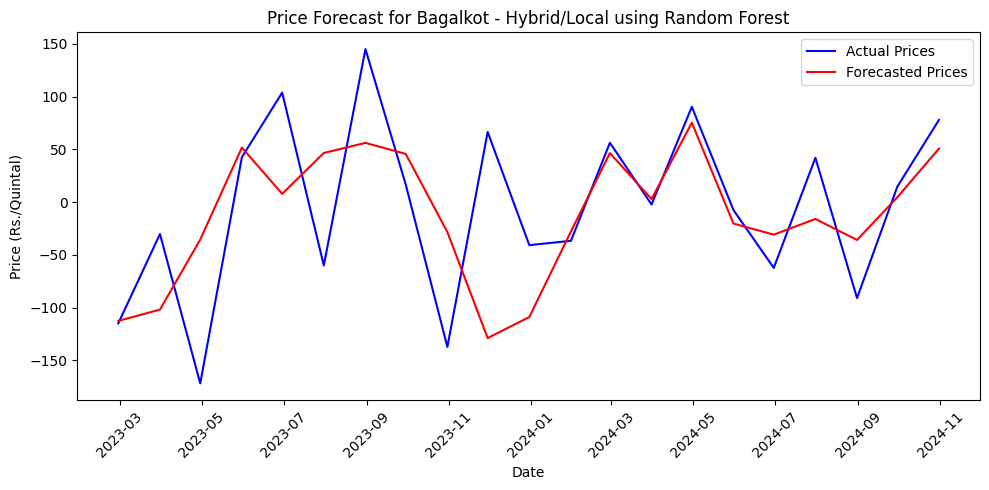

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


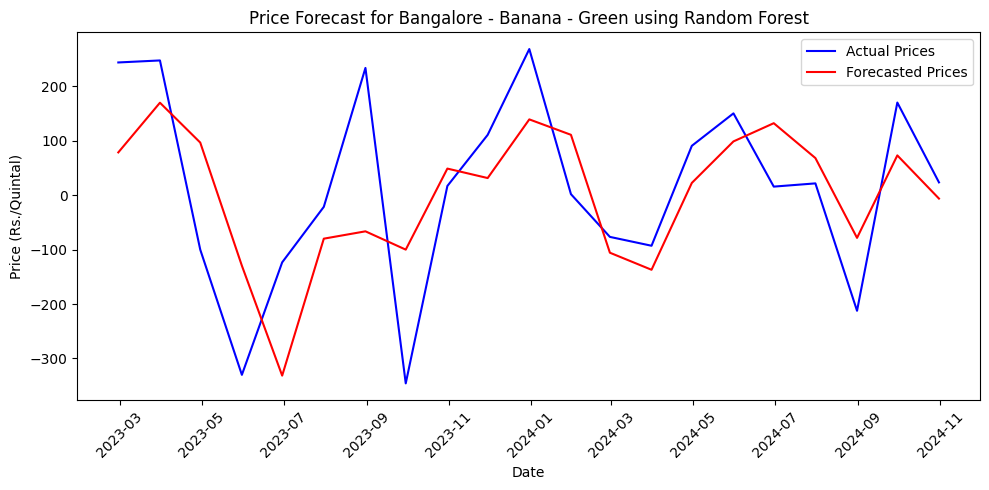

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


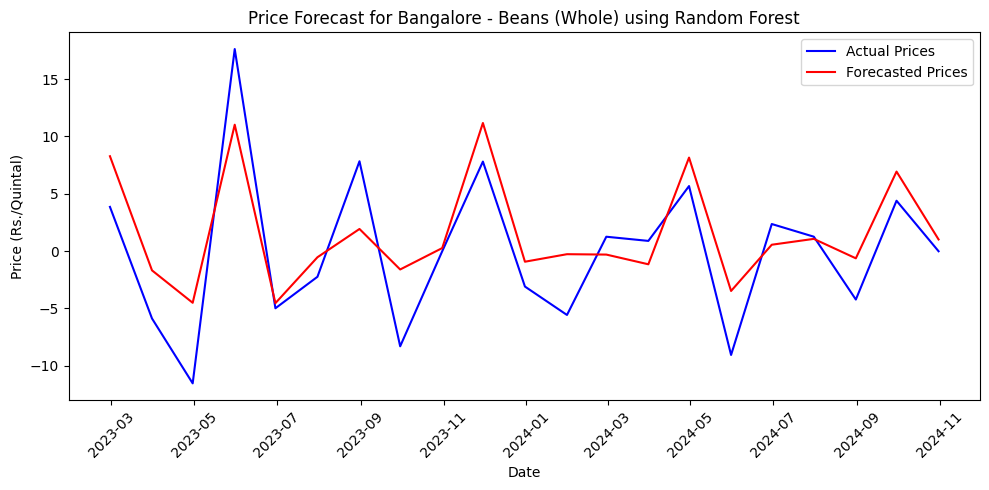

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


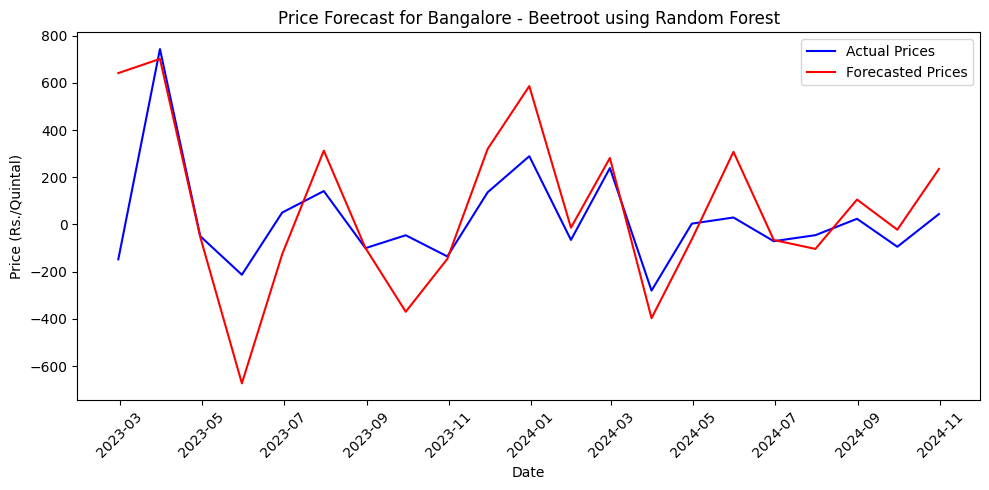

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


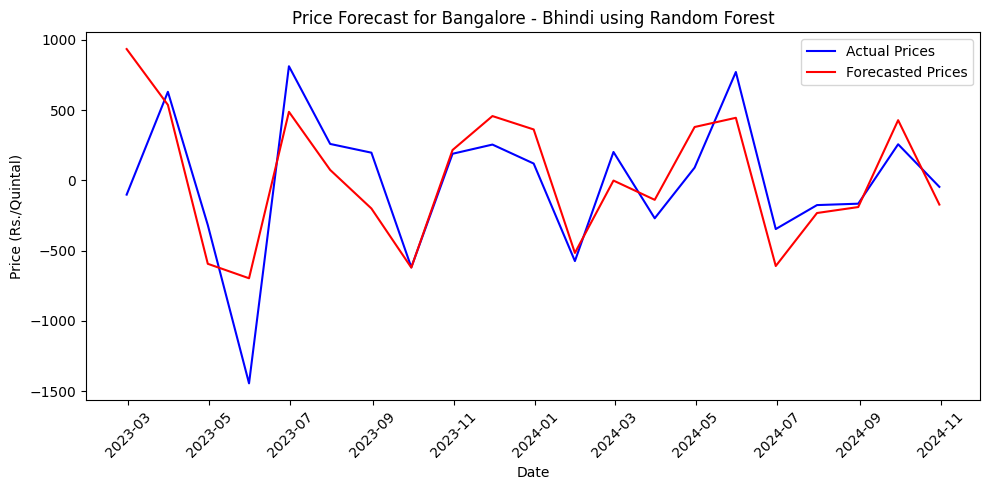

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


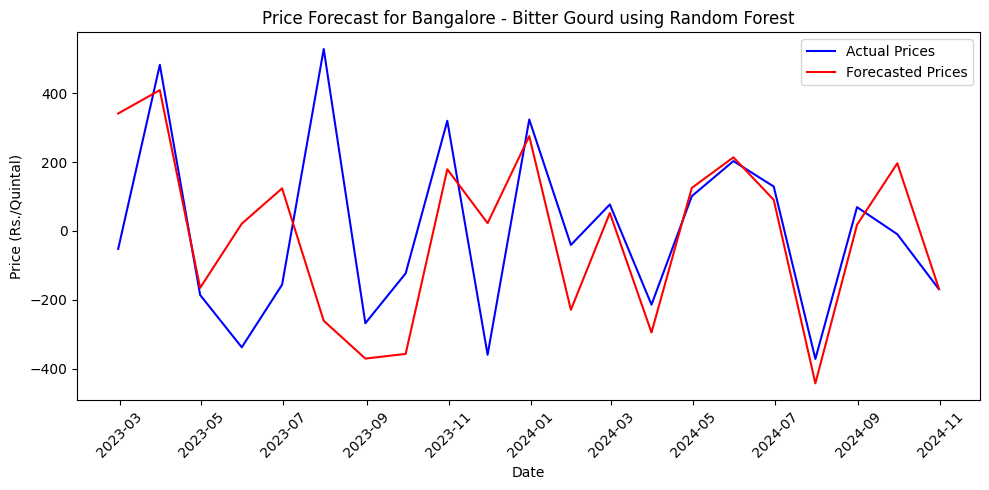

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


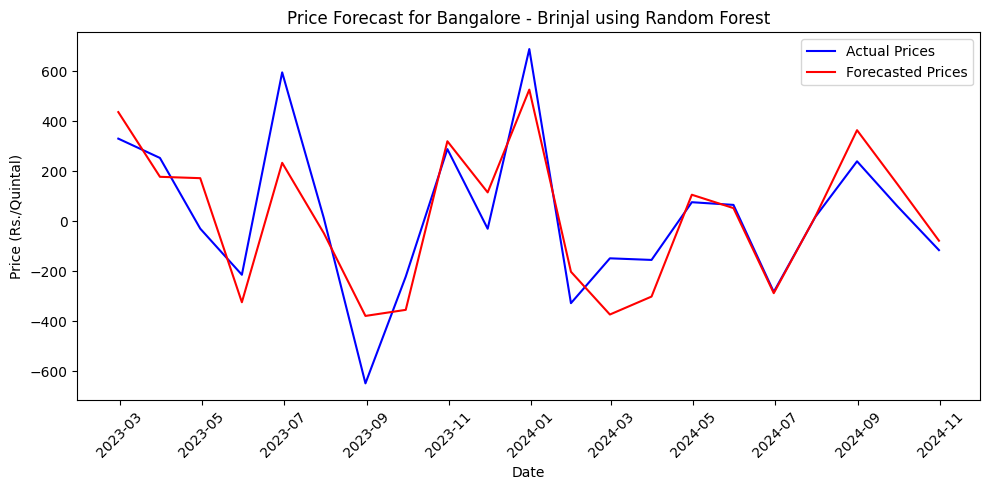

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


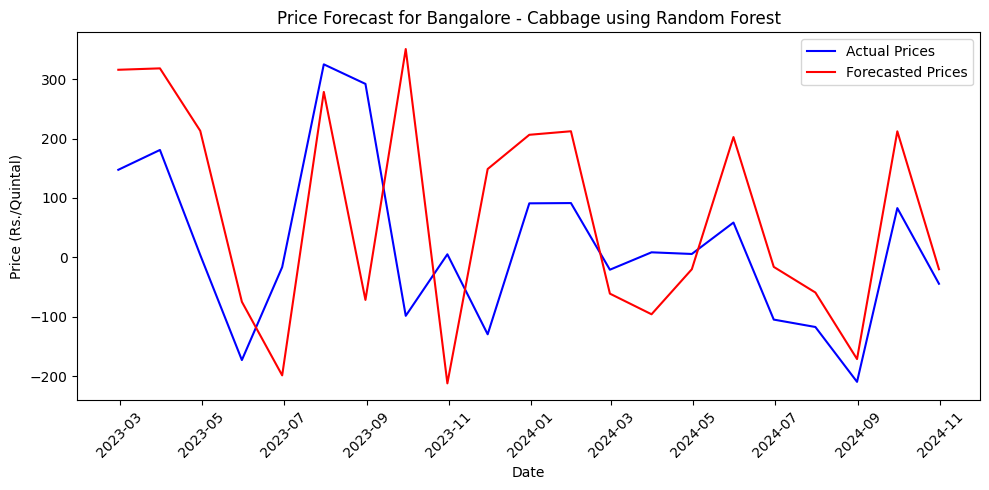

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


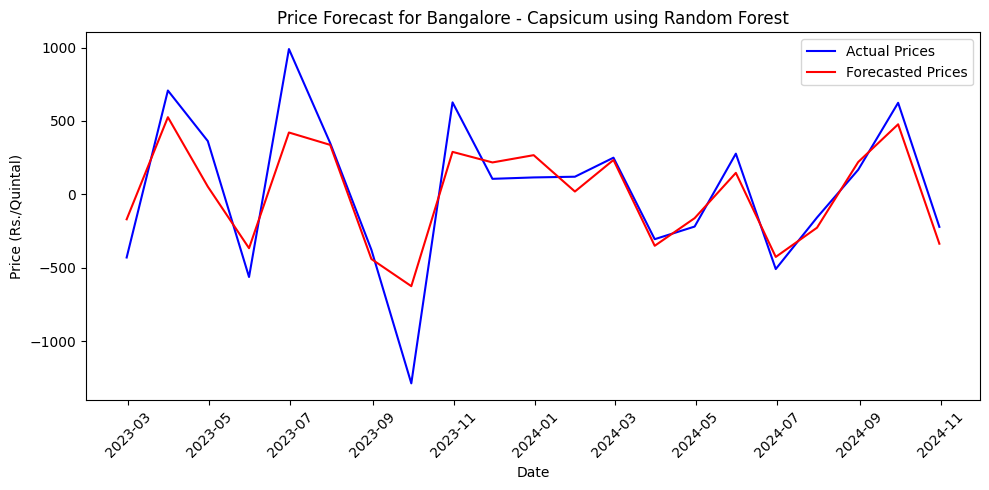

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


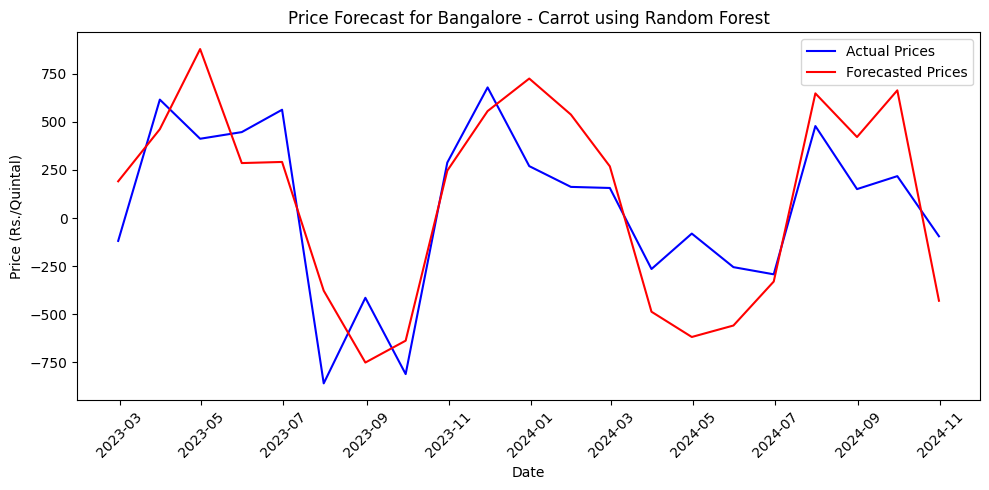

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


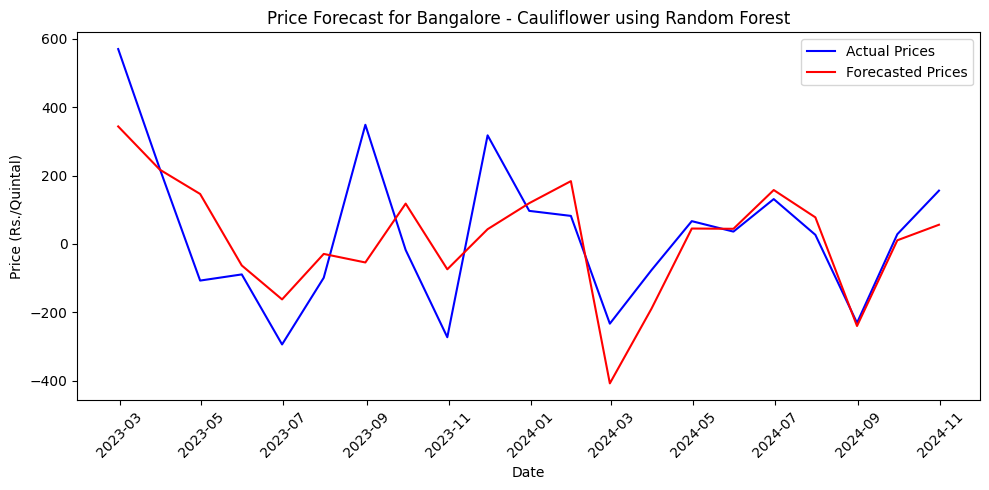

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


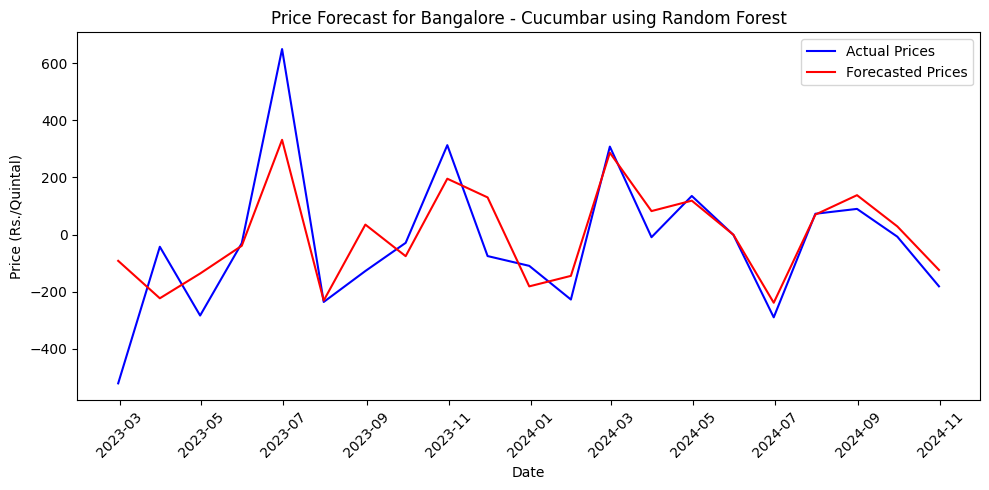

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


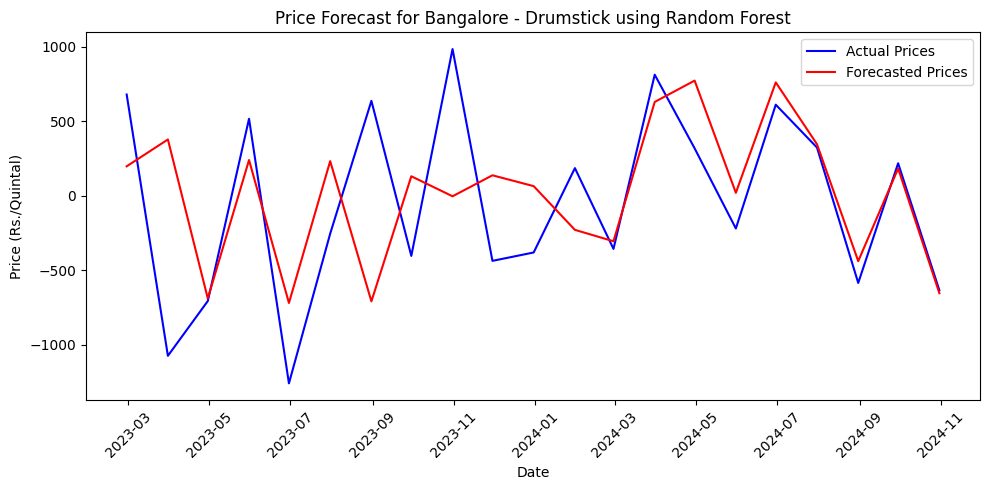

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


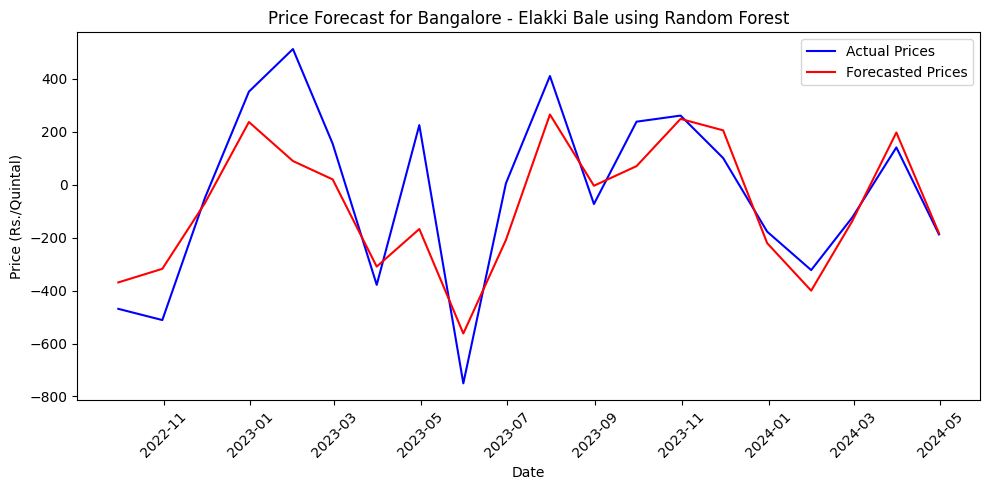

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


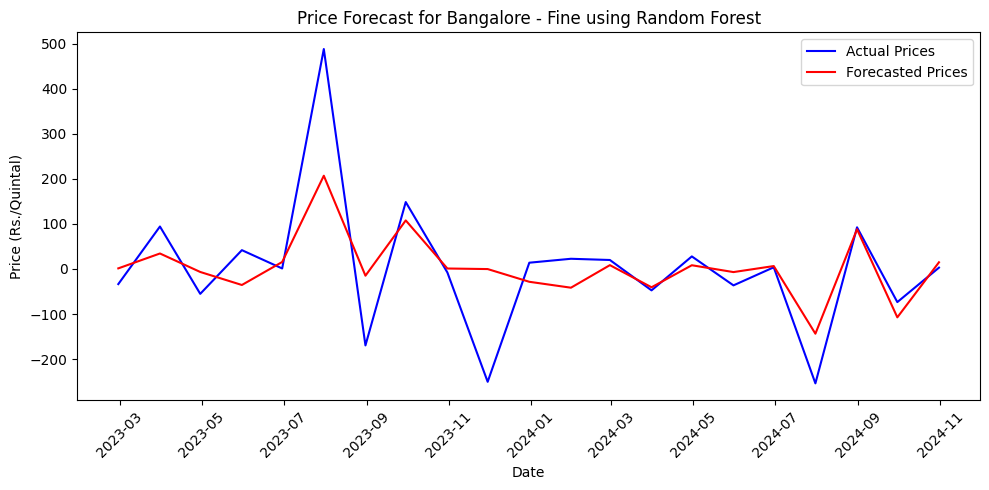

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


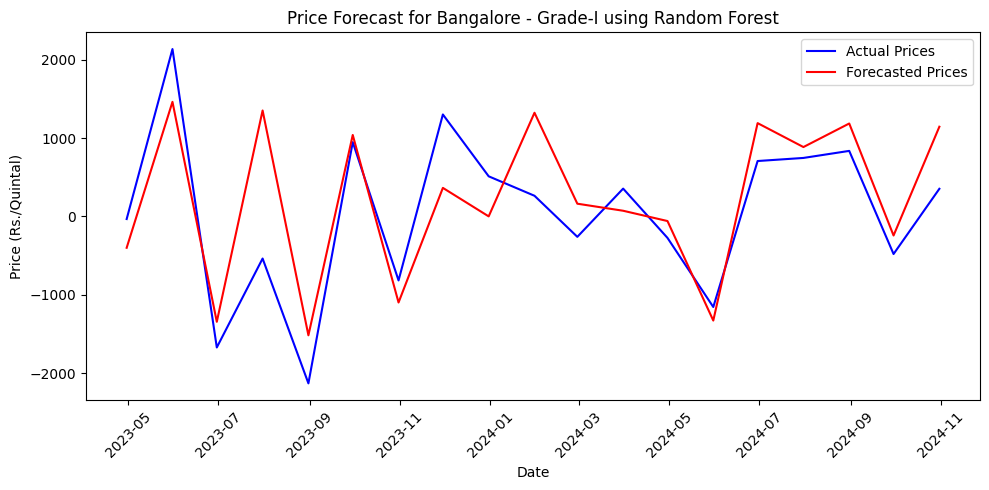

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


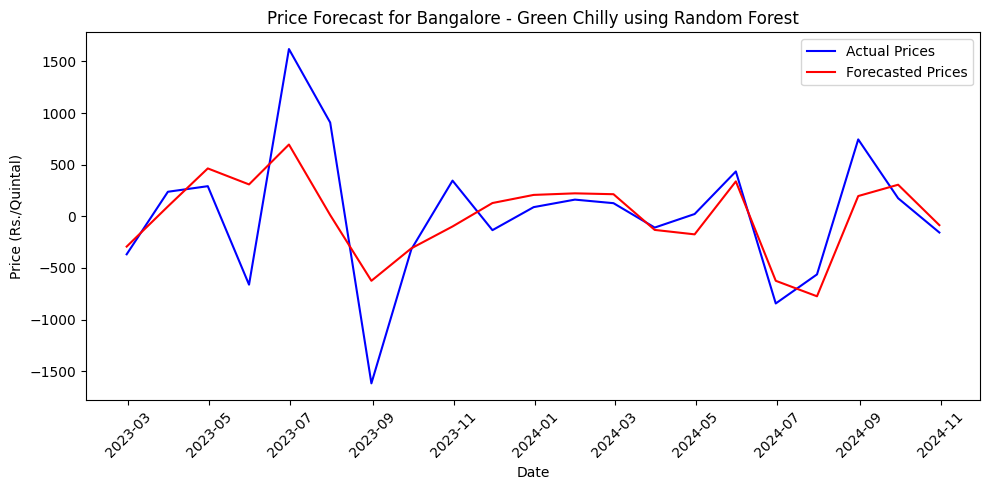

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


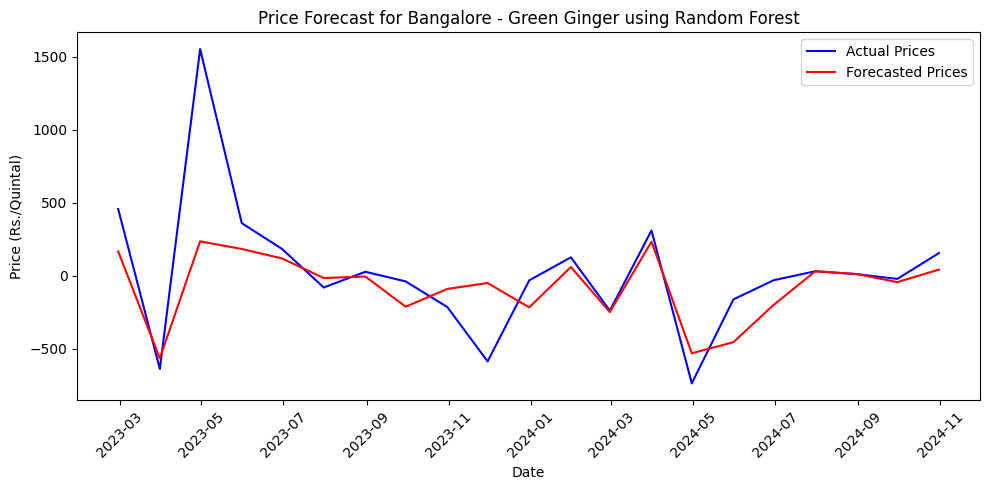

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


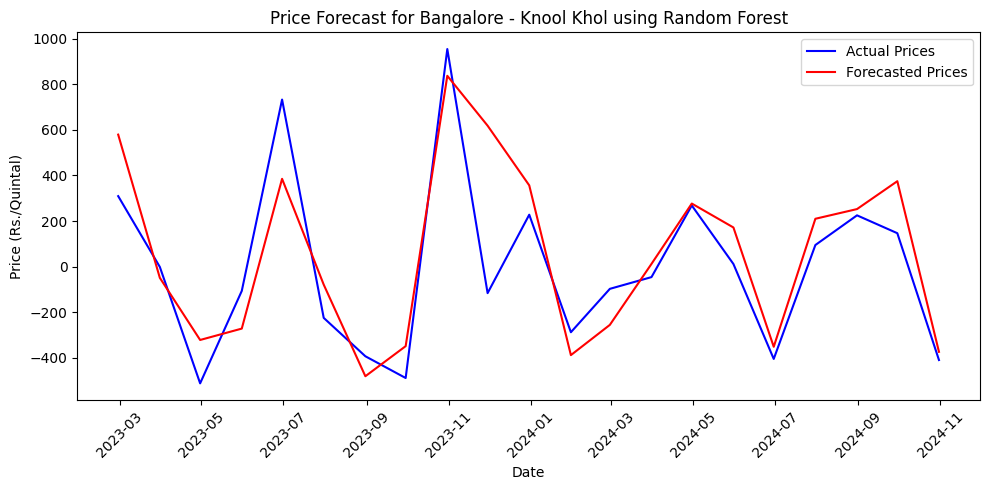

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


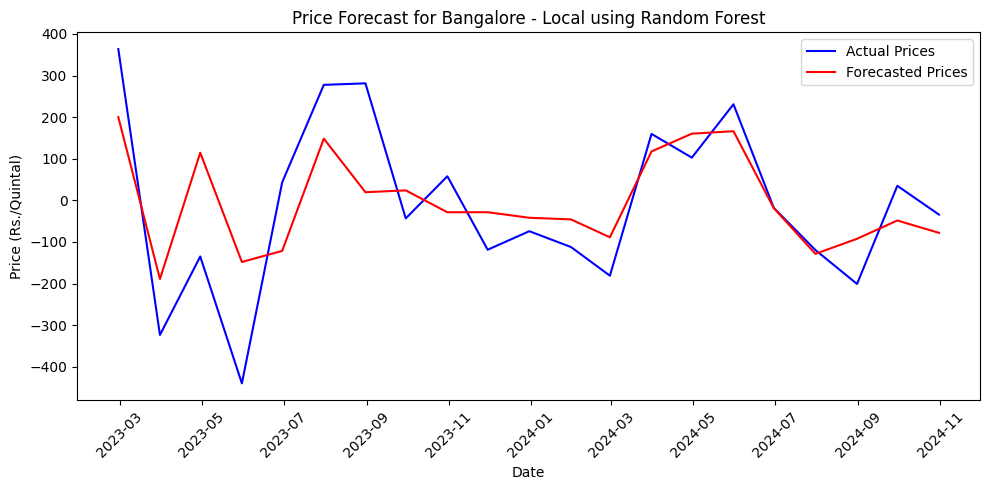

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


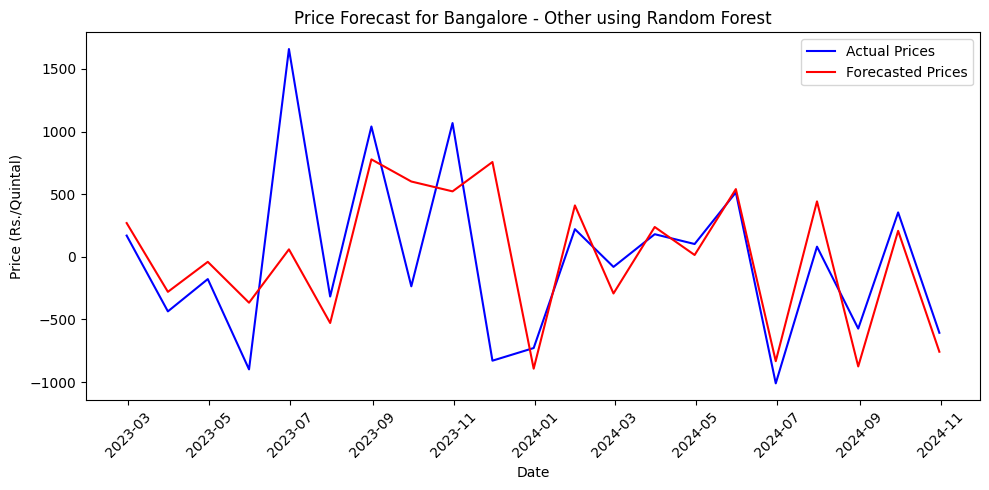

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


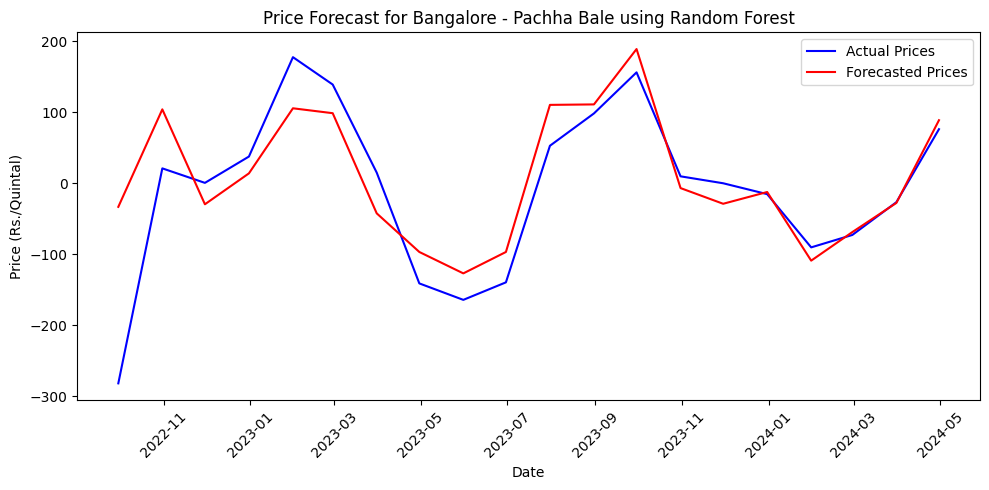

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


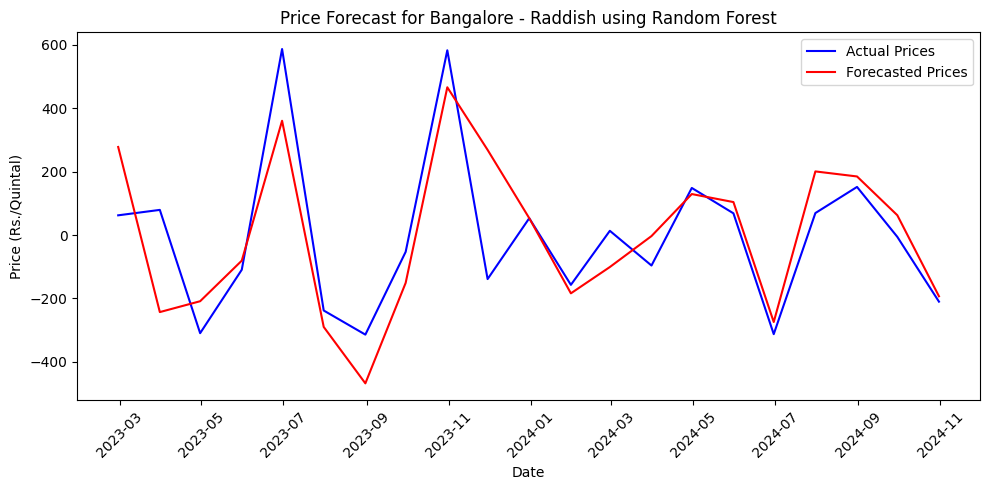

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


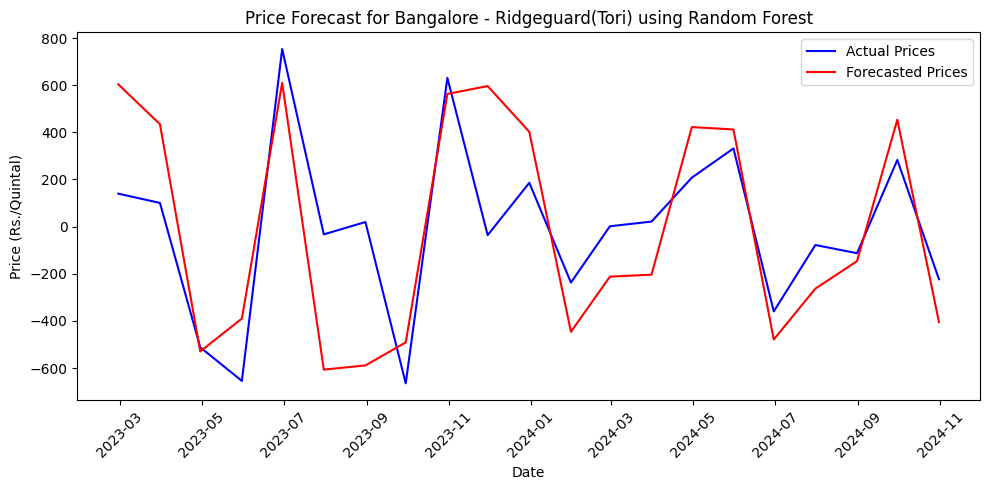

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


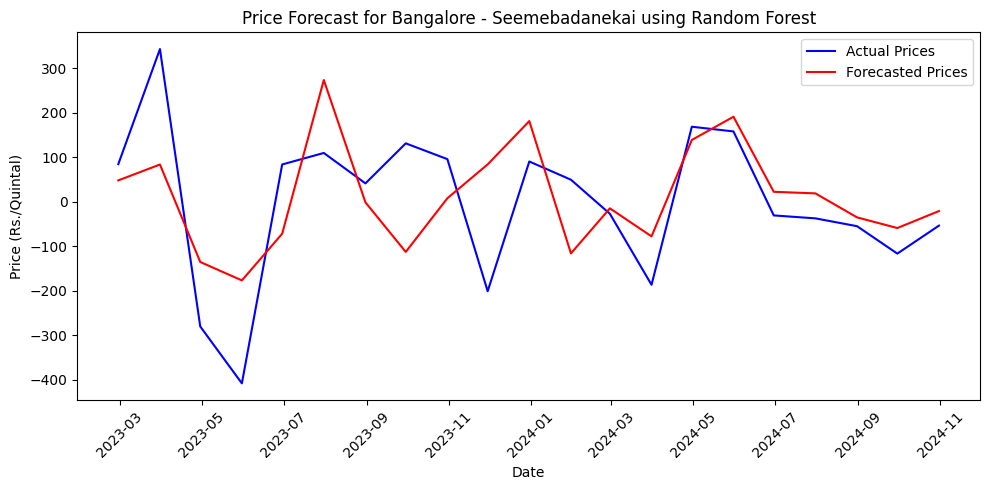

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


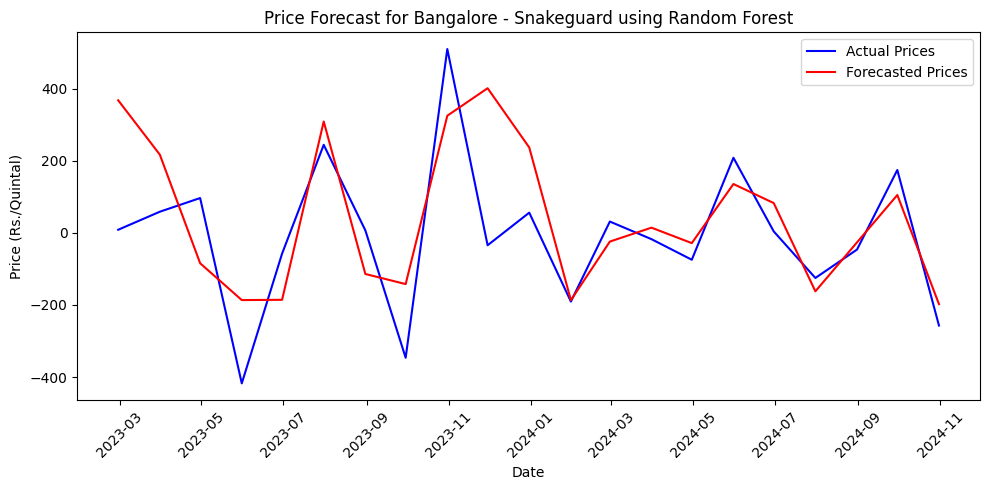

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


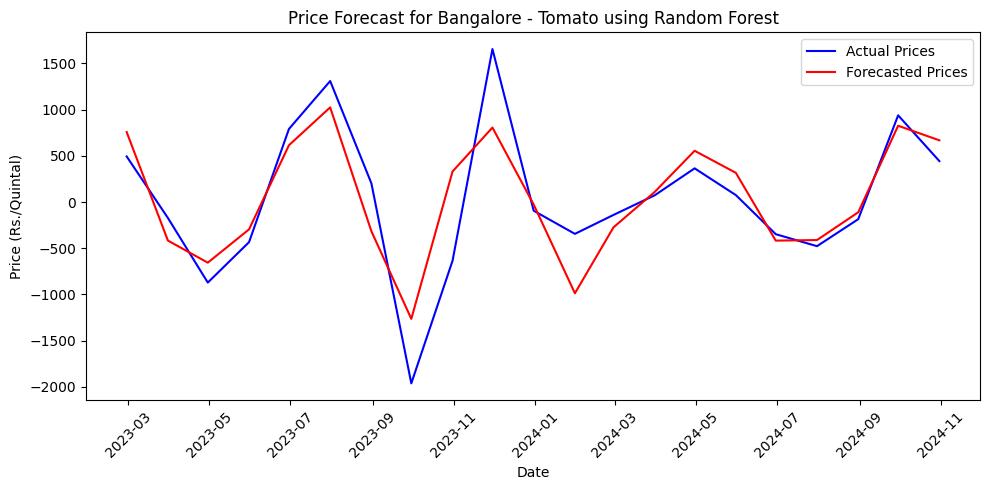

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


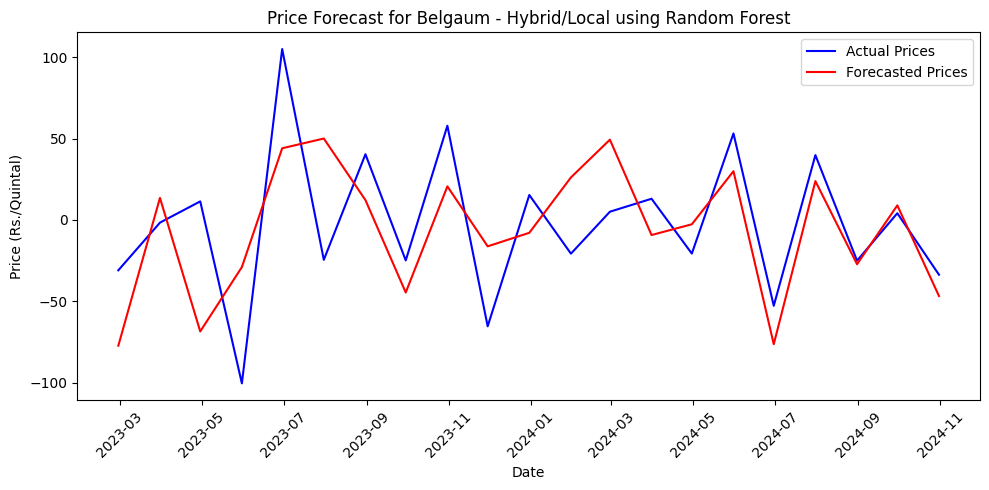

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


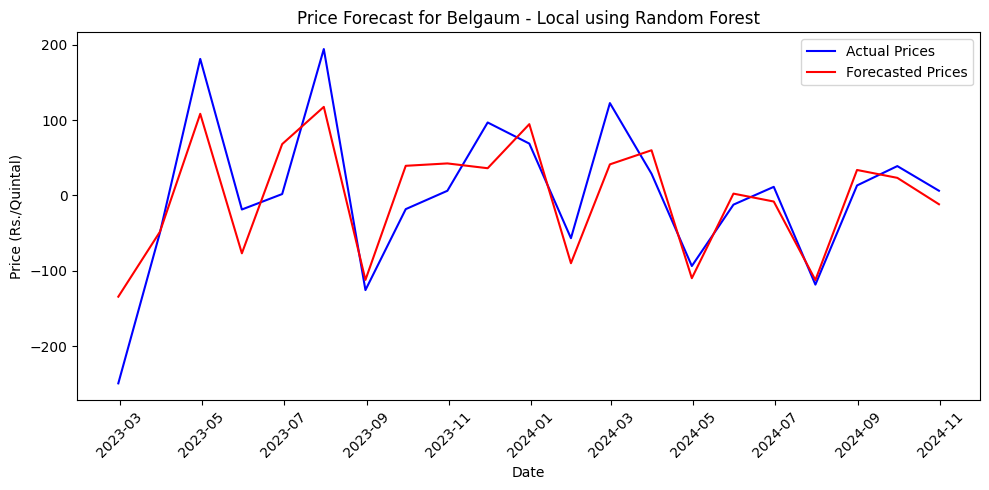

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


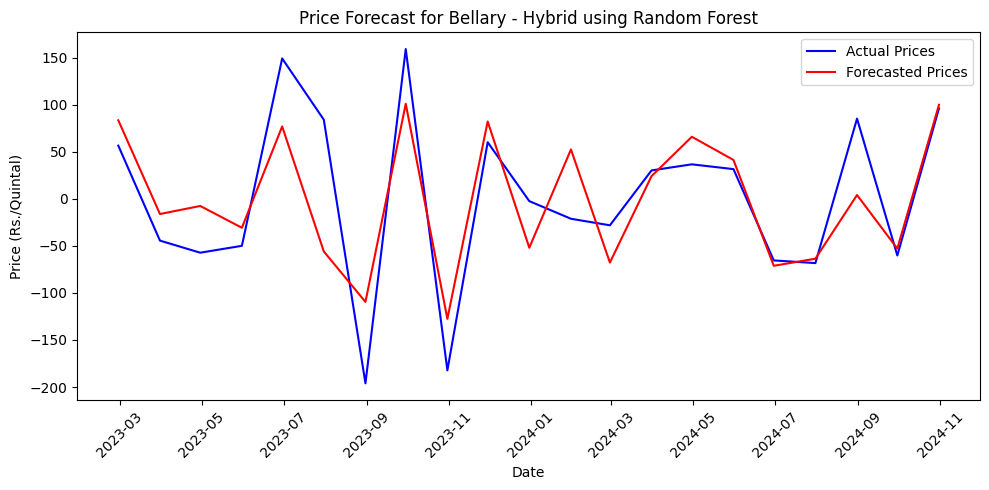

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


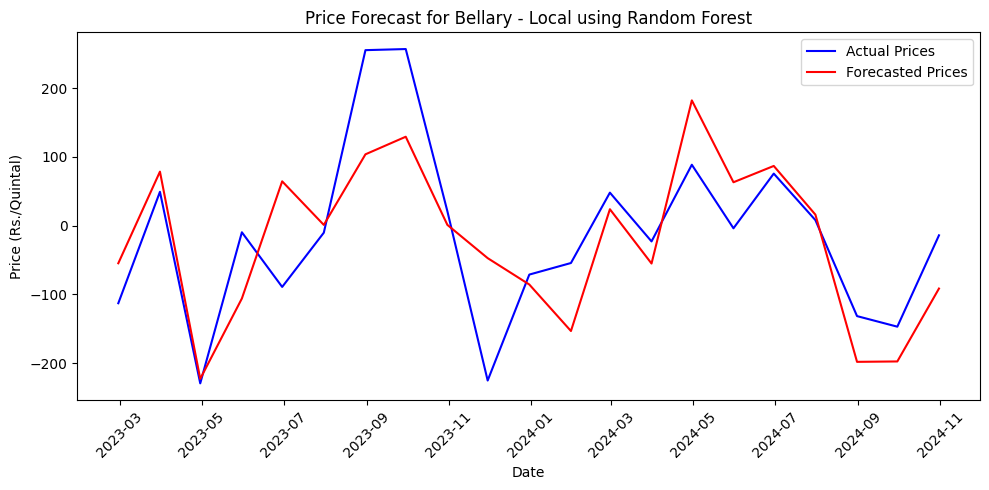

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


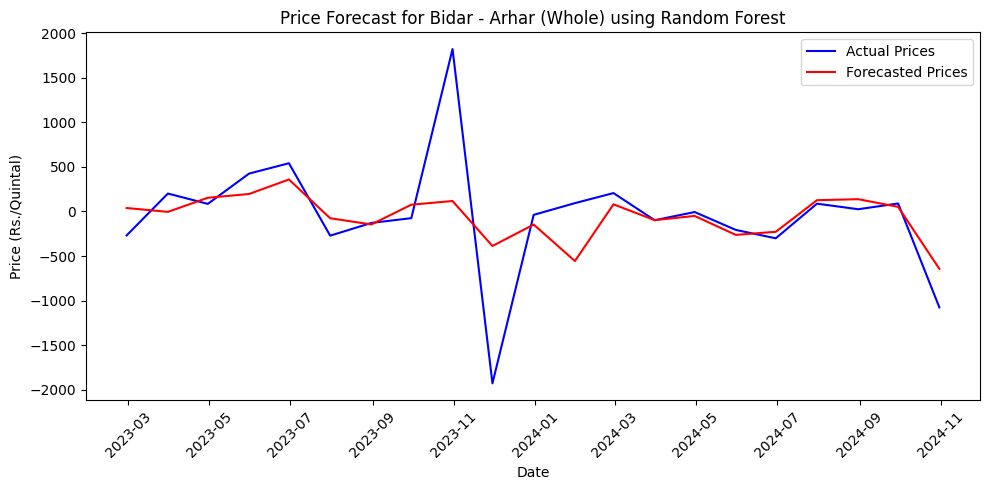

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


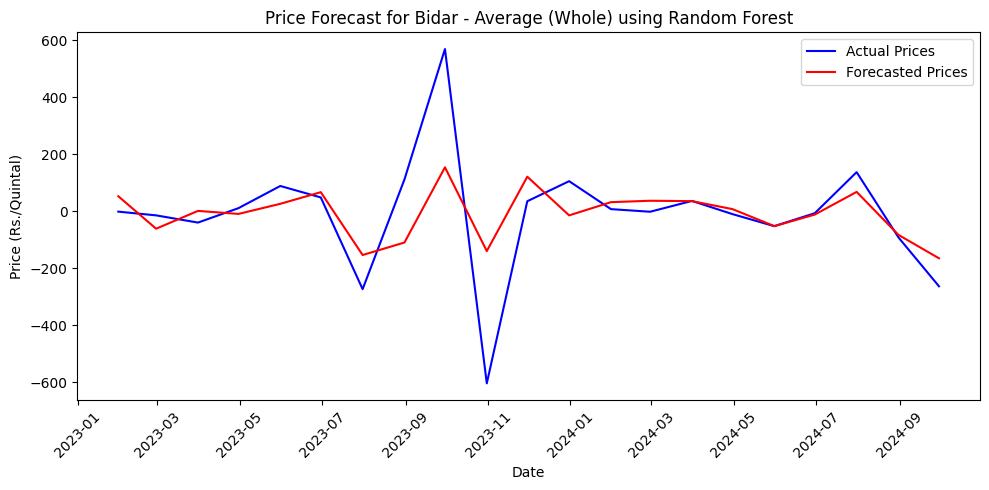

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


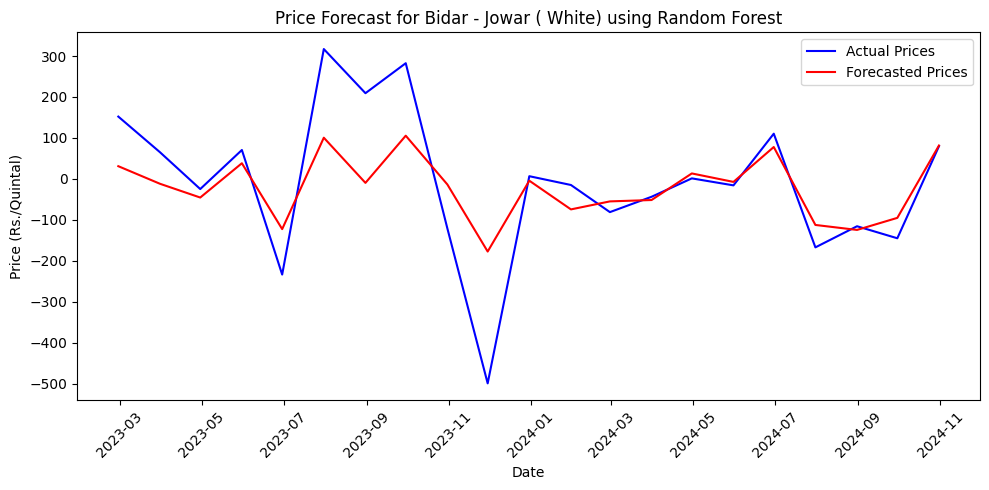

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


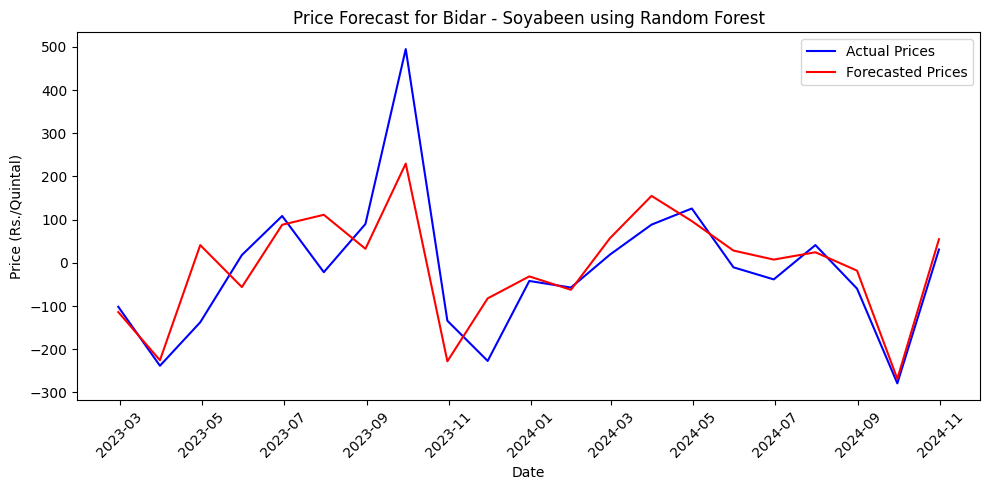

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


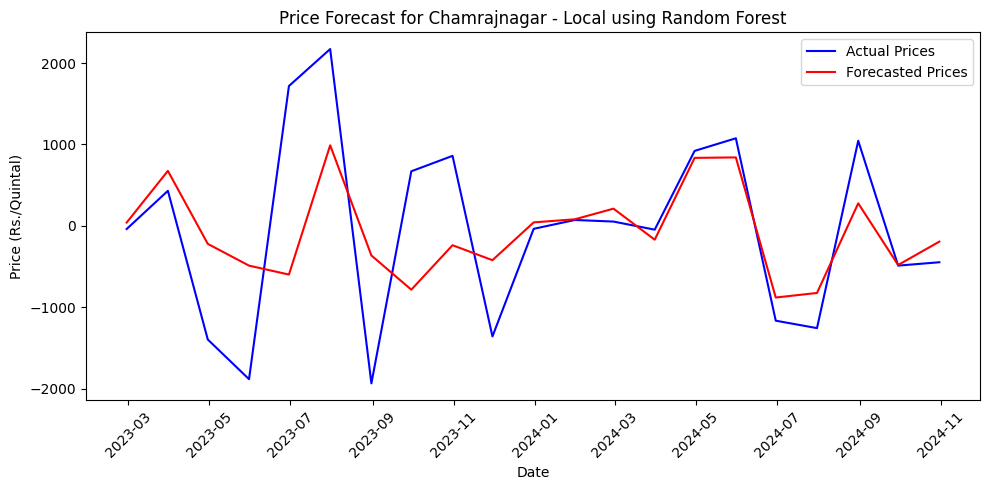

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


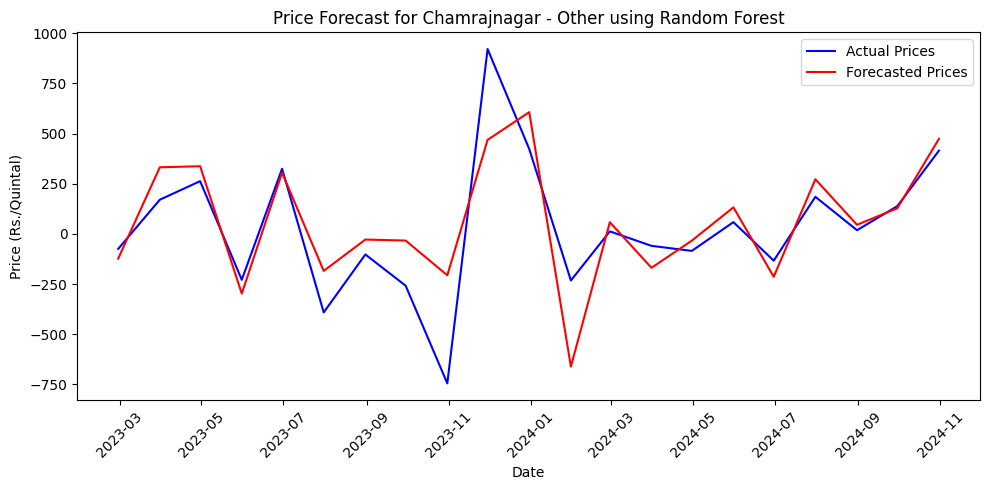

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


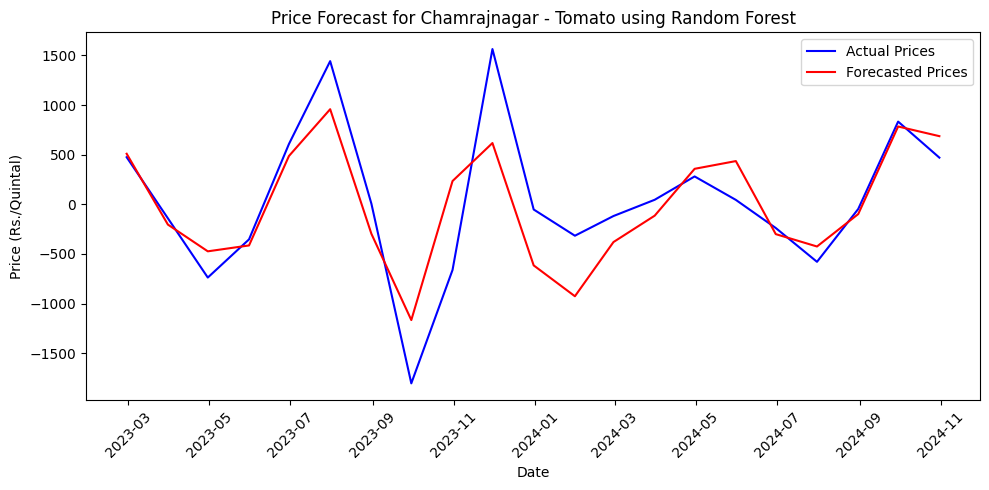

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


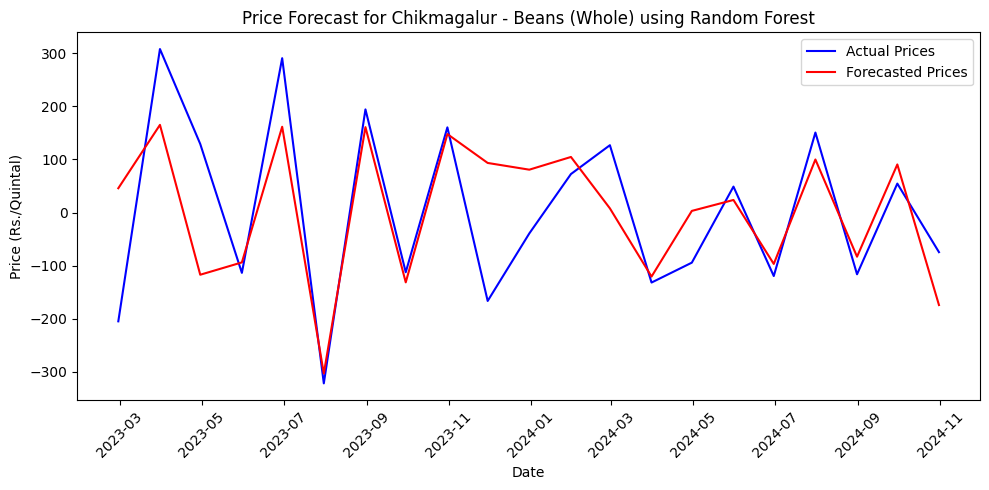

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


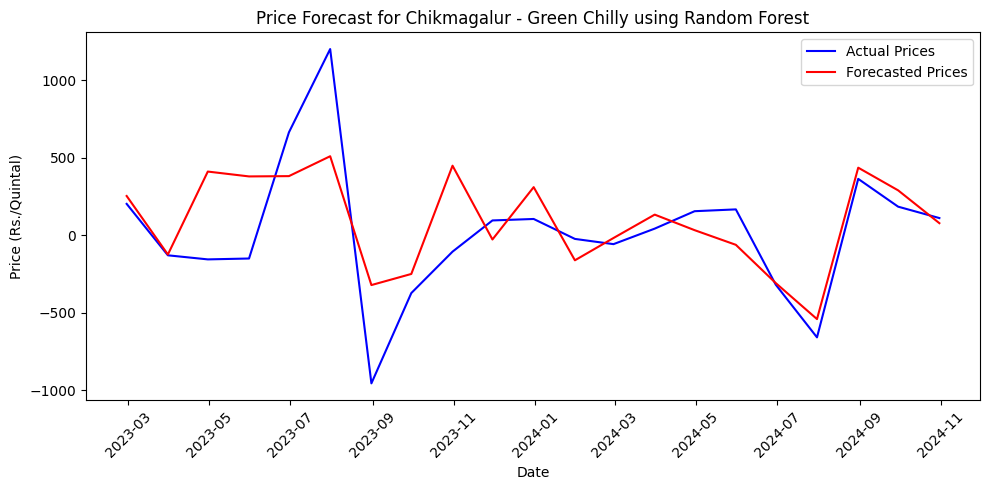

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


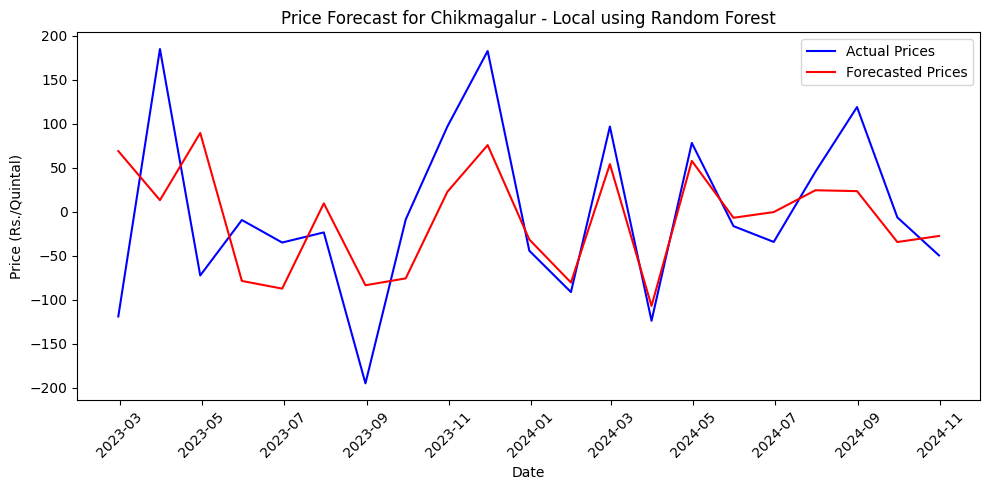

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


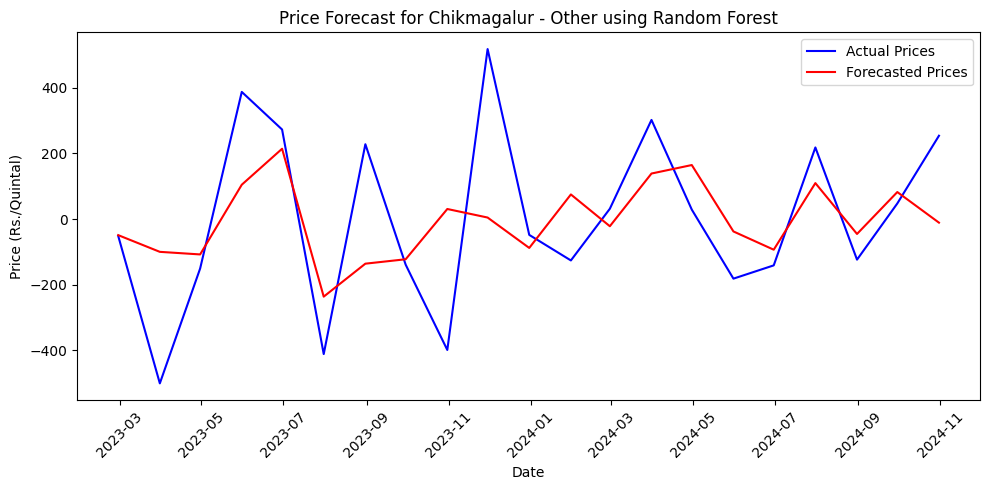

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


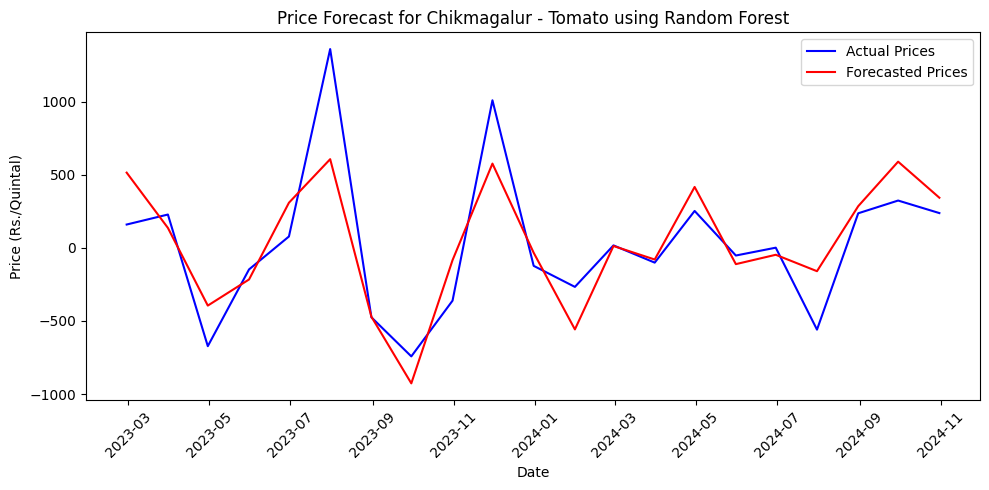

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


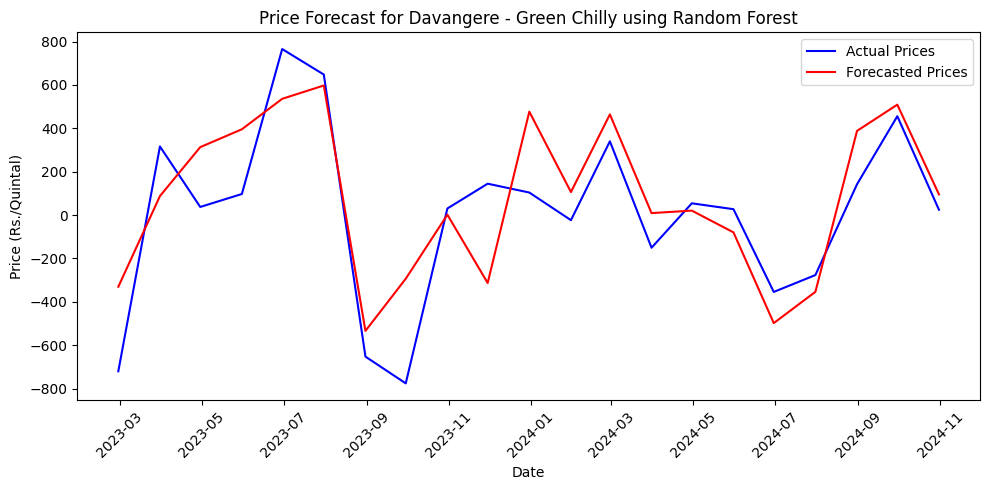

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


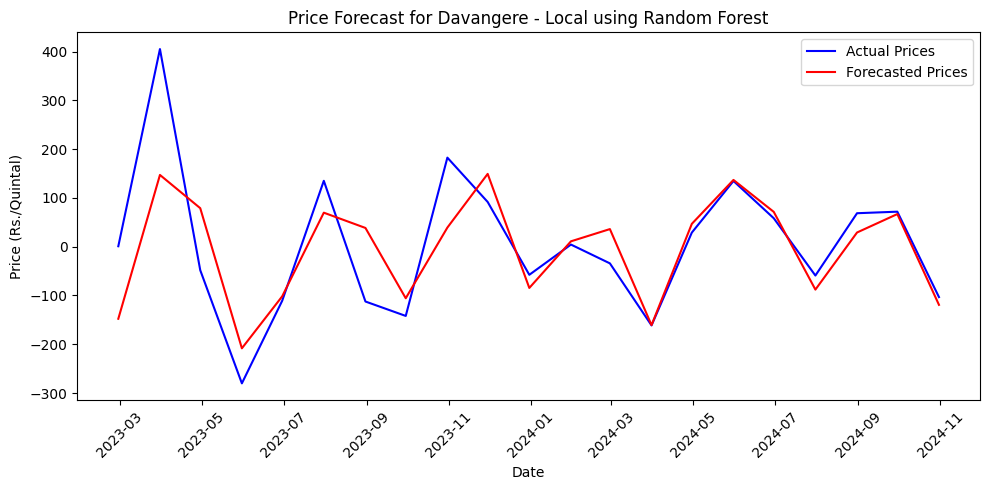

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


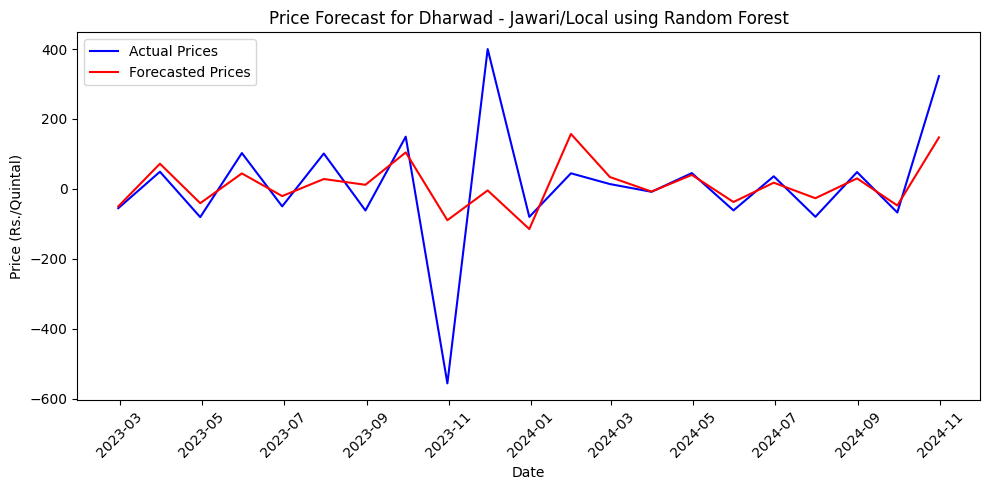

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


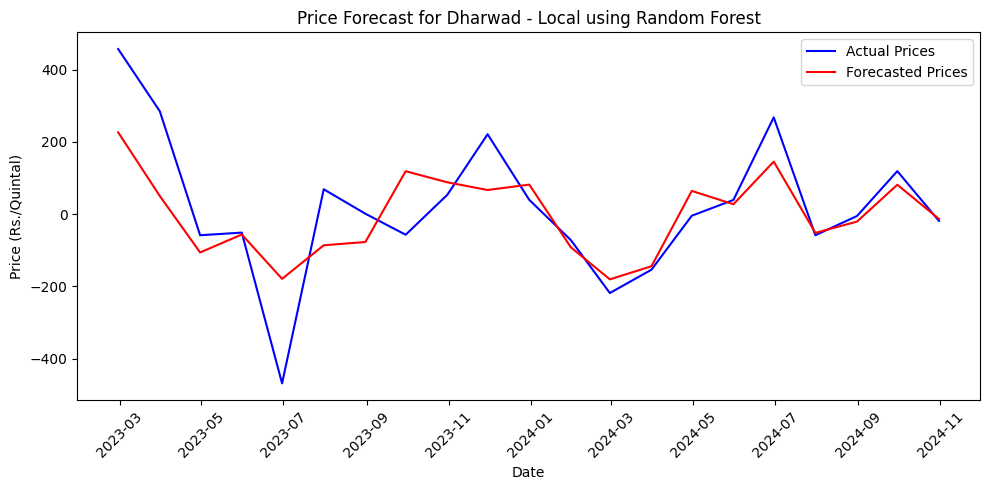

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


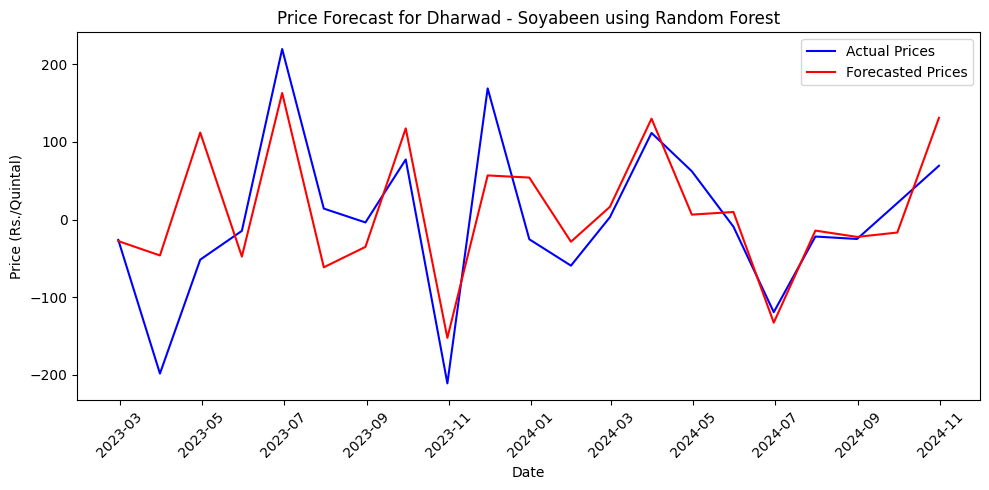

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


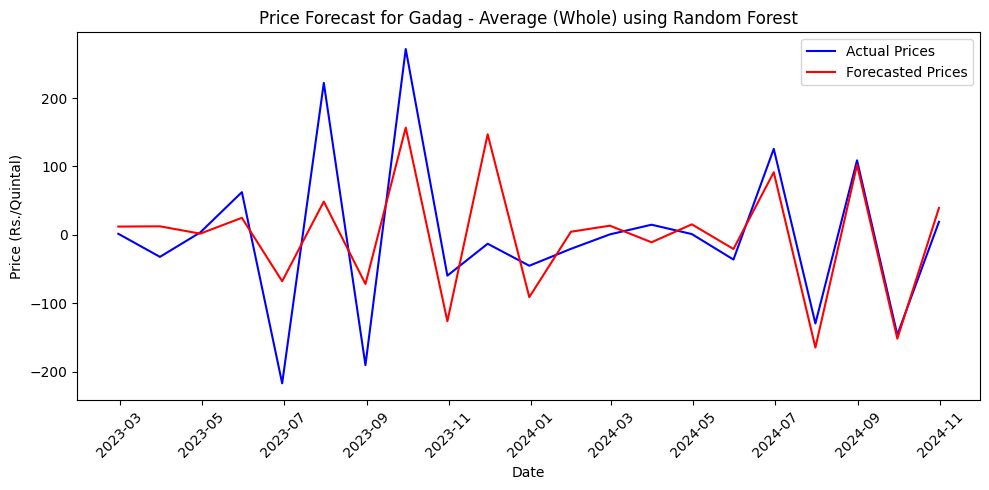

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


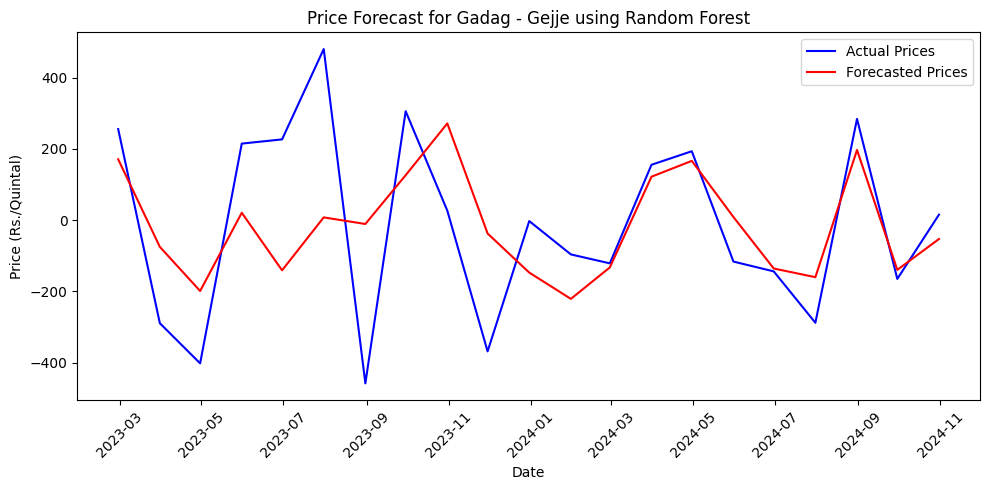

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


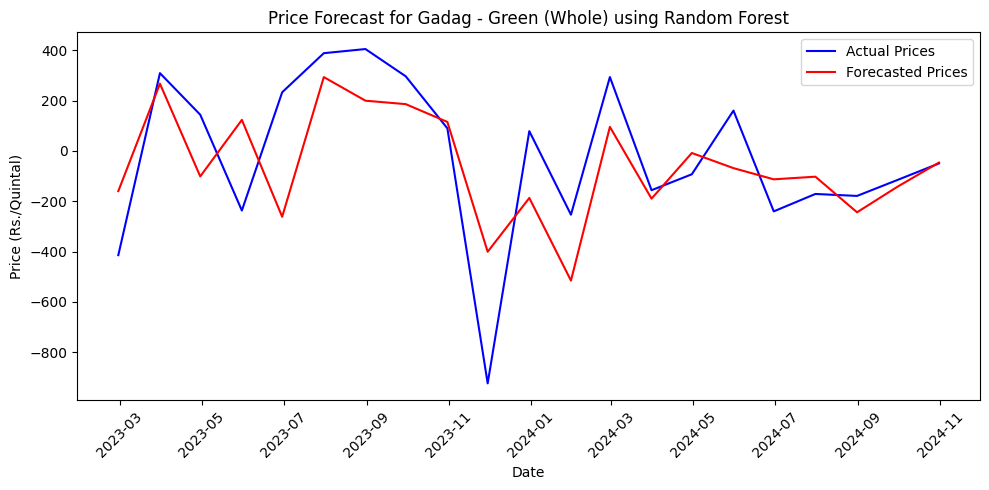

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


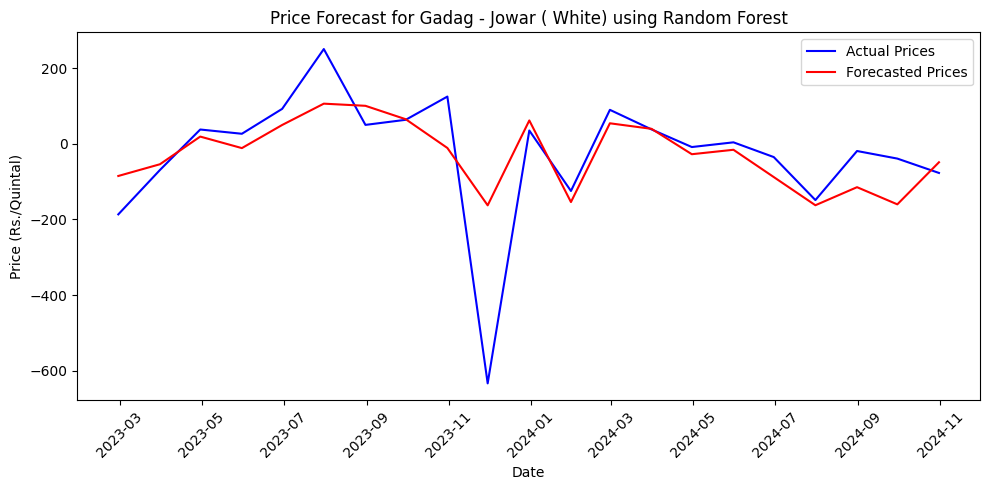

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


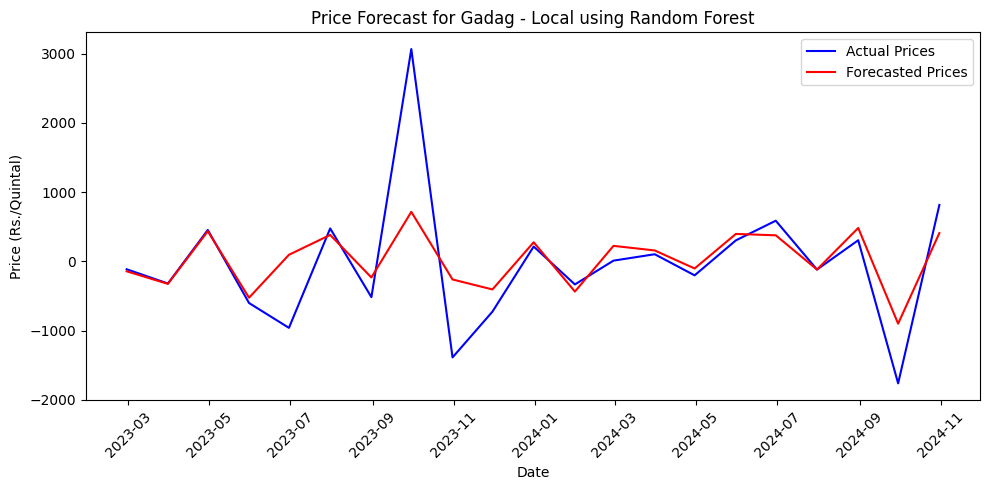

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


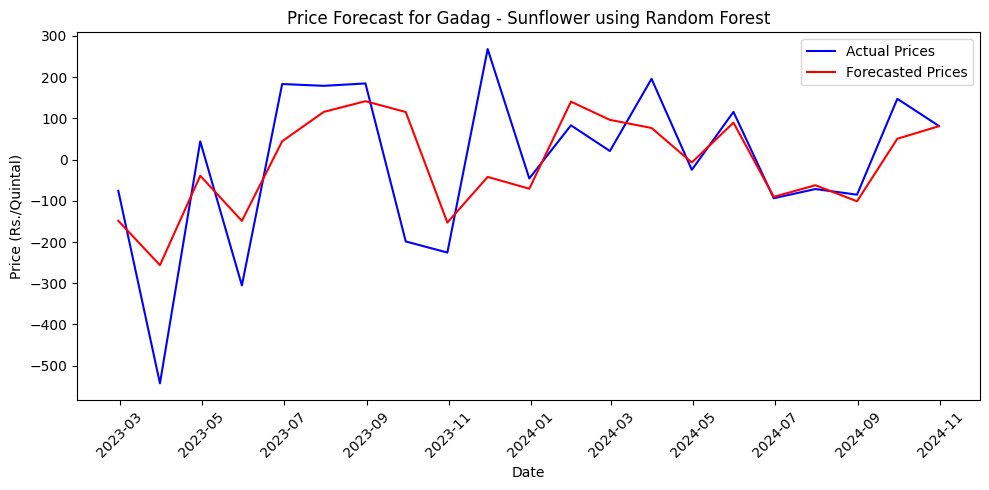

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


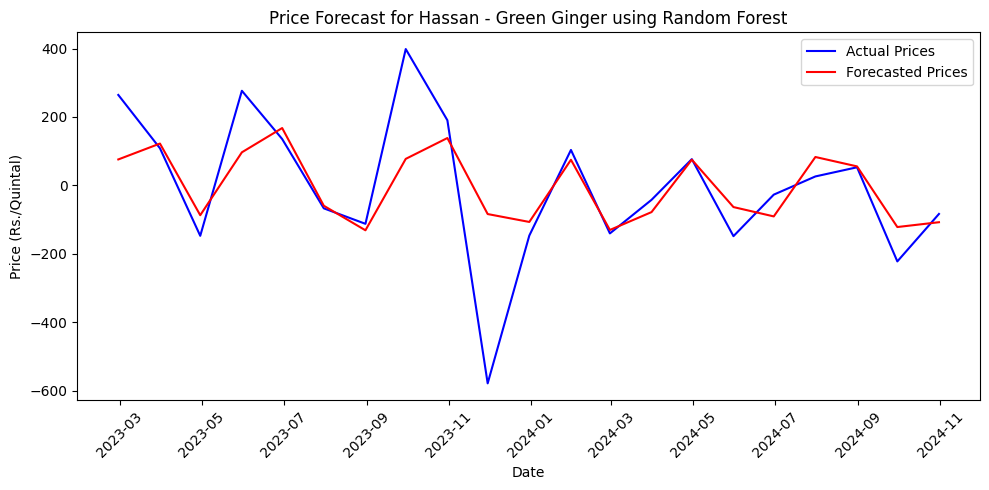

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


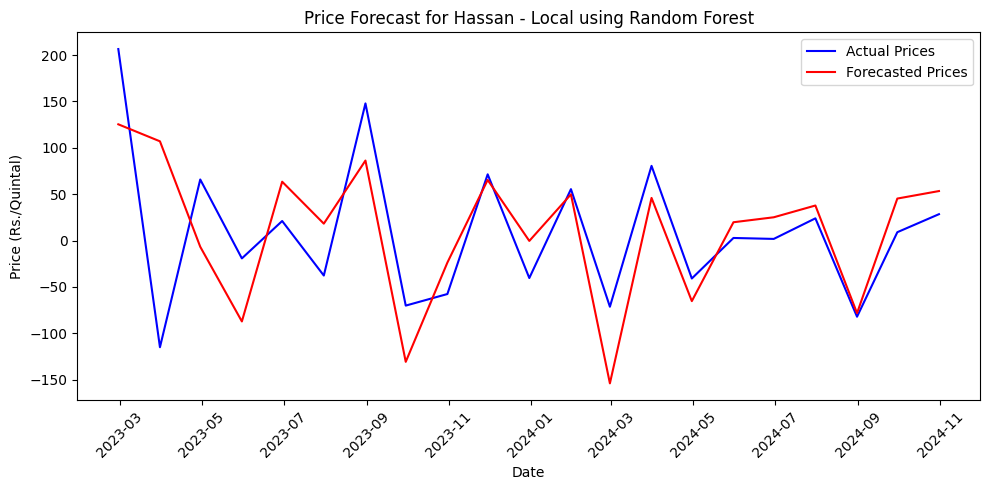

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


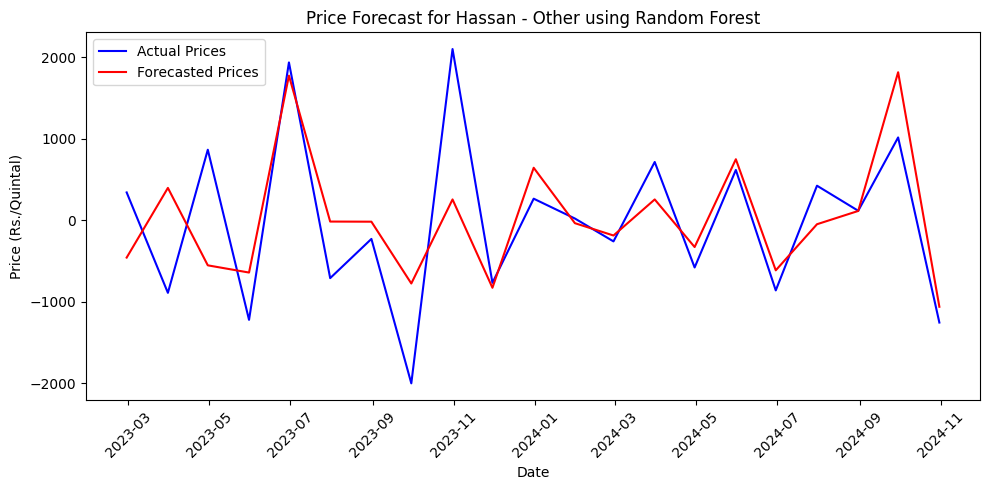

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


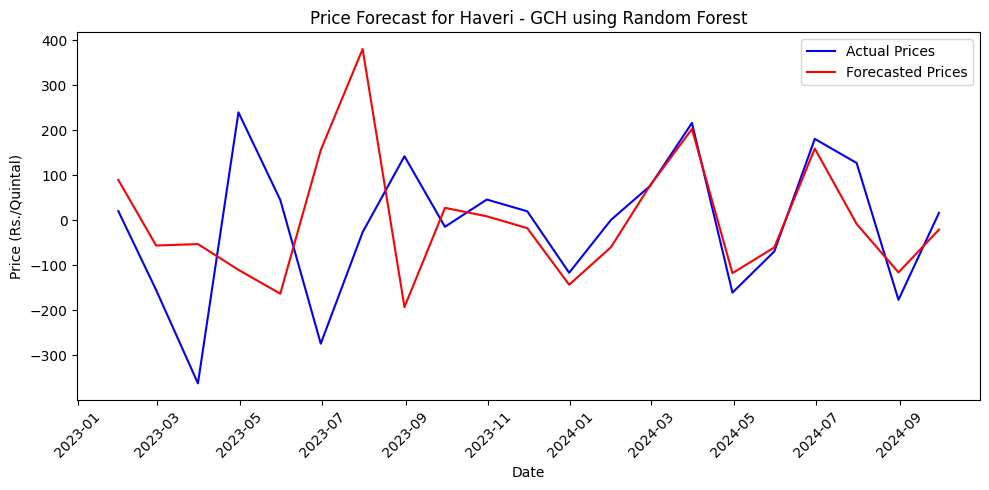

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


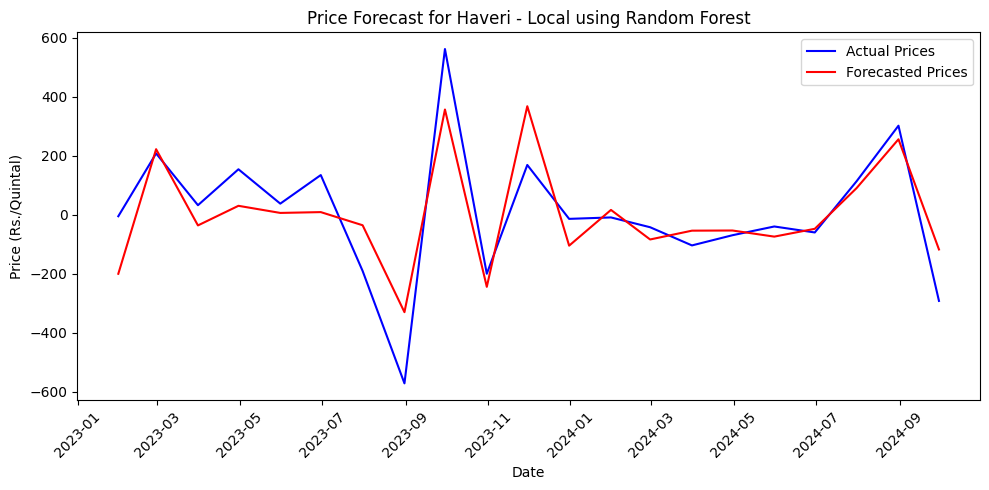

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


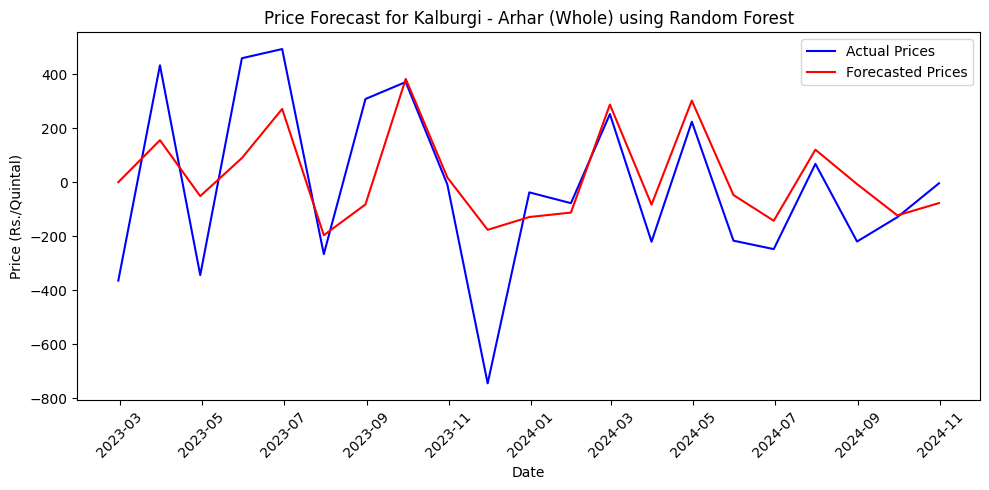

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


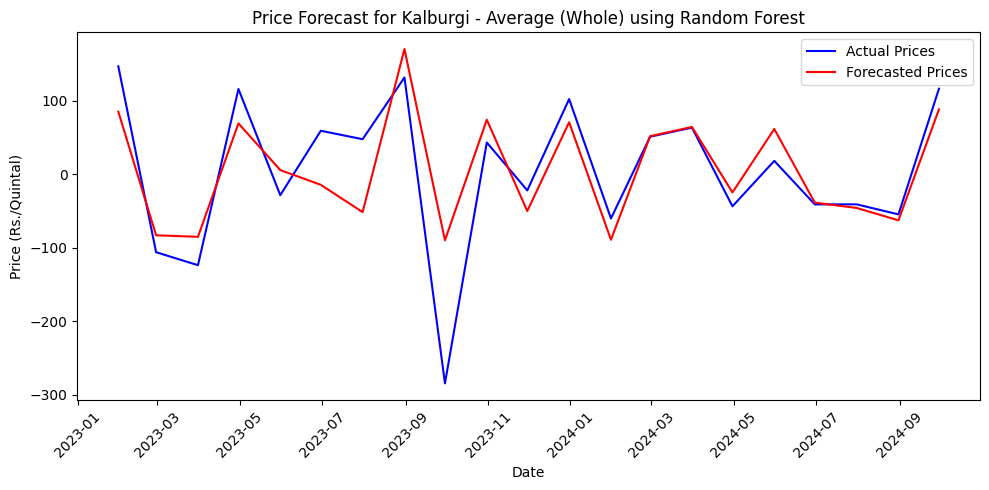

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


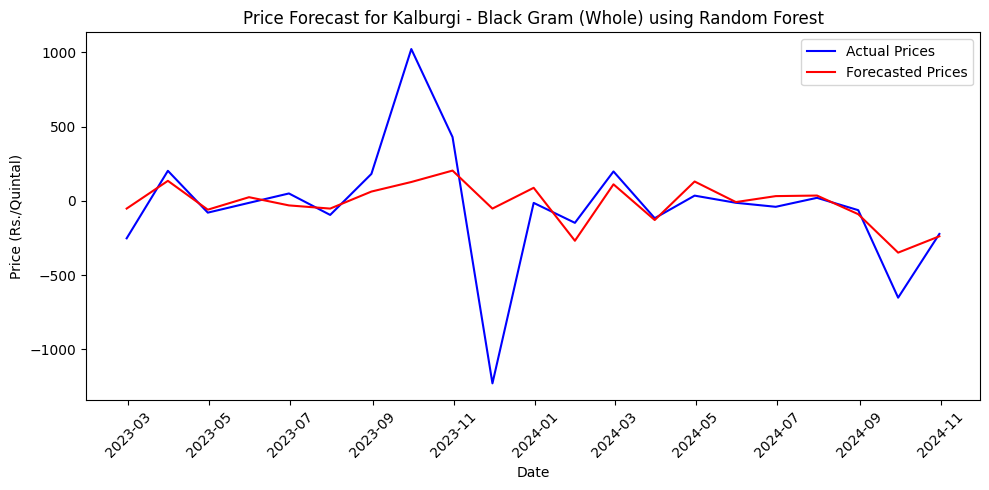

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


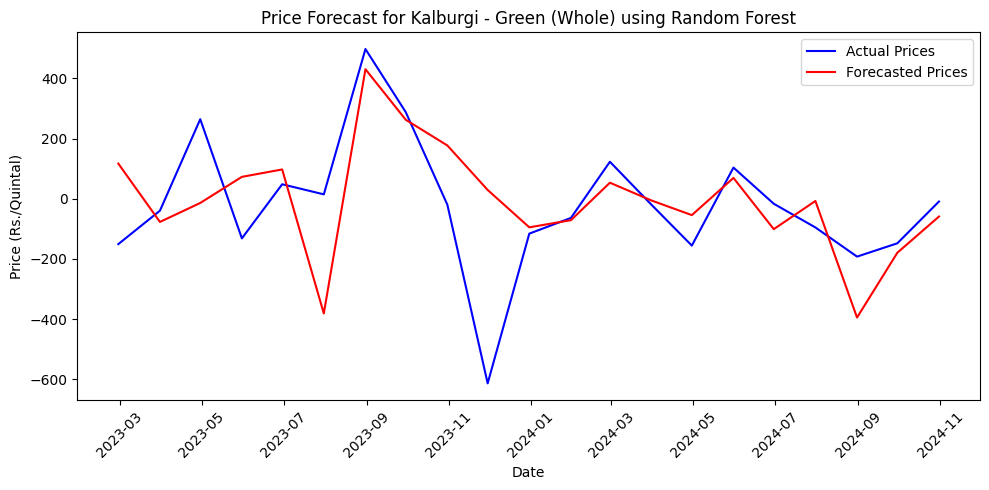

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


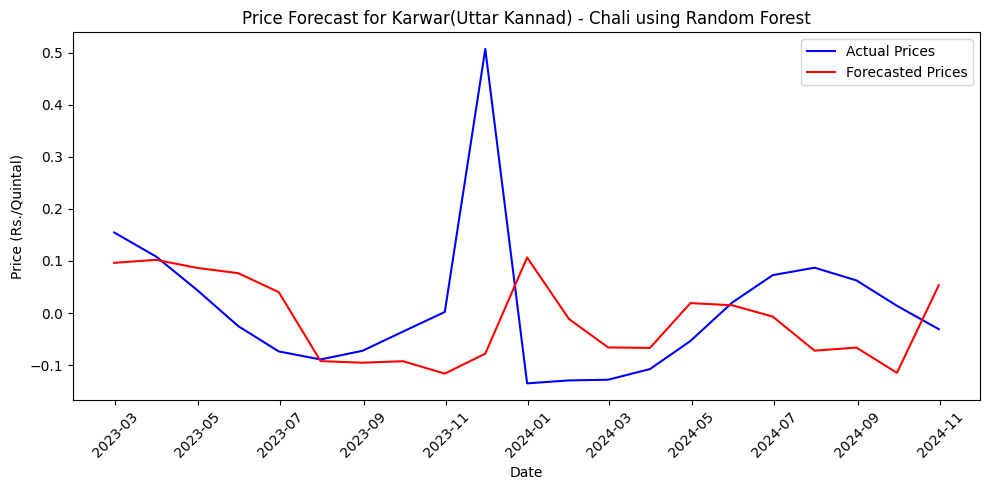

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


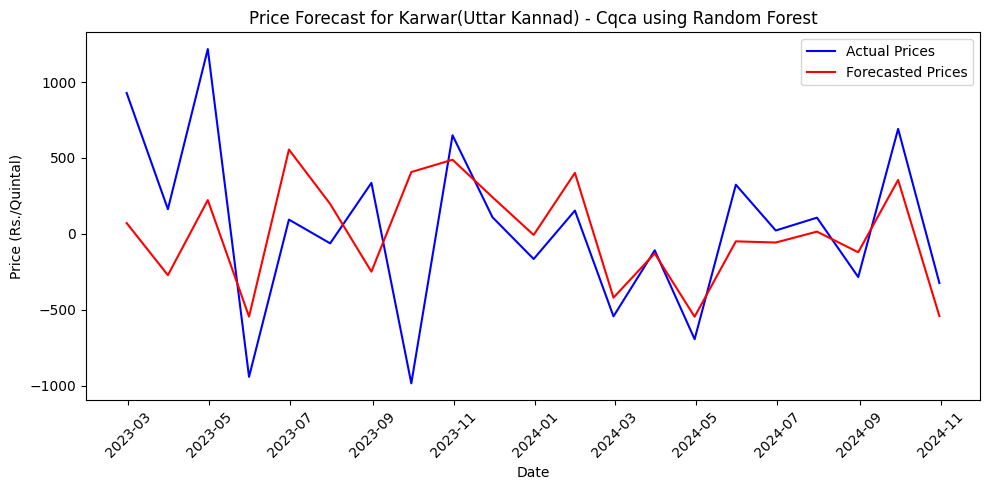

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


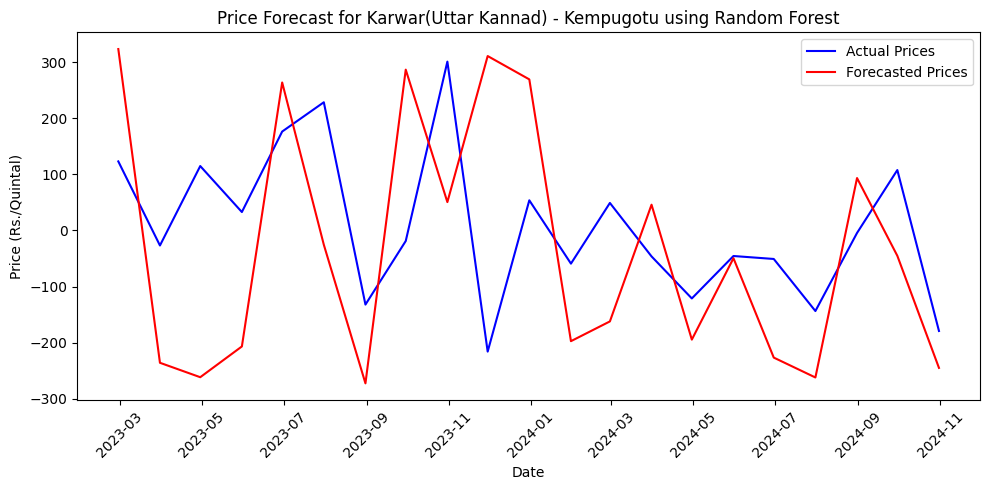

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


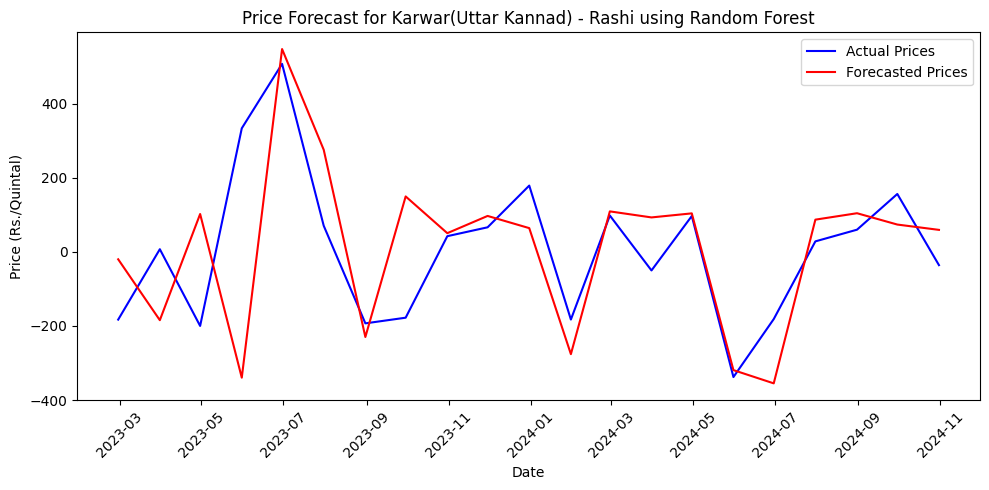

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


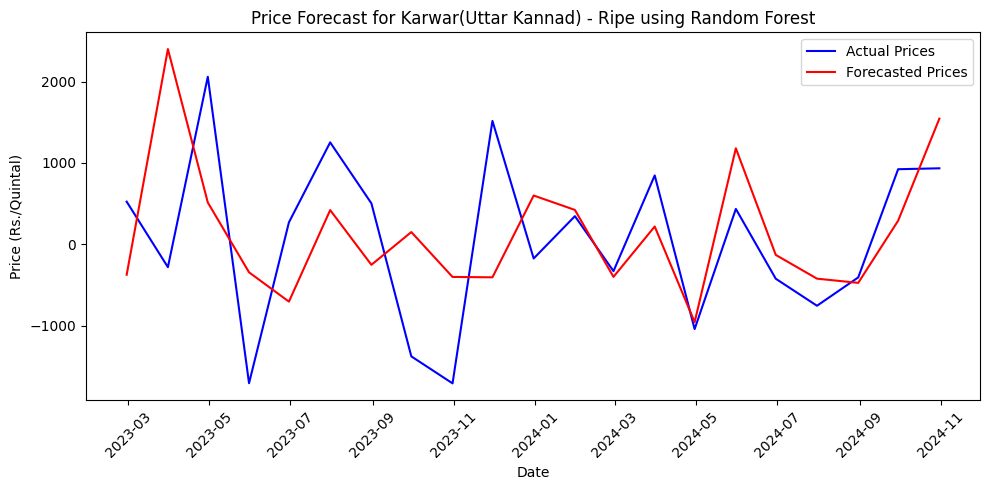

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


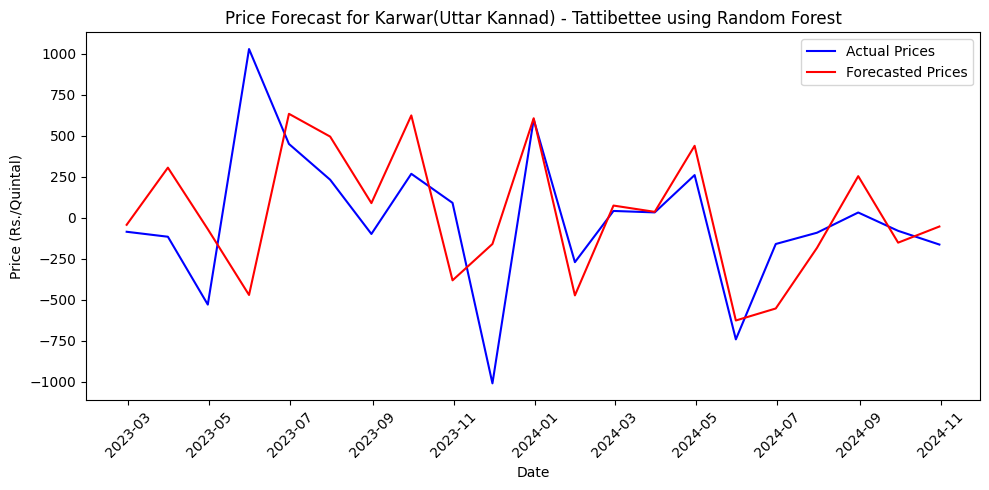

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


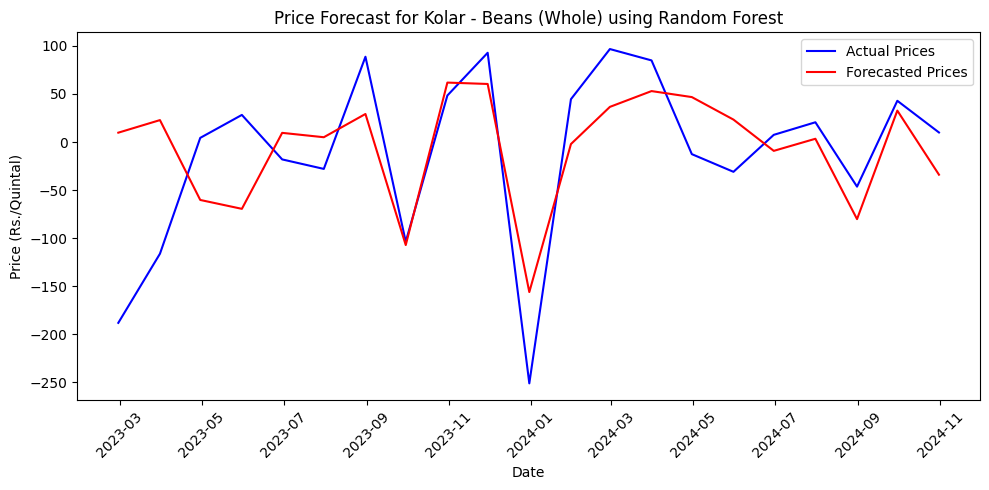

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


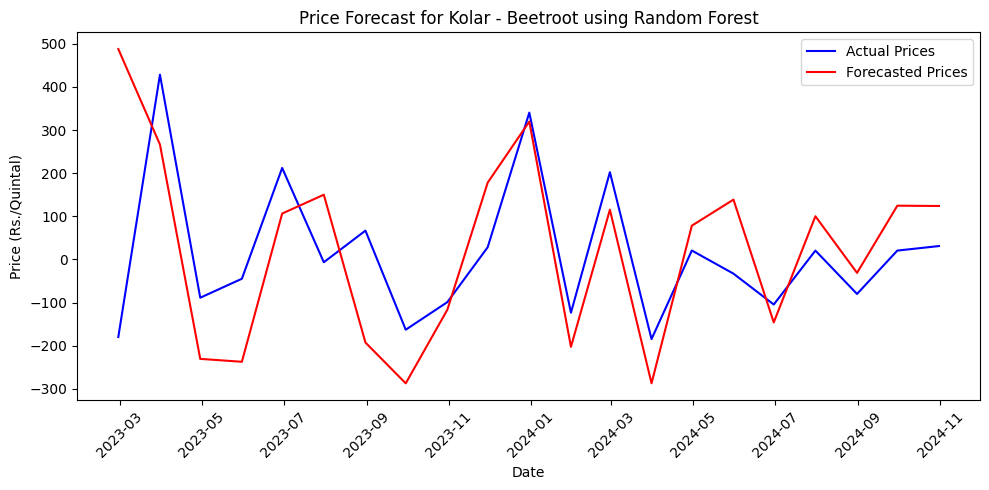

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


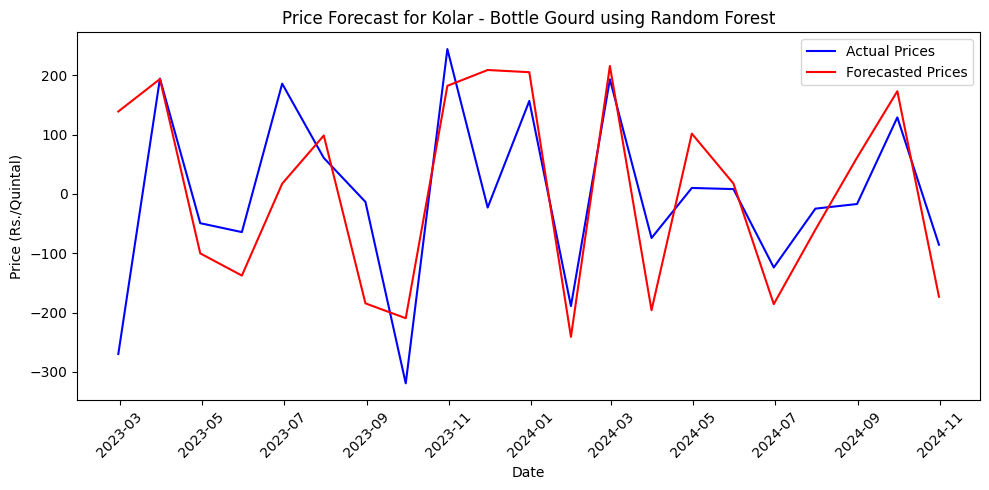

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


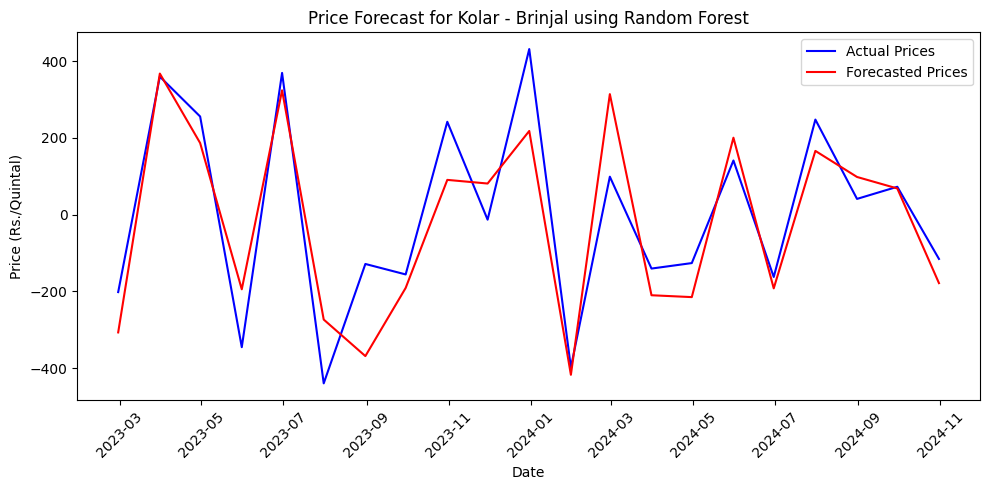

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


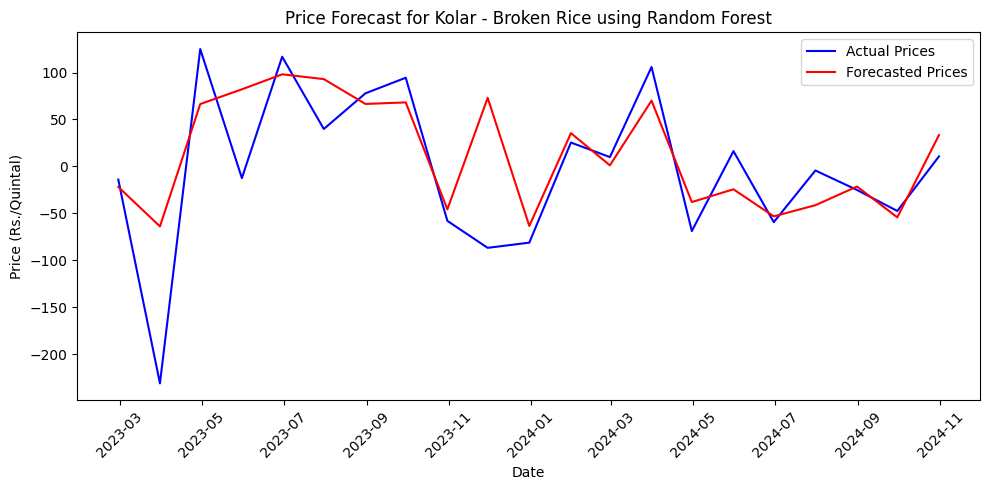

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


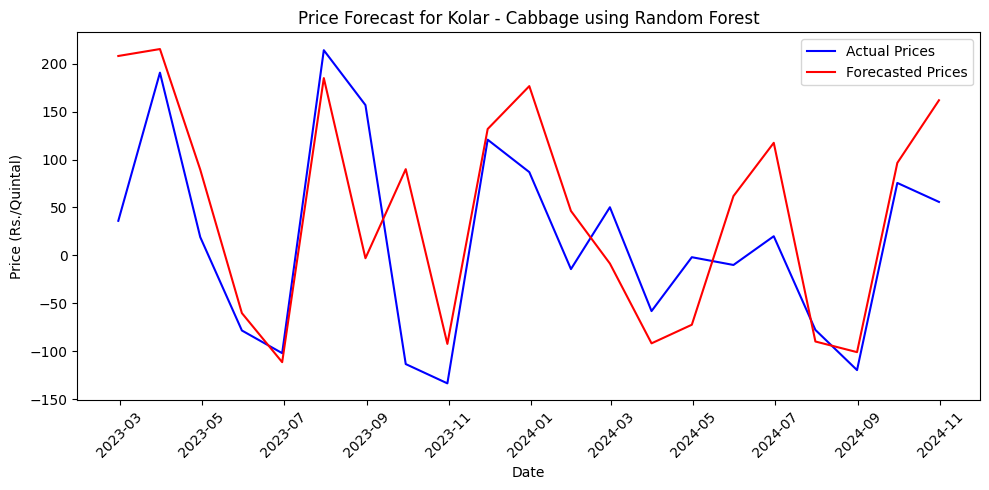

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


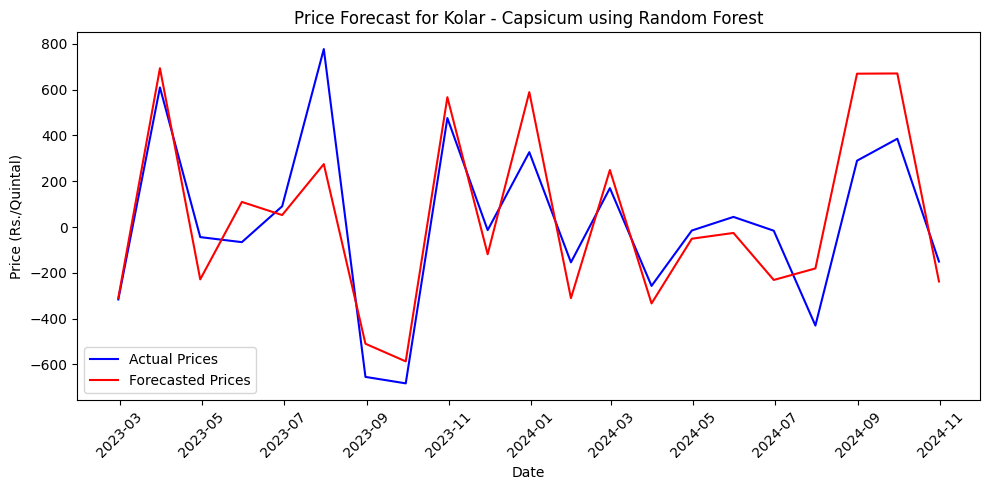

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


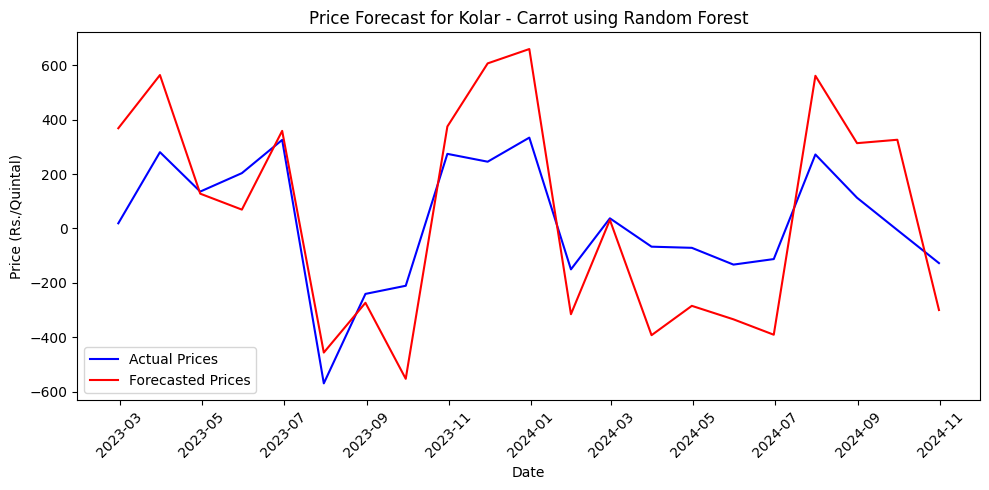

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


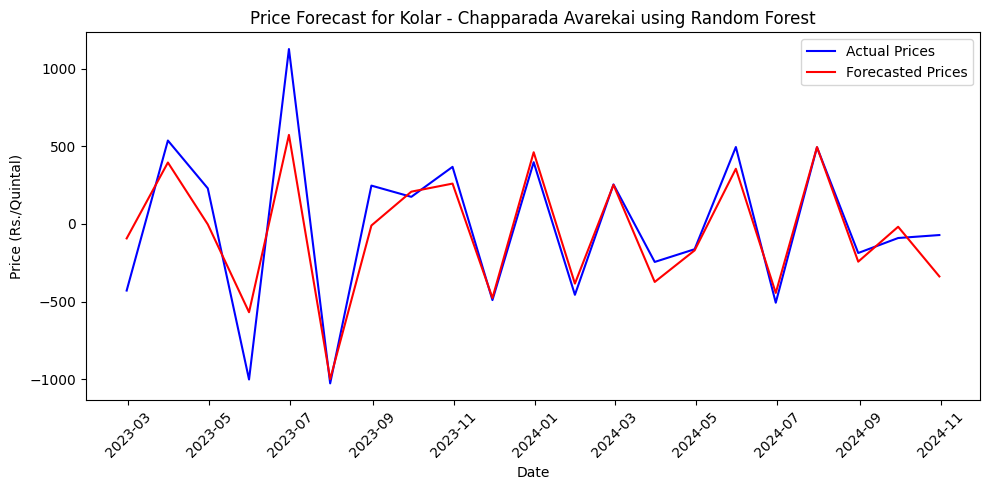

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


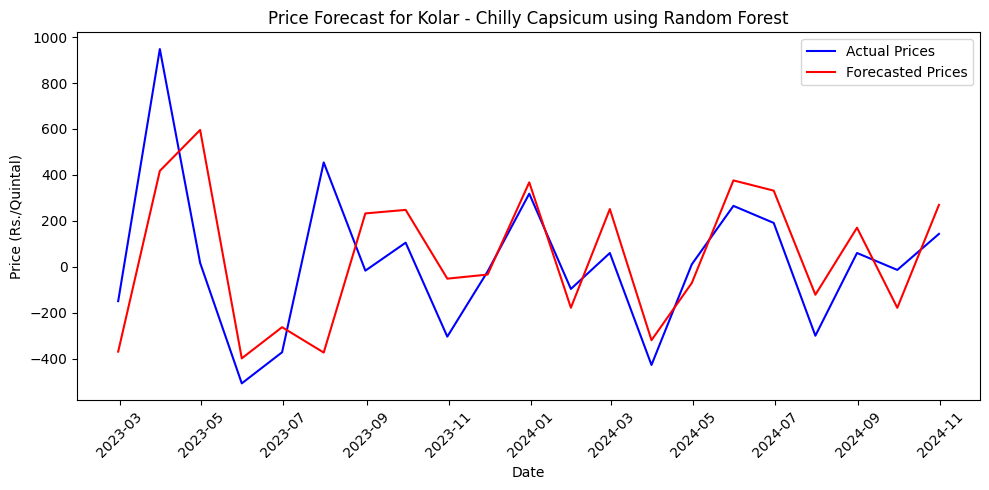

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


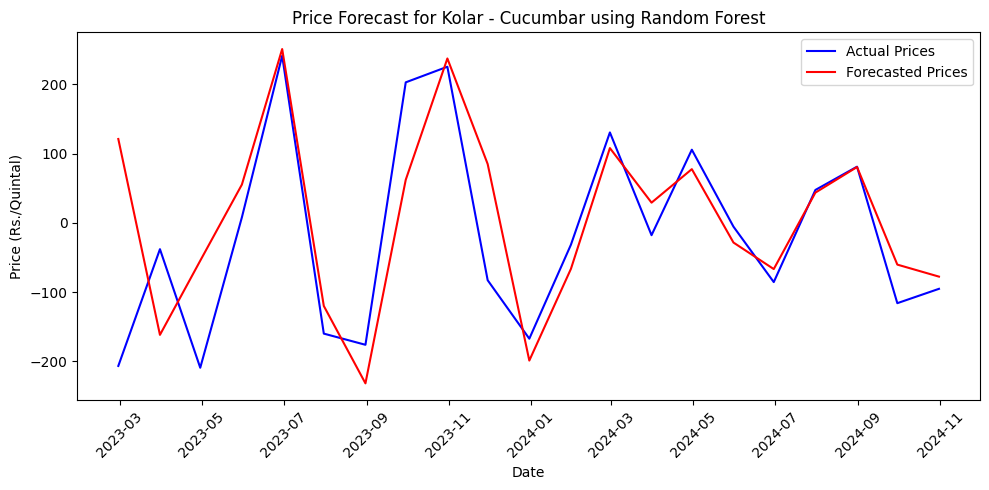

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


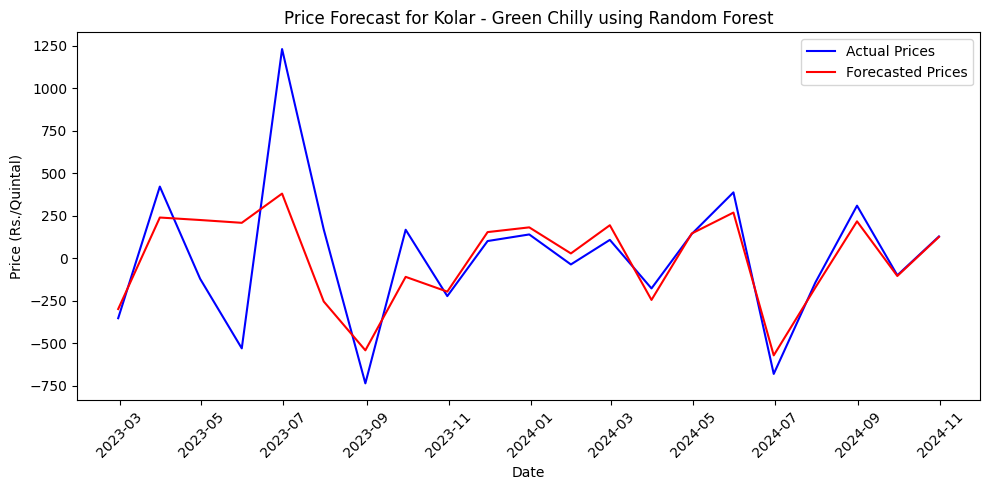

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


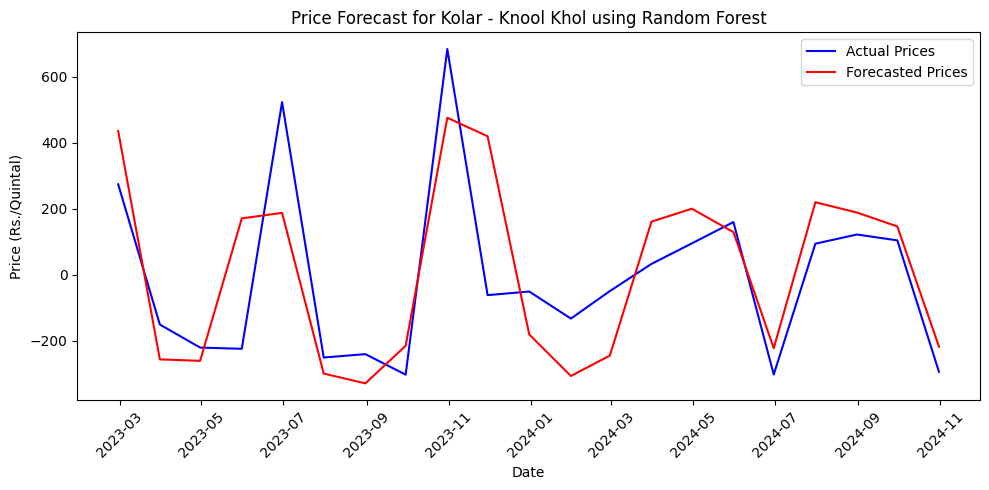

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


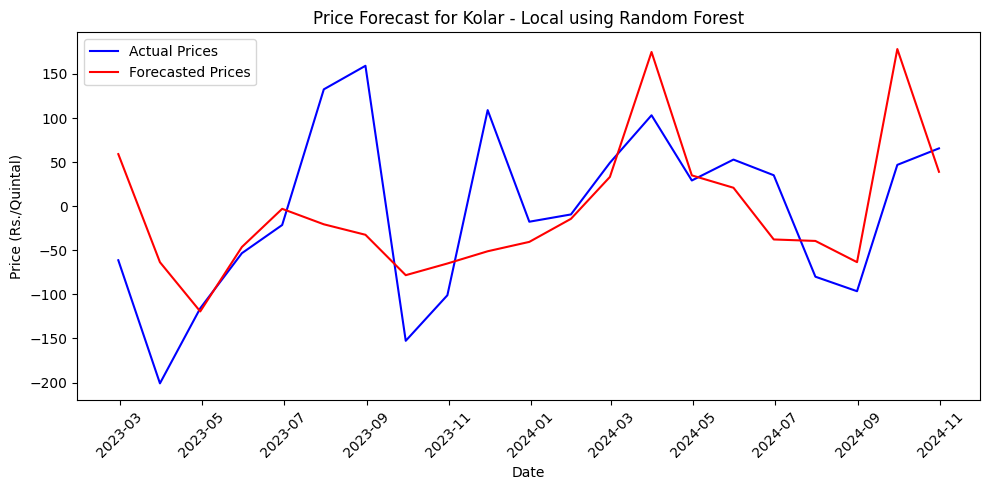

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


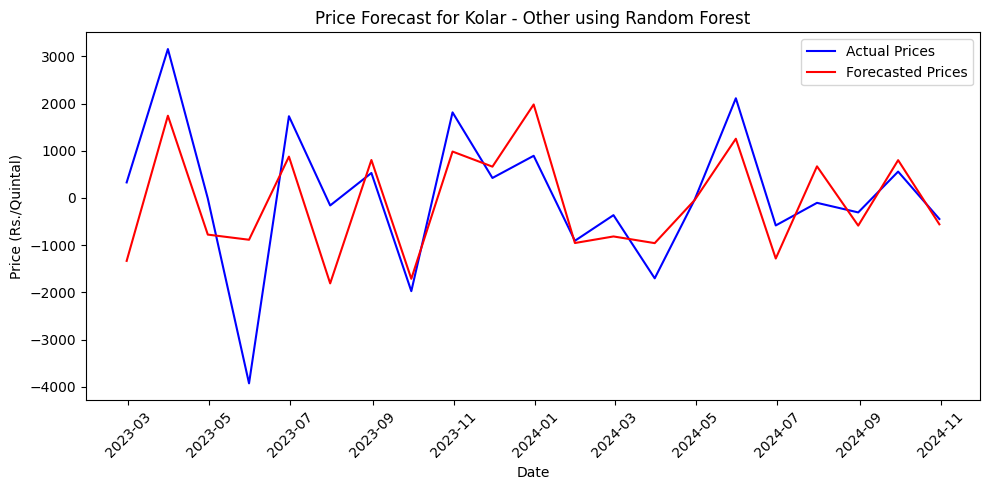

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


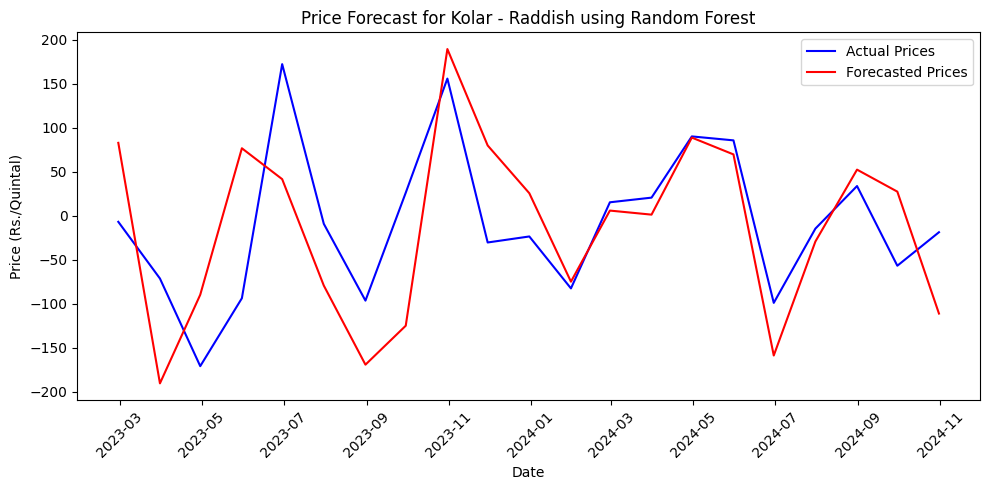

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


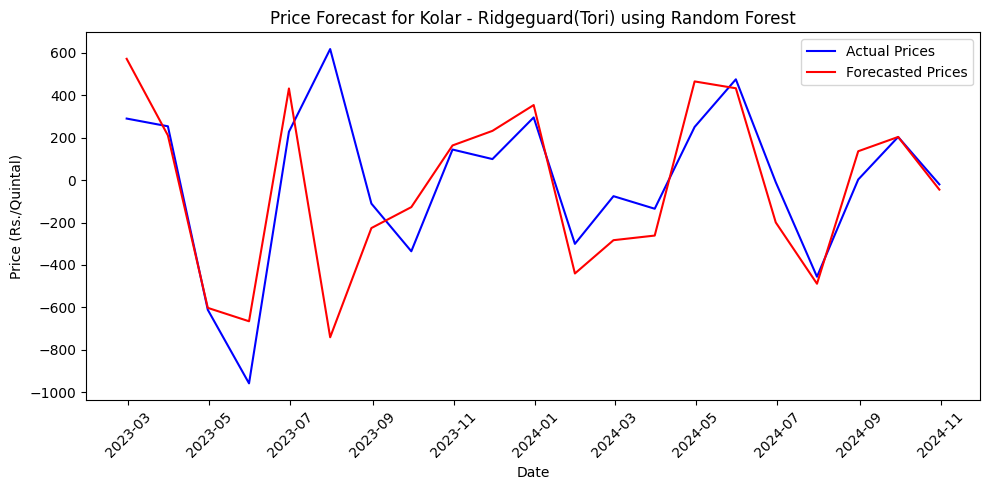

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


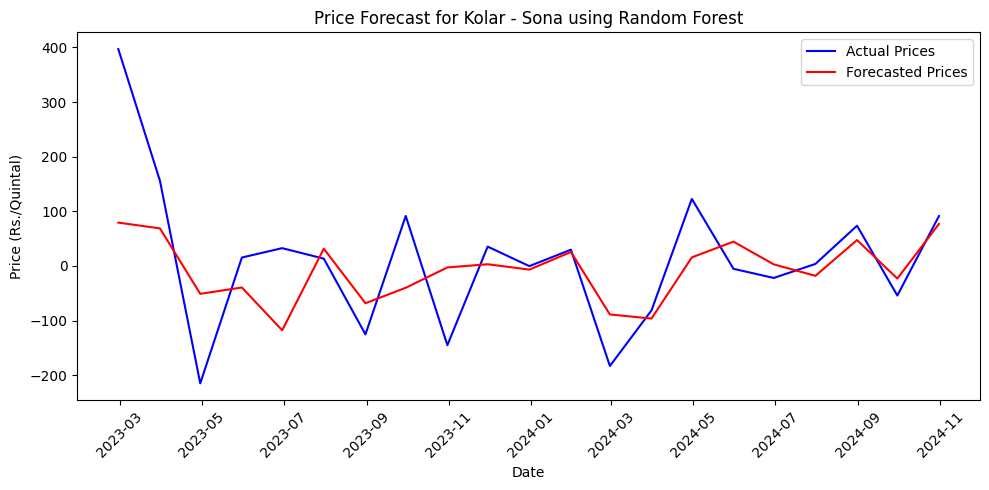

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


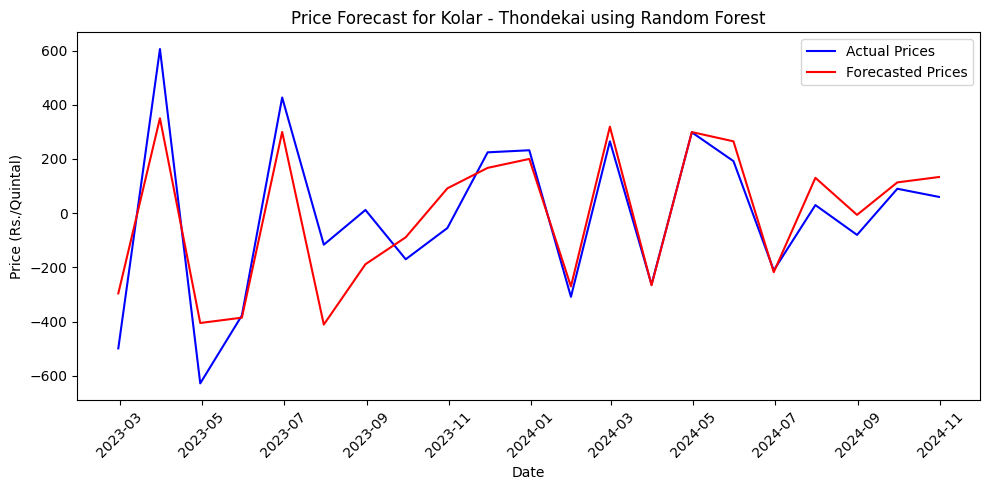

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


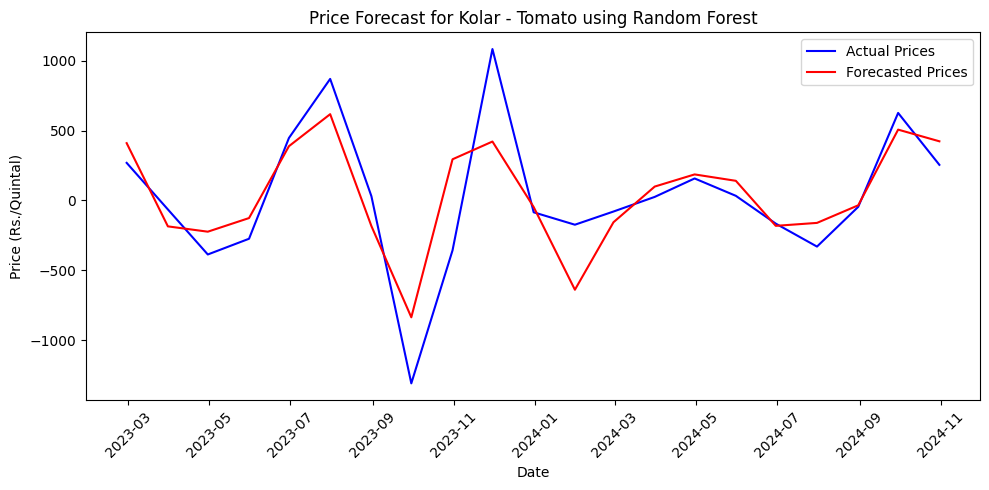

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


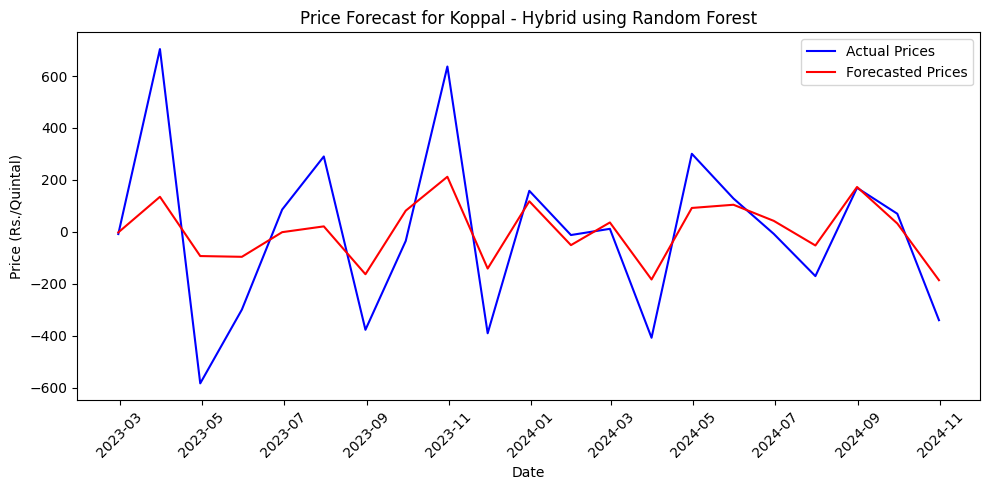

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


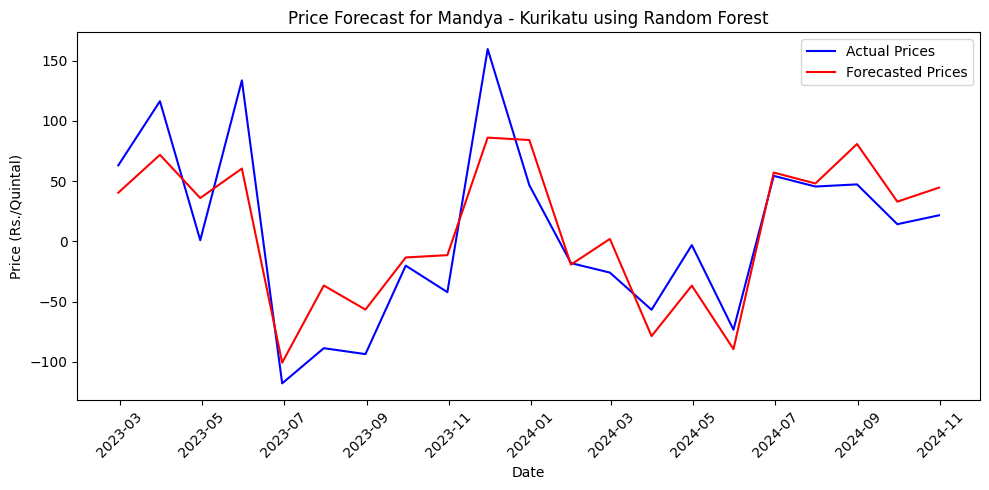

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


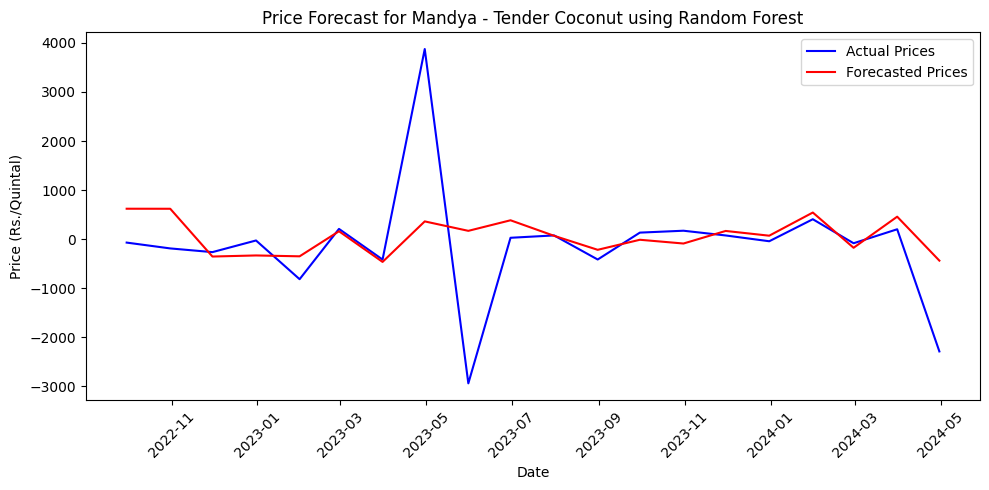

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


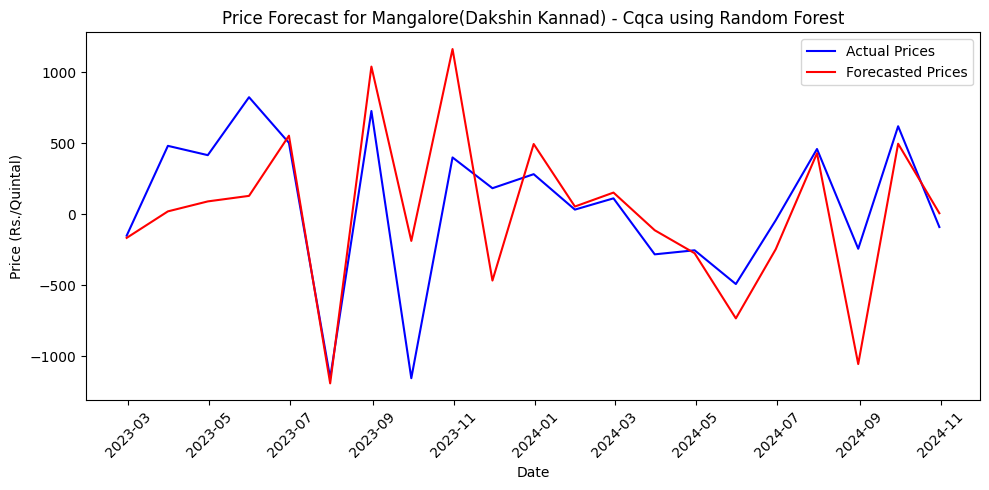

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


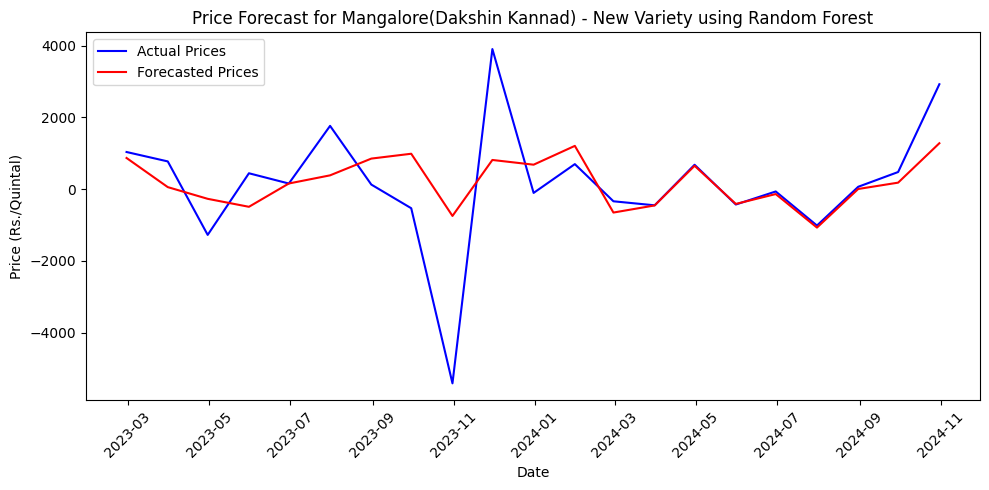

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


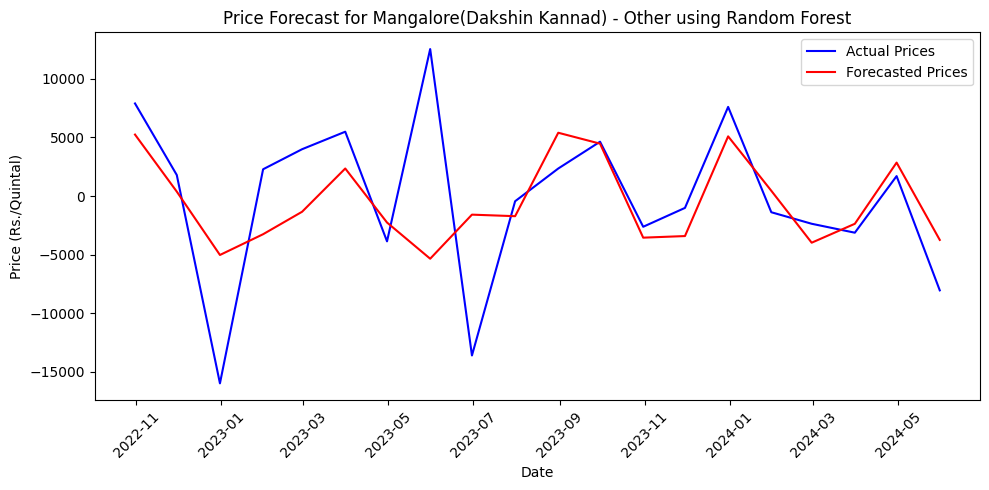

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


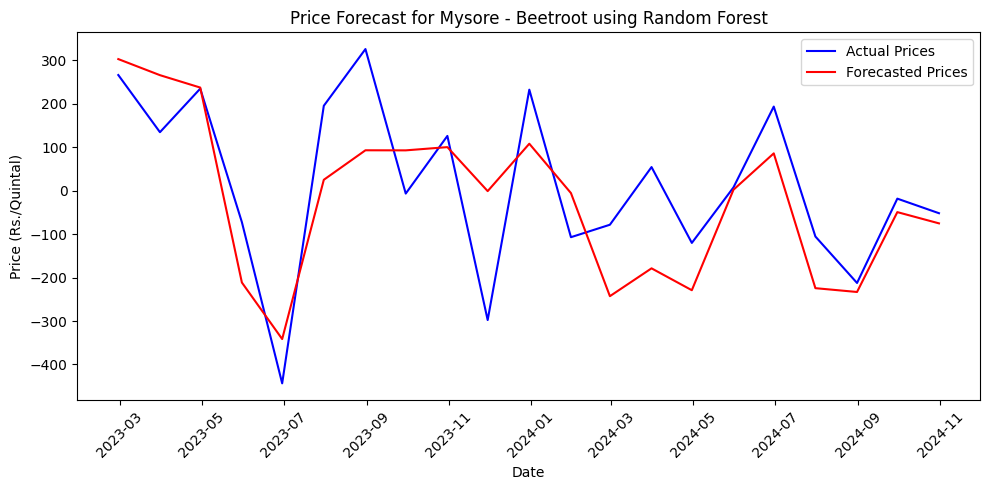

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


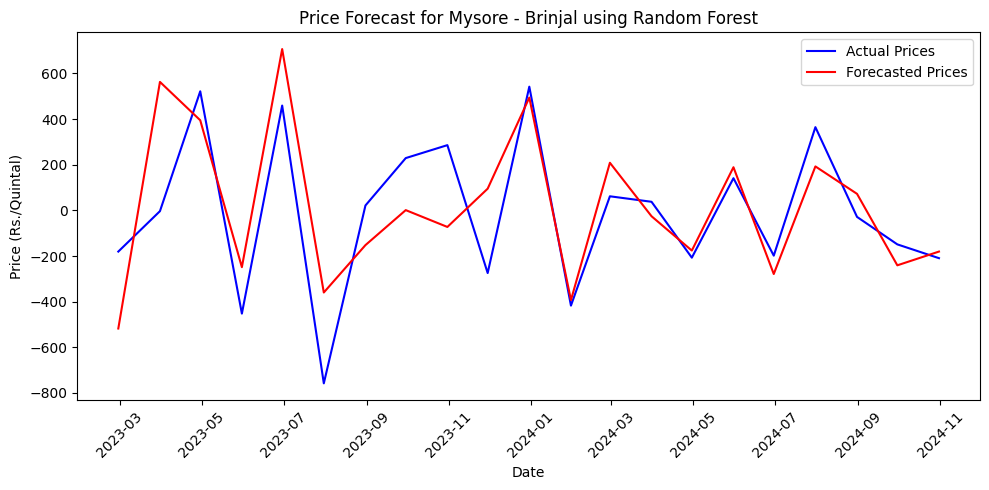

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


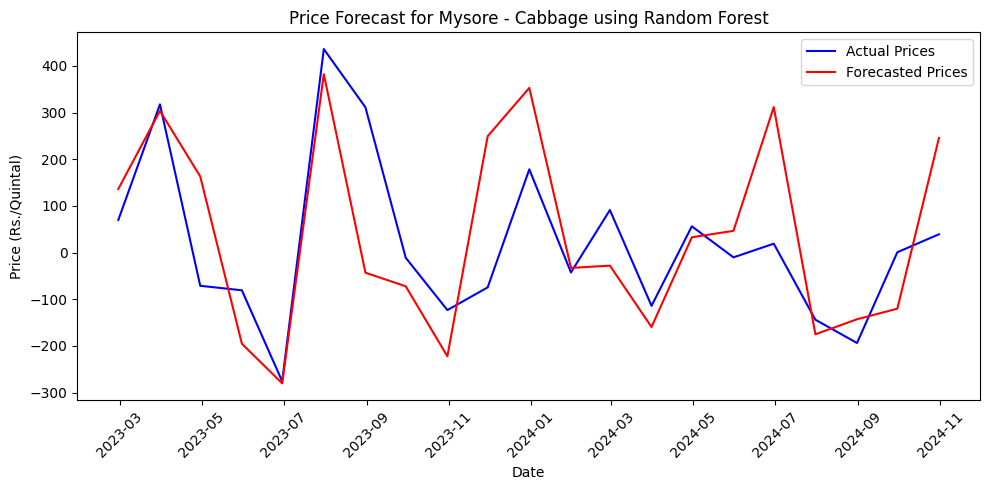

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


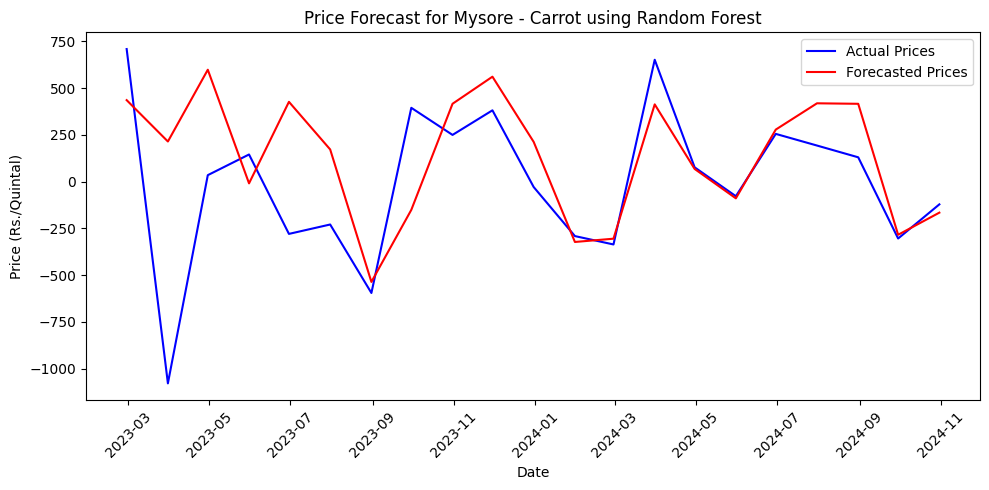

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


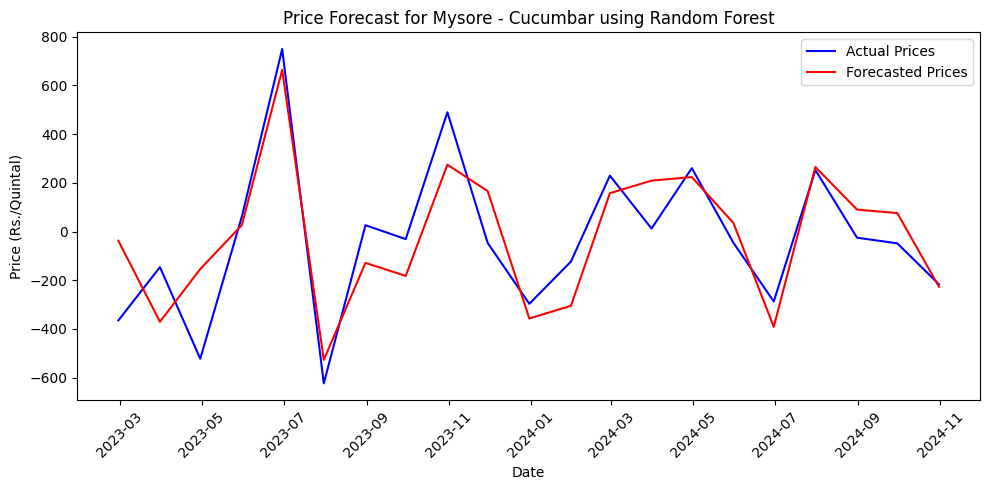

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


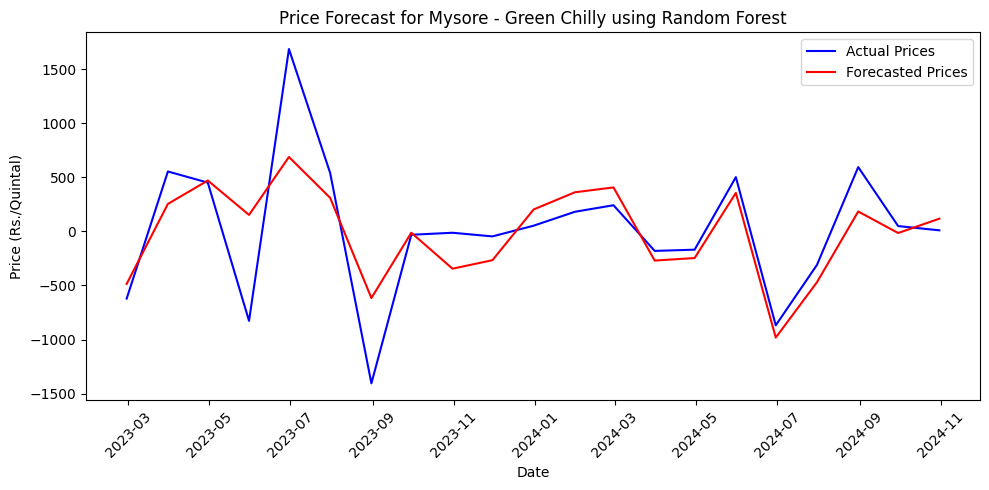

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


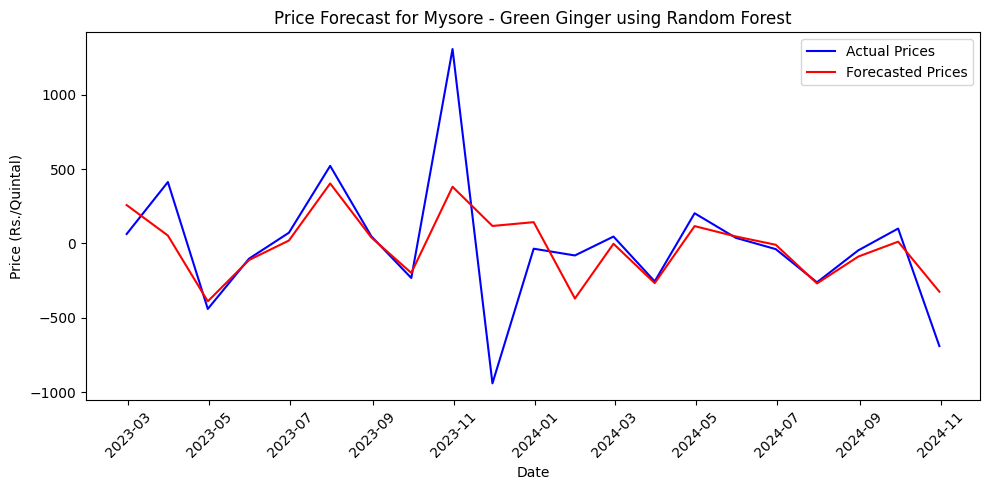

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


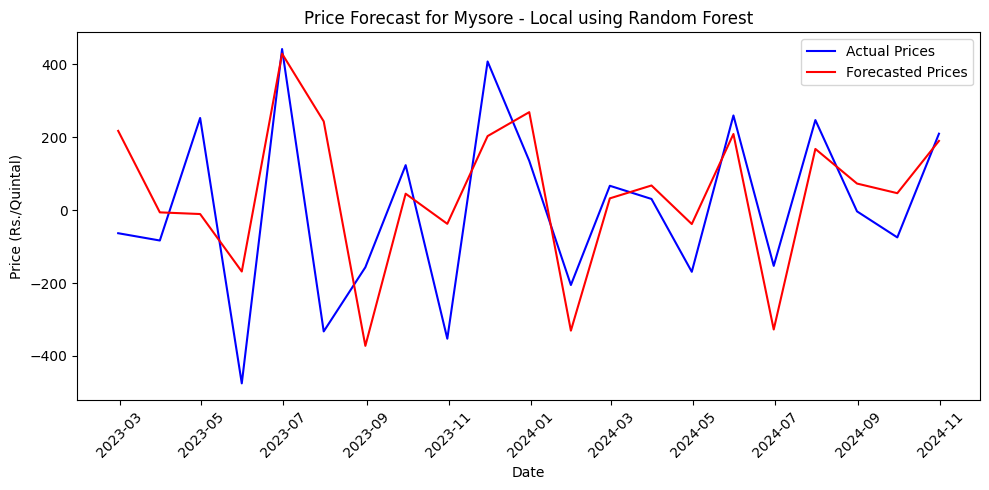

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


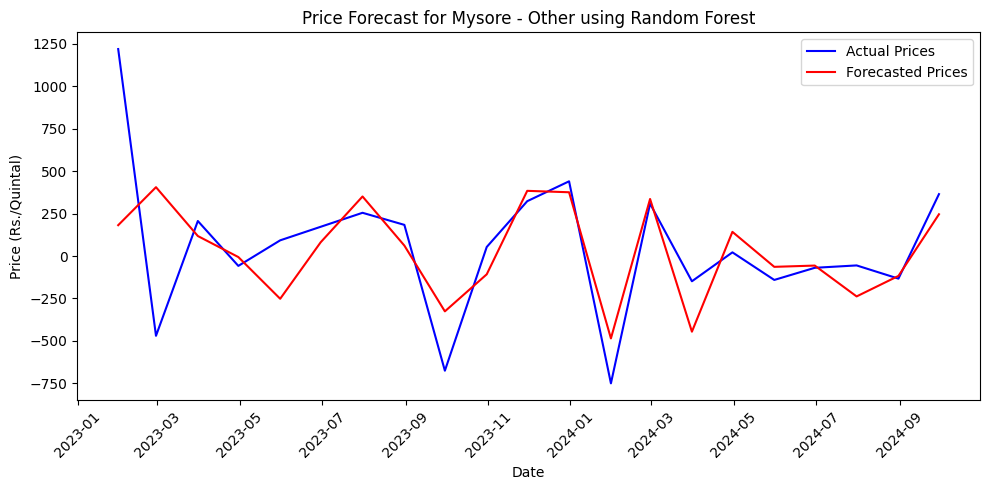

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


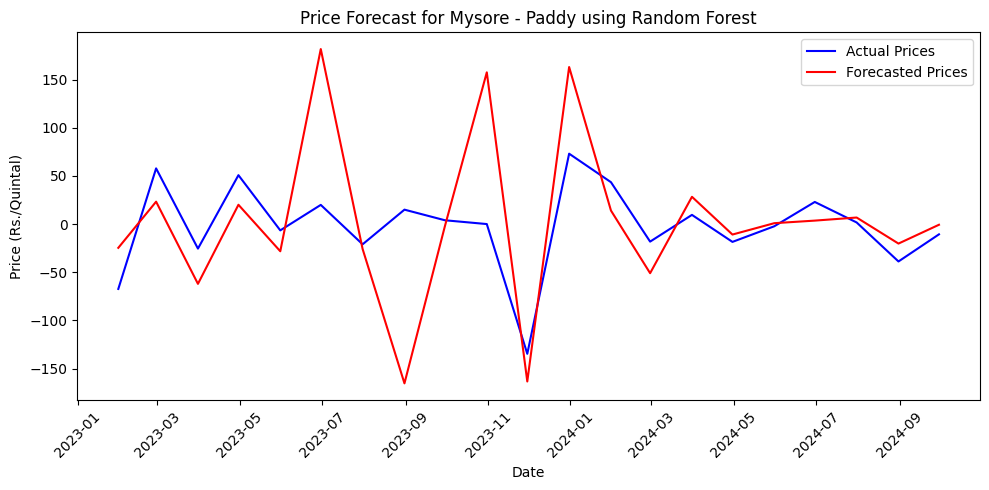

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


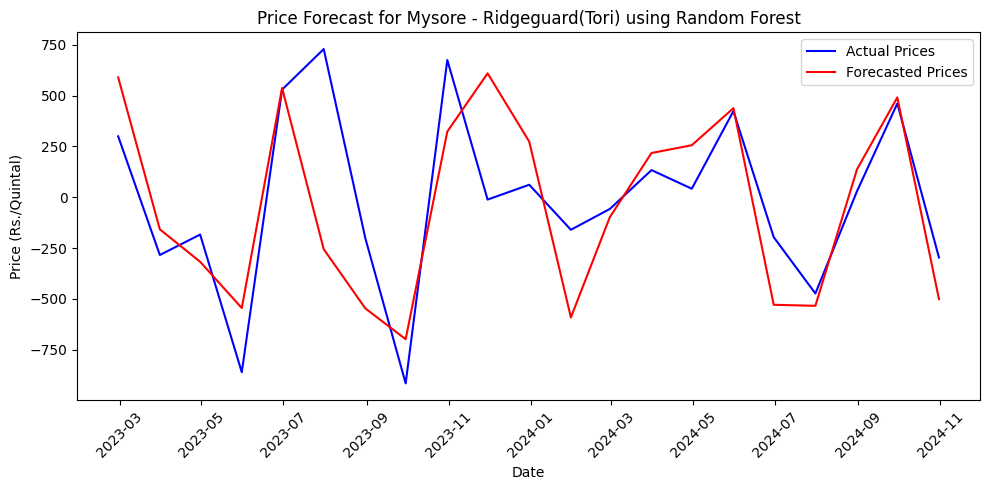

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


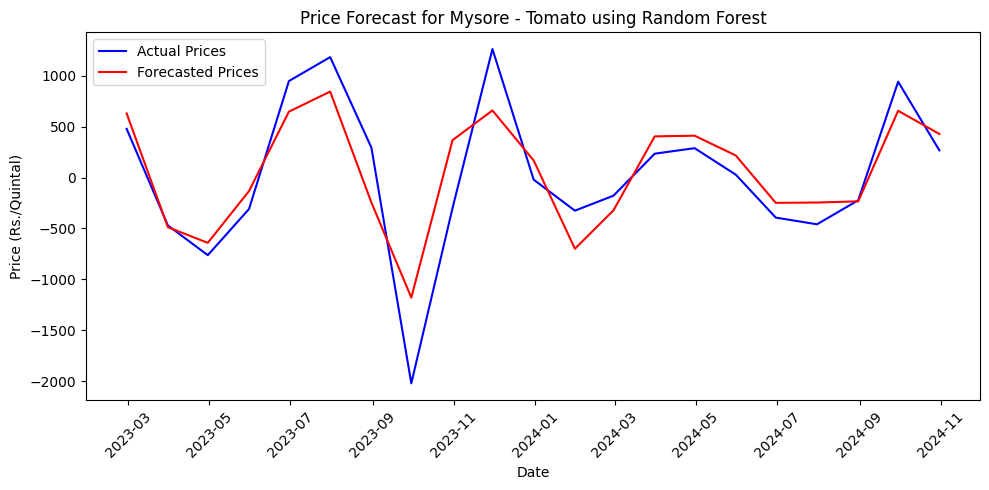

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


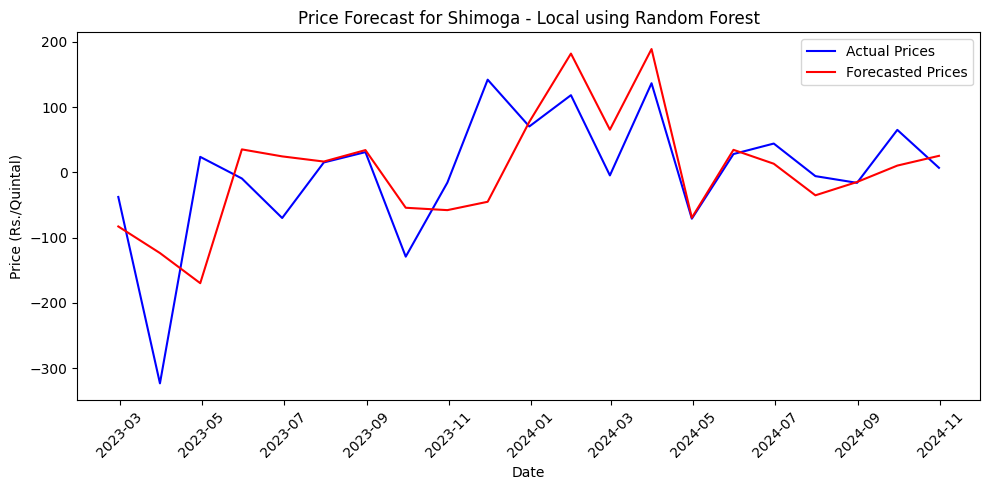

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


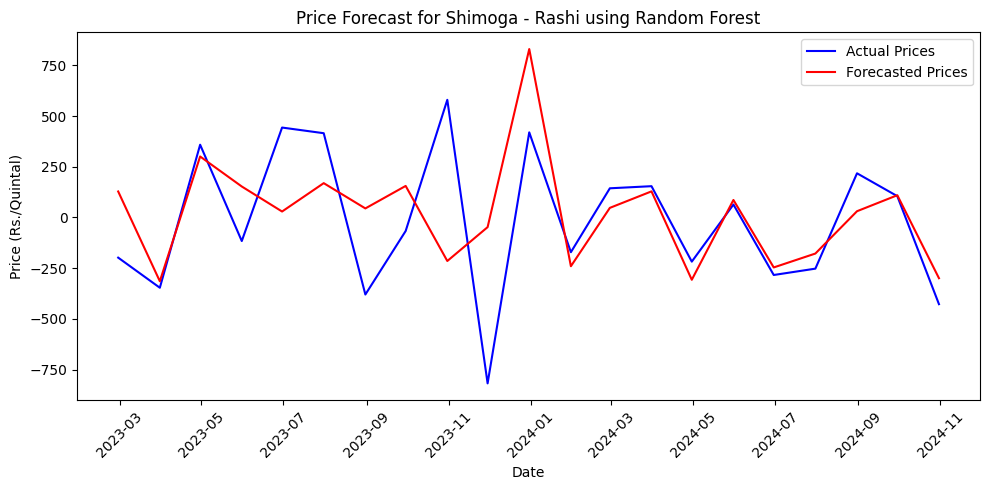

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


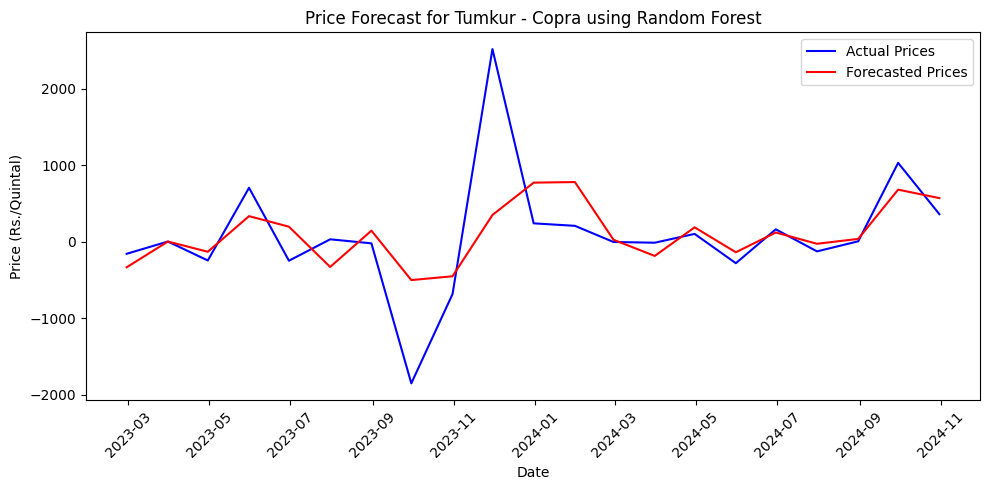

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


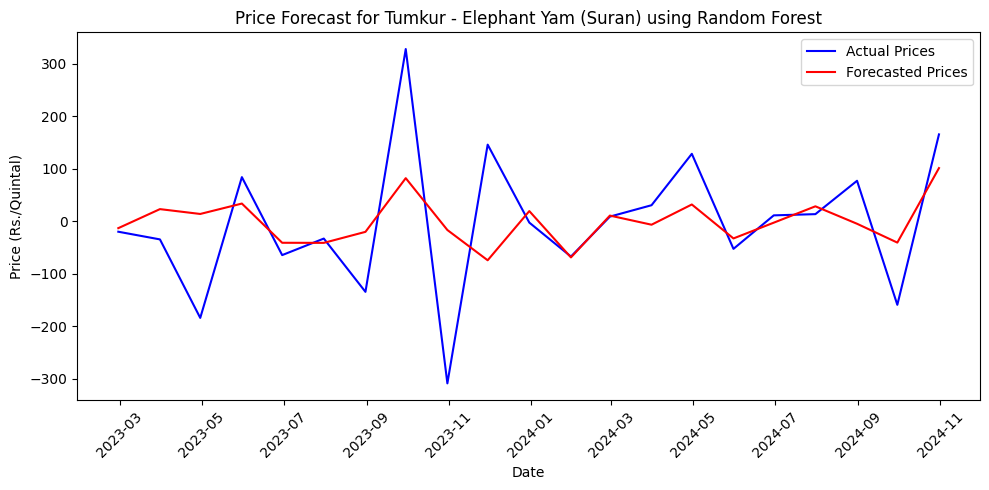

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


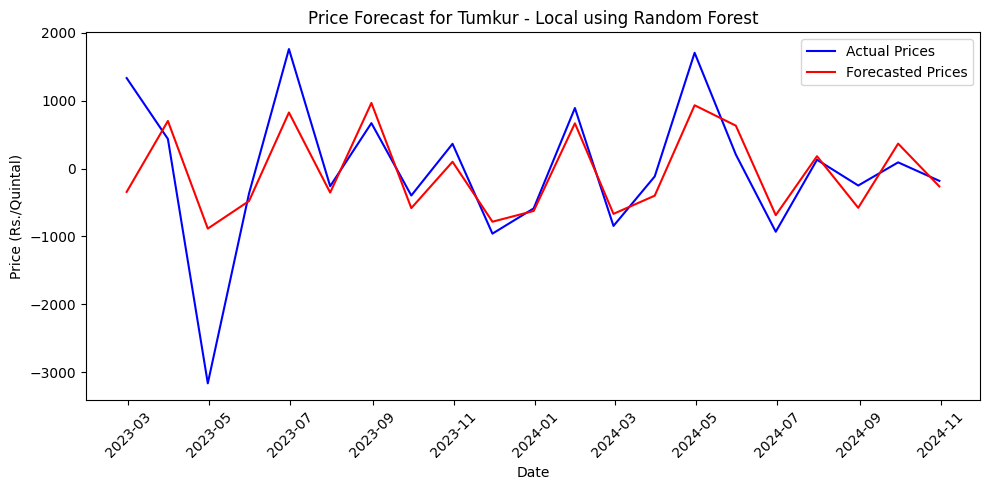

<ipython-input-6-c0d4456fd422>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


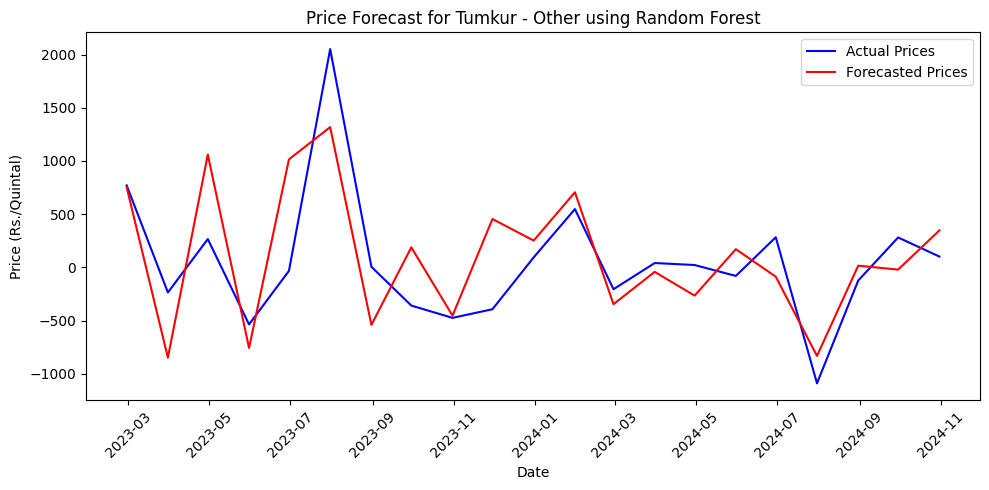

                                       MAE            MSE        RMSE  \
Bagalkot  Hybrid/Local           54.520938    5545.492245   74.468062   
Bangalore Banana - Green        115.245551   19041.613331  137.991352   
          Beans (Whole)           3.282556      15.465732    3.932649   
          Beetroot              162.913577   60719.401400  246.413071   
          Bhindi                246.683048  118268.385508  343.901709   
...                                    ...            ...         ...   
Shimoga   Rashi                 224.017897  101029.904124  317.852016   
Tumkur    Copra                 364.418724  379360.504864  615.922483   
          Elephant Yam (Suran)   80.510634   13828.056442  117.592757   
          Local                 437.473082  494544.968965  703.238913   
          Other                 370.503230  219156.369726  468.141399   

                                      R2  
Bagalkot  Hybrid/Local          0.158396  
Bangalore Banana - Green        0.366

In [6]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL
import joblib

filtered_df = pd.read_csv('/content/agriculture_data.csv')

# Assuming filtered_df is your initial dataframe
# Convert 'Price Date' to datetime
filtered_df['Price Date'] = pd.to_datetime(filtered_df['Price Date'])

# Aggregate the mean price for each variety under each district on the same date
aggregated_df = filtered_df.groupby(['District Name', 'Variety', 'Price Date']).agg({'Capped Price': 'mean'}).reset_index()

# Set 'Price Date' as the index
aggregated_df.set_index('Price Date', inplace=True)

# Group the data by District Name and Variety (commodity)
grouped = aggregated_df.groupby(['District Name', 'Variety'])

# Initialize dictionaries to store models, forecast results, and performance metrics
model_dict = {}
forecast_results = {}
performance_metrics = {}

# Iterate over each group (district and variety)
for (district, variety), group in grouped:
    # Resample the data to monthly frequency and fill missing values
    group = group['Capped Price'].resample('M').mean().ffill()

    if len(group) < 12:
        print(f"Not enough data for {district} - {variety}. Skipping.")
        continue

    # Decompose the time series using STL
    seasonal_period = 5  # Adjust based on your data frequency
    stl = STL(group, seasonal=seasonal_period)
    decomposition = stl.fit()

    # Get the trend, seasonal, and residual components
    trend = decomposition.trend
    seasonal = decomposition.seasonal

    # Remove trend and seasonality from the original series
    detrended_data = group - trend - seasonal

    # Apply differencing to make the series stationary
    differenced_data = detrended_data.diff().dropna()

    # Apply Min-Max scaling
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(differenced_data.values.reshape(-1, 1))
    scaled_series = pd.Series(scaled_data.flatten(), index=differenced_data.index)

    # Create lag features and rolling statistics
    df = pd.DataFrame({'Value': scaled_series})
    for lag in range(1, 13):  # Create lag features for the past 12 months
        df[f'lag_{lag}'] = df['Value'].shift(lag)

    # Add rolling features
    df['rolling_mean'] = df['Value'].rolling(window=3).mean()
    df['rolling_std'] = df['Value'].rolling(window=3).std()

    # Drop rows with NaN values created by lags and rolling calculations
    df.dropna(inplace=True)

    # Split the data into features (X) and target (y)
    X = df.drop(columns=['Value'])
    y = df['Value']

    # Split into training and testing sets
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Train a Random Forest model
    model = RandomForestRegressor(n_estimators=150, max_depth=20, random_state=42)
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Inverse transform the predictions and target to their original scale
    y_pred_inverse = scaler.inverse_transform(y_pred.reshape(-1, 1)).flatten()
    y_test_inverse = scaler.inverse_transform(y_test.values.reshape(-1, 1)).flatten()

    # Store the forecast results along with their dates
    forecast_results[(district, variety)] = {
        'Date': y_test.index,
        'Forecast': y_pred_inverse
    }

    # Calculate performance metrics
    mae = mean_absolute_error(y_test_inverse, y_pred_inverse)
    mse = mean_squared_error(y_test_inverse, y_pred_inverse)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_inverse, y_pred_inverse)

    # Store metrics for the district and variety
    performance_metrics[(district, variety)] = {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2
    }

    # Optional: Plot the results
    plt.figure(figsize=(10, 5))
    plt.plot(y_test.index, y_test_inverse, label='Actual Prices', color='blue')
    plt.plot(y_test.index, y_pred_inverse, label='Forecasted Prices', color='red')
    plt.title(f'Price Forecast for {district} - {variety} using Random Forest')
    plt.xlabel('Date')
    plt.ylabel('Price (Rs./Quintal)')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Convert forecast results to DataFrame for further analysis or export
forecast_dfs = []
for (district, variety), data in forecast_results.items():
    temp_df = pd.DataFrame({
        'District Name': district,
        'Variety': variety,
        'Date': data['Date'],
        'Forecast': data['Forecast']
    })
    forecast_dfs.append(temp_df)

# Combine all the forecast data into one DataFrame
forecast_df = pd.concat(forecast_dfs)
forecast_df.set_index(['District Name', 'Variety', 'Date'], inplace=True)

# Convert performance metrics to DataFrame for easier viewing
performance_df = pd.DataFrame(performance_metrics).T



In [7]:
print(performance_df)

                                       MAE            MSE        RMSE  \
Bagalkot  Hybrid/Local           54.520938    5545.492245   74.468062   
Bangalore Banana - Green        115.245551   19041.613331  137.991352   
          Beans (Whole)           3.282556      15.465732    3.932649   
          Beetroot              162.913577   60719.401400  246.413071   
          Bhindi                246.683048  118268.385508  343.901709   
...                                    ...            ...         ...   
Shimoga   Rashi                 224.017897  101029.904124  317.852016   
Tumkur    Copra                 364.418724  379360.504864  615.922483   
          Elephant Yam (Suran)   80.510634   13828.056442  117.592757   
          Local                 437.473082  494544.968965  703.238913   
          Other                 370.503230  219156.369726  468.141399   

                                      R2  
Bagalkot  Hybrid/Local          0.158396  
Bangalore Banana - Green        0.366

In [8]:
performance_df

MAE            MSE        RMSE  \
Bagalkot  Hybrid/Local           54.520938    5545.492245   74.468062   
Bangalore Banana - Green        115.245551   19041.613331  137.991352   
          Beans (Whole)           3.282556      15.465732    3.932649   
          Beetroot              162.913577   60719.401400  246.413071   
          Bhindi                246.683048  118268.385508  343.901709   
...                                    ...            ...         ...   
Shimoga   Rashi                 224.017897  101029.904124  317.852016   
Tumkur    Copra                 364.418724  379360.504864  615.922483   
          Elephant Yam (Suran)   80.510634   13828.056442  117.592757   
          Local                 437.473082  494544.968965  703.238913   
          Other                 370.503230  219156.369726  468.141399   

                                      R2  
Bagalkot  Hybrid/Local          0.158396  
Bangalore Banana - Green        0.366794  
          Beans (Whole)         0.645270  
          Beetroot             -0.375739  
          Bhindi                0.517266  
...                                  ...  
Shimoga   Rashi                 0.153712  
Tumkur    Copra                 0.345032  
          Elephant Yam (Suran)  0.223991  
          Local                 0.542753  
          Other                 0.379359  

[113 rows x 4 columns]

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


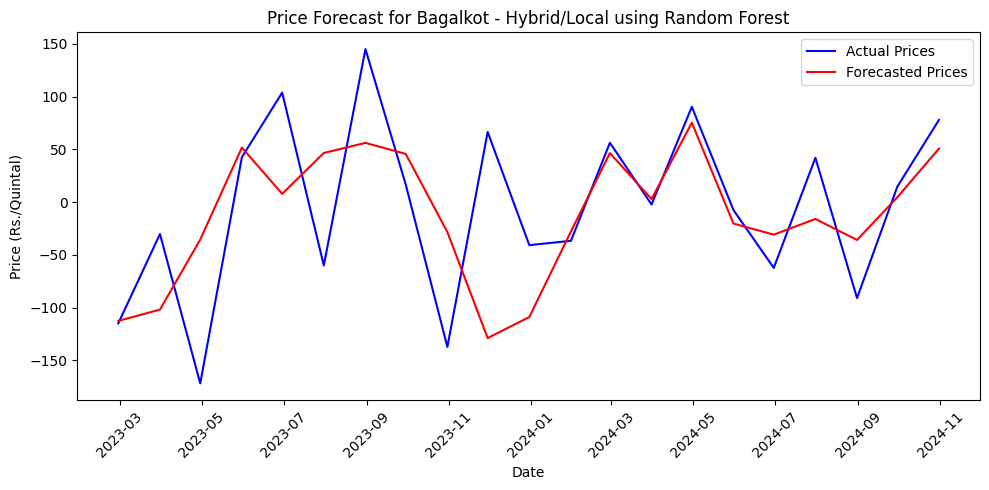

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


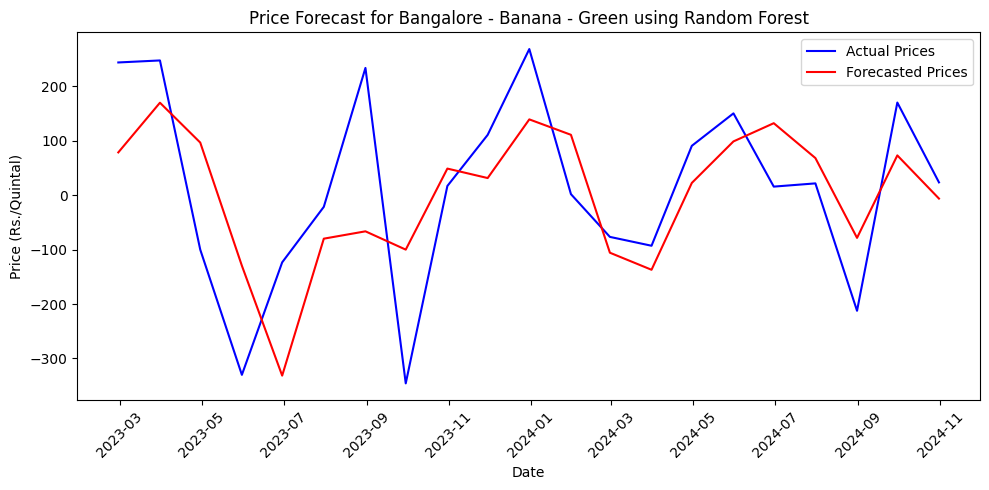

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


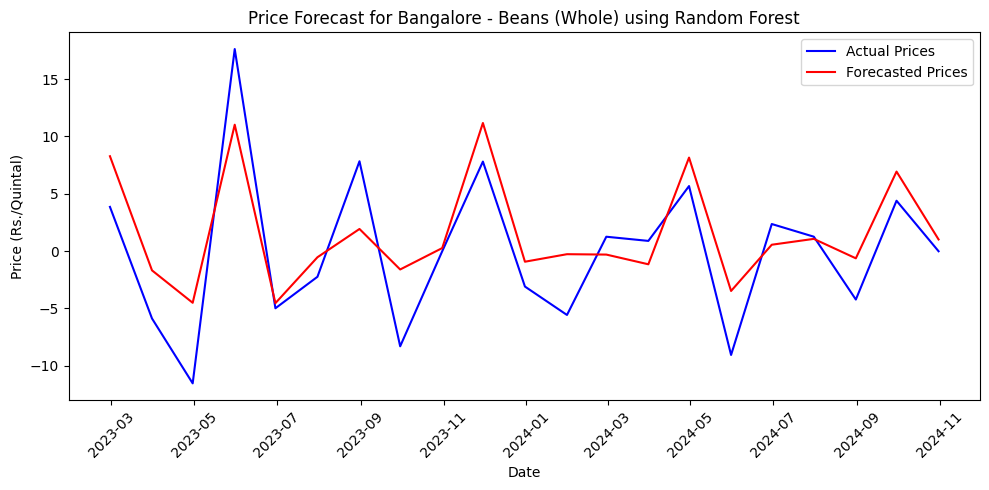

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


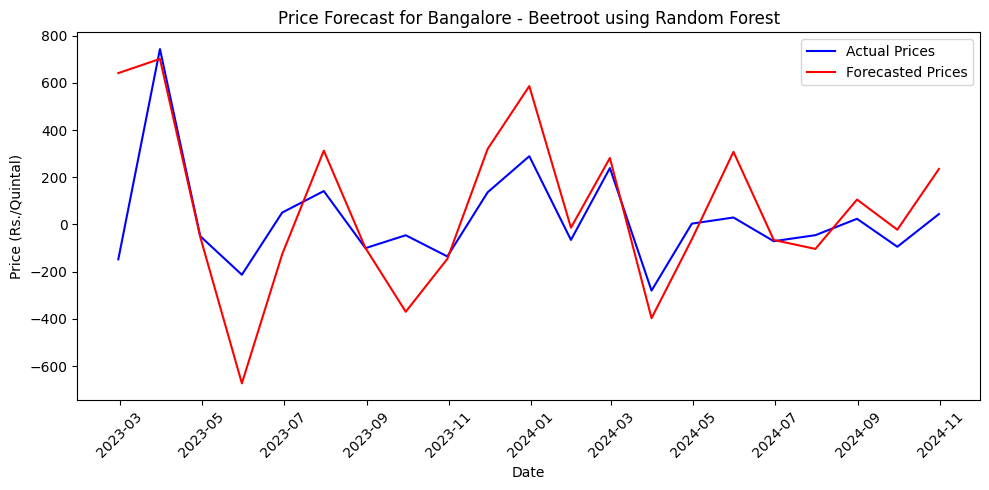

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


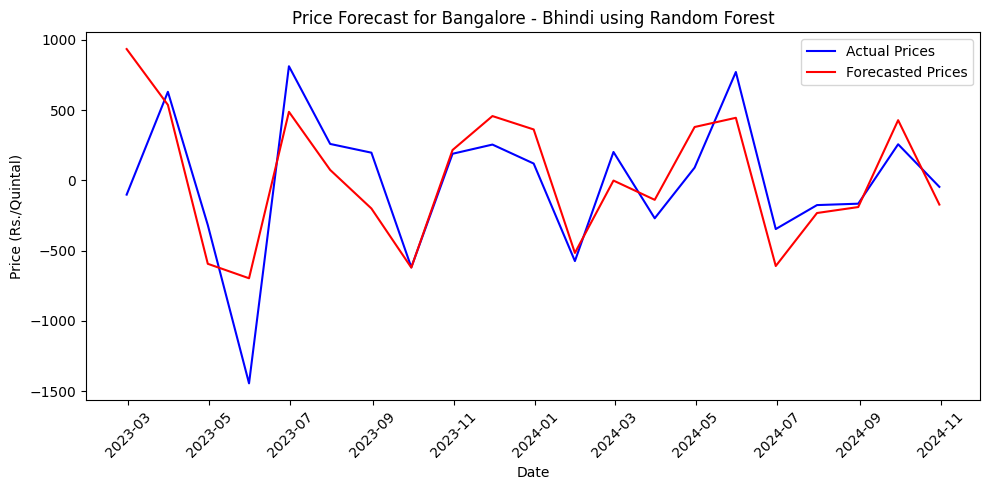

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


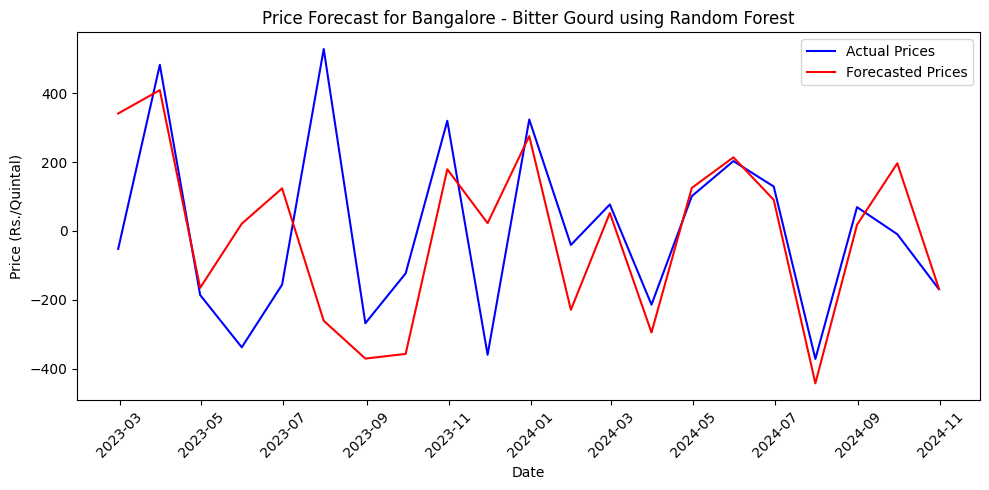

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


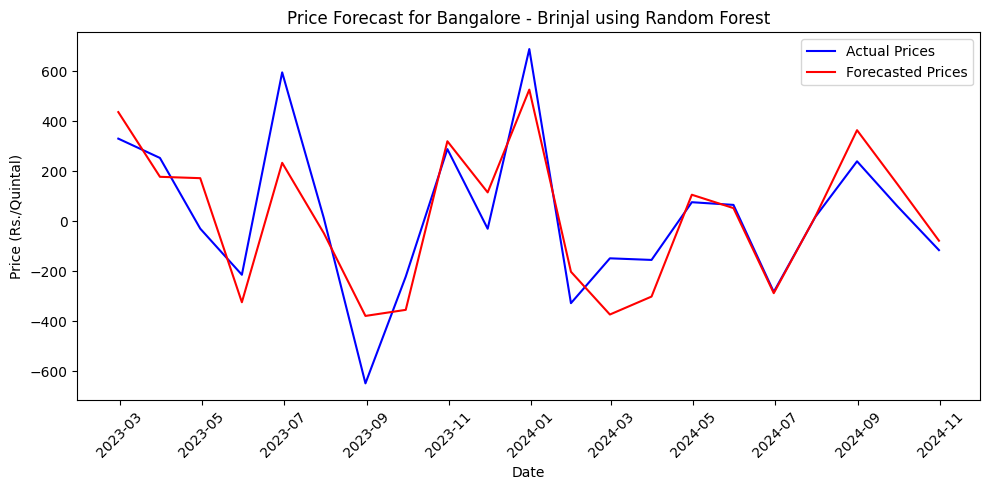

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


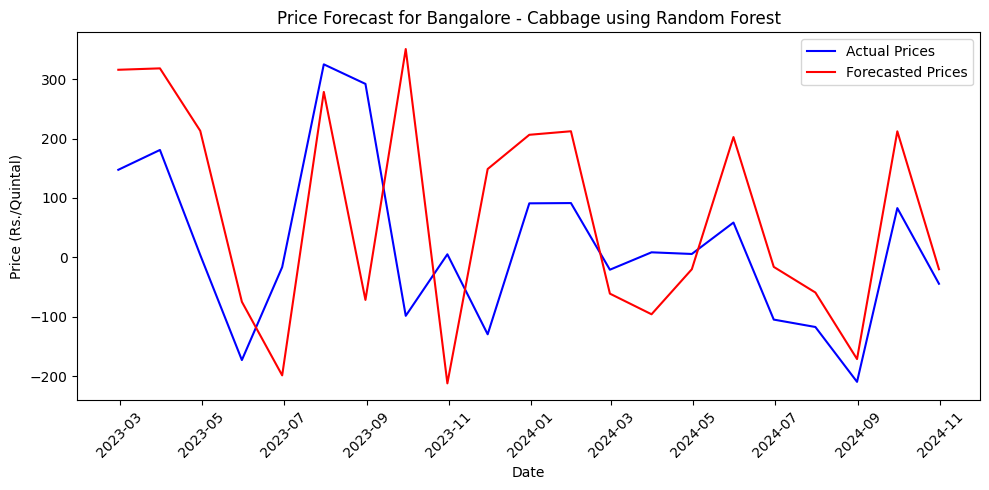

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


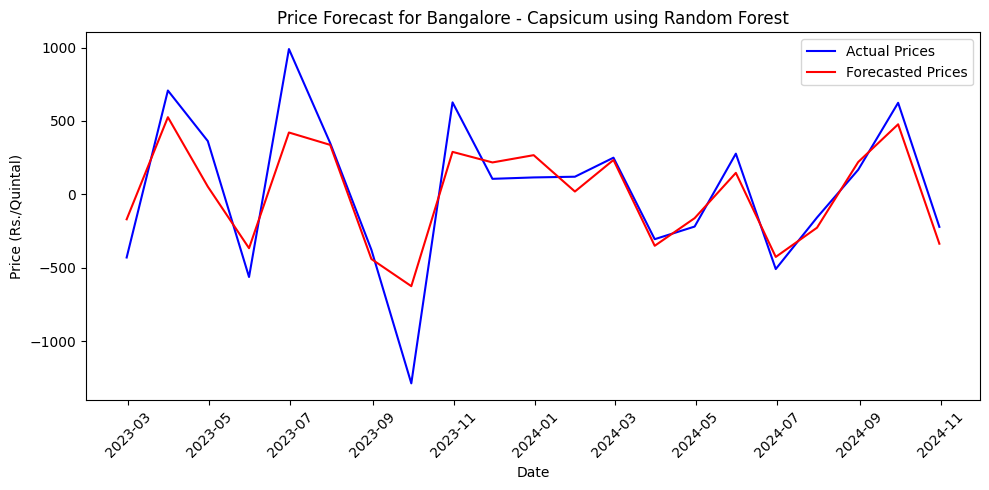

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


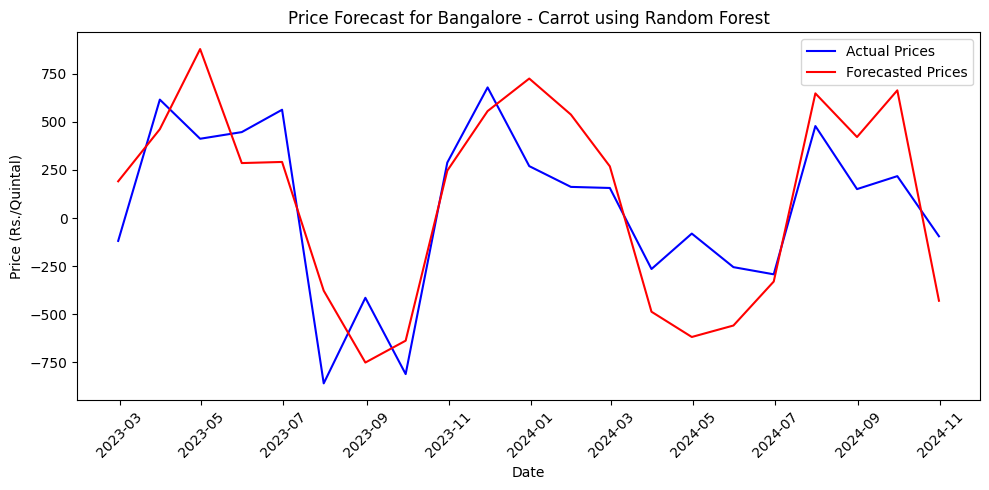

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


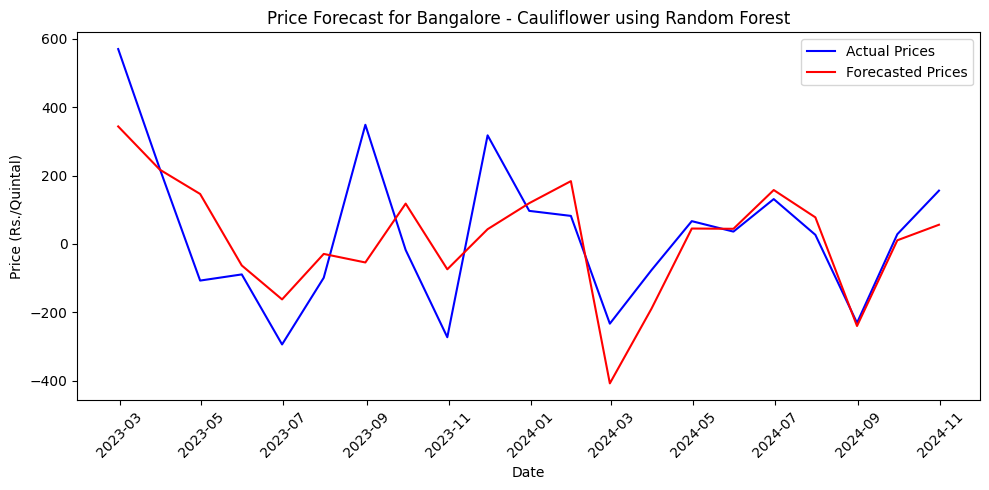

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


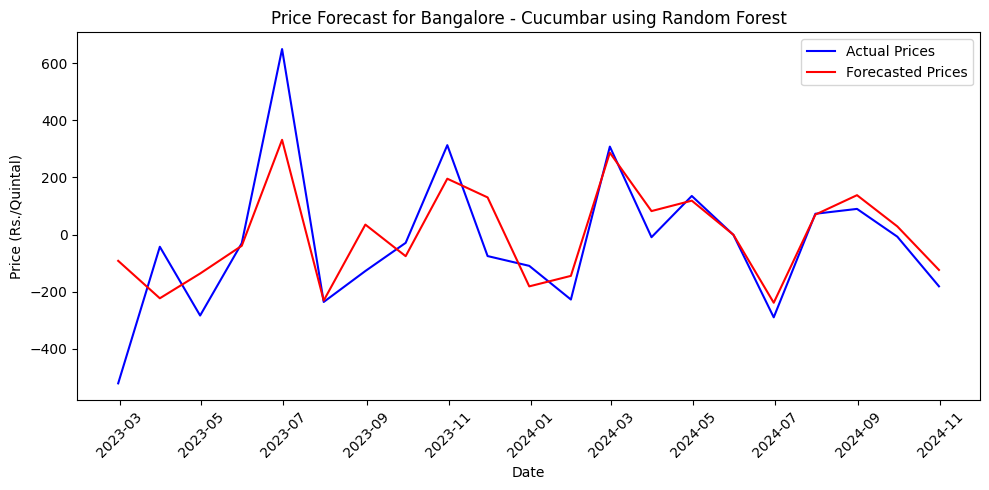

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


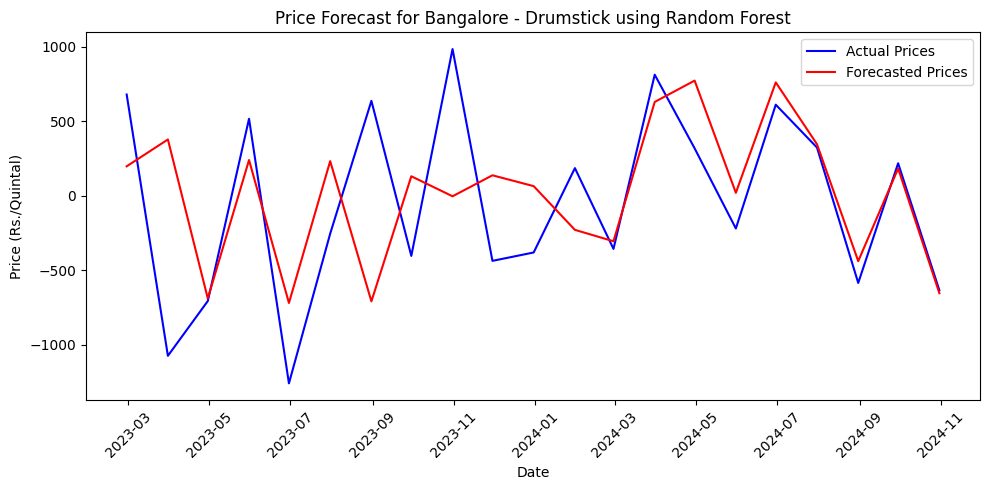

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


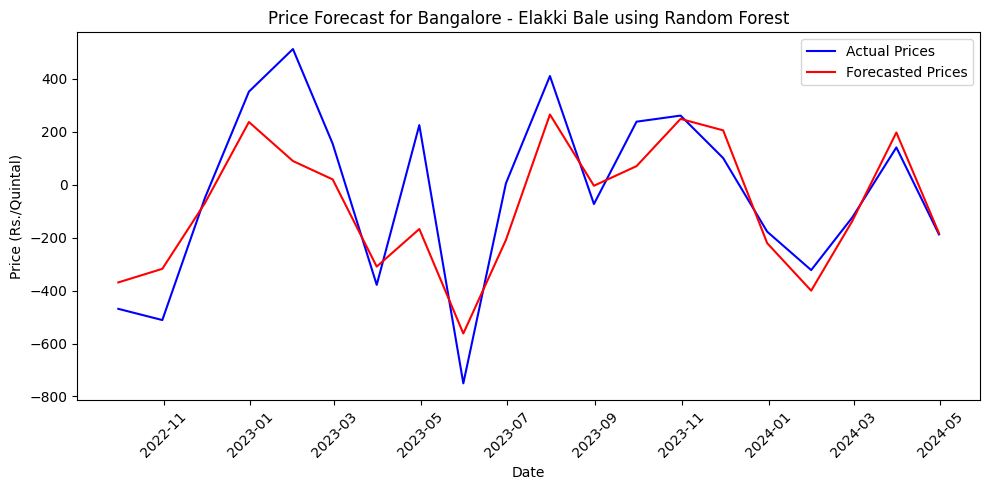

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


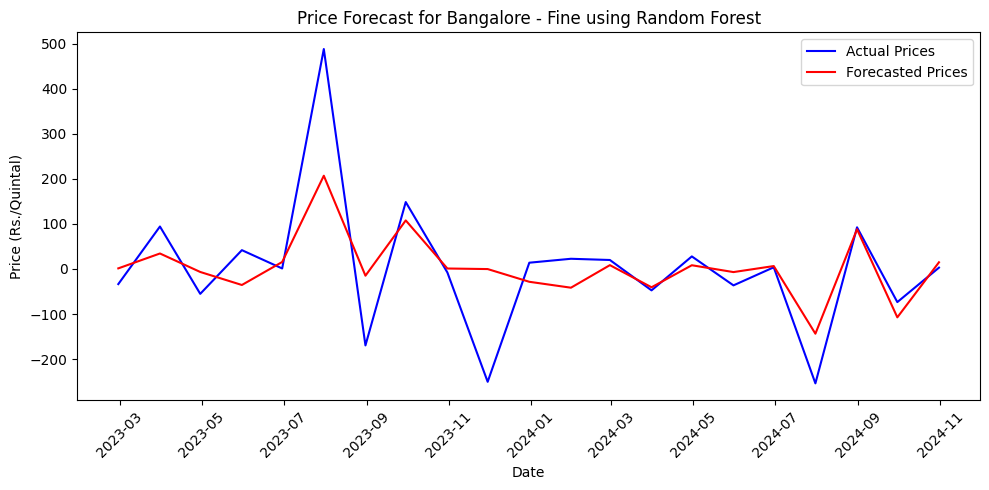

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


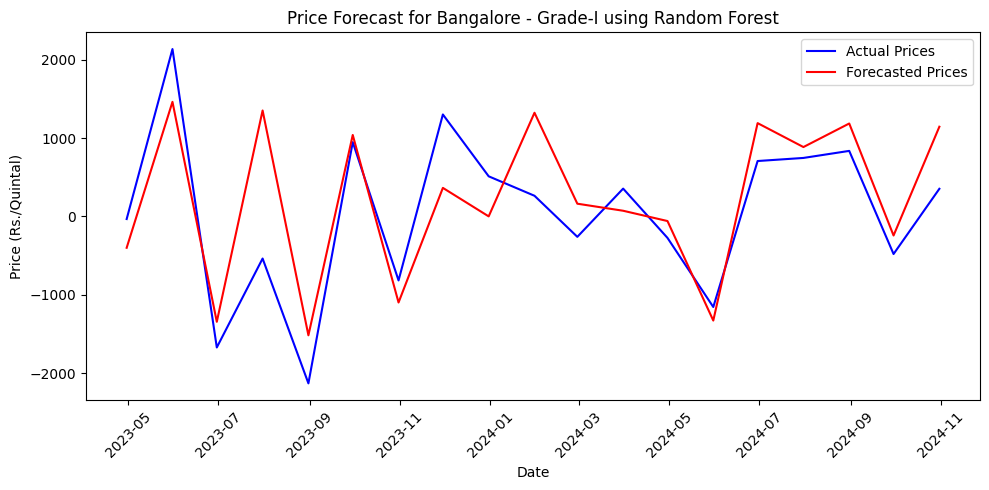

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


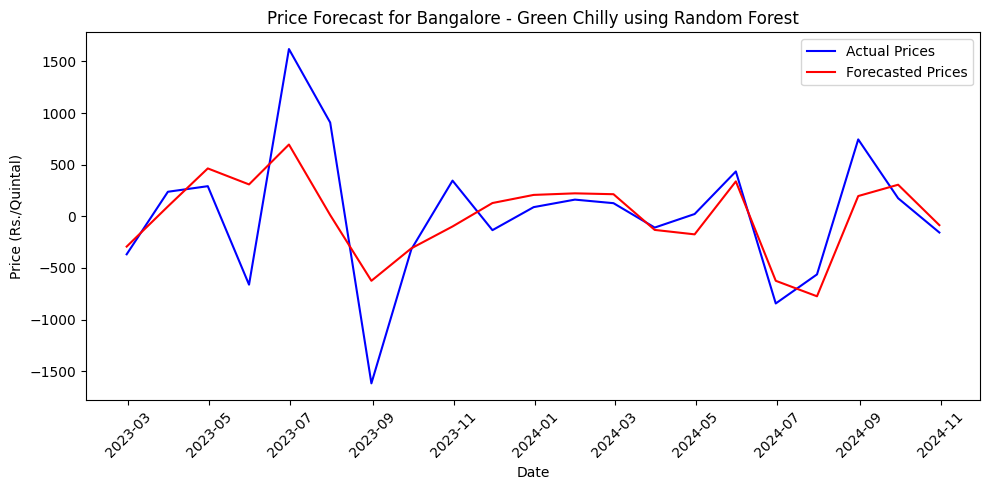

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


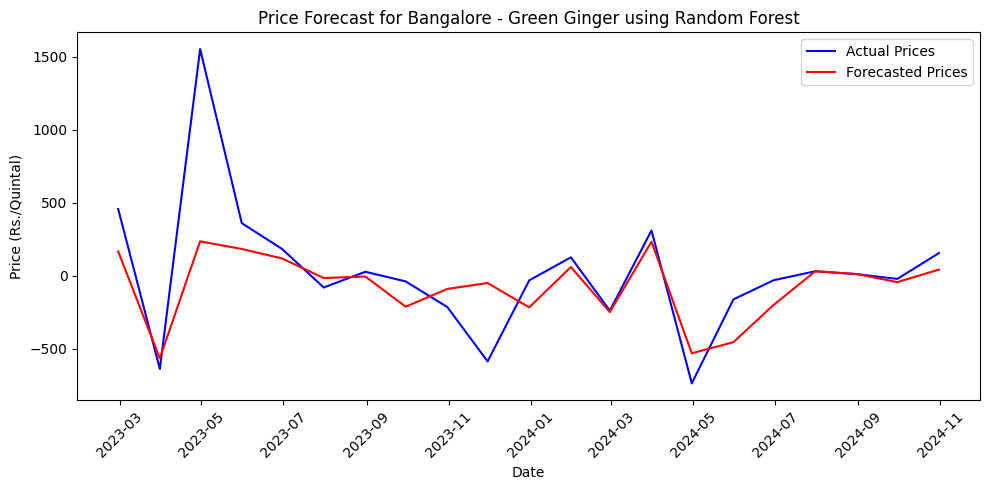

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


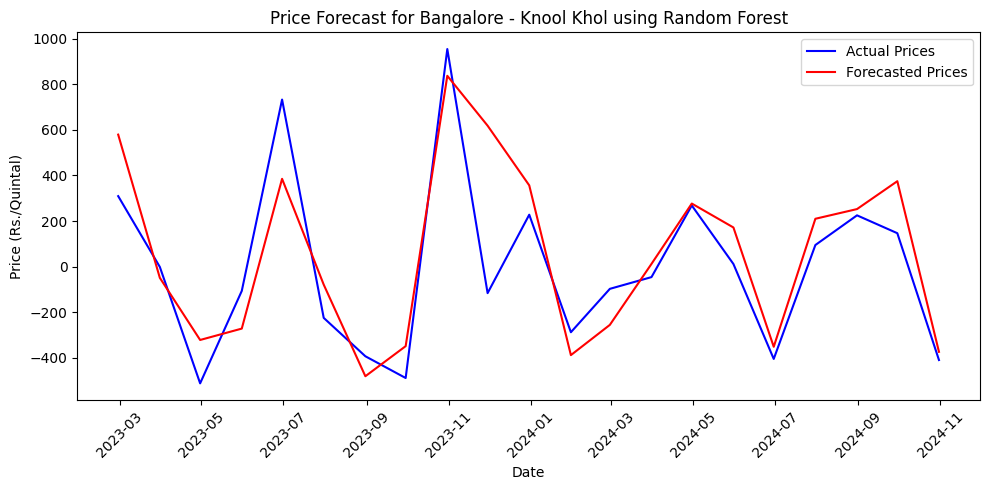

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


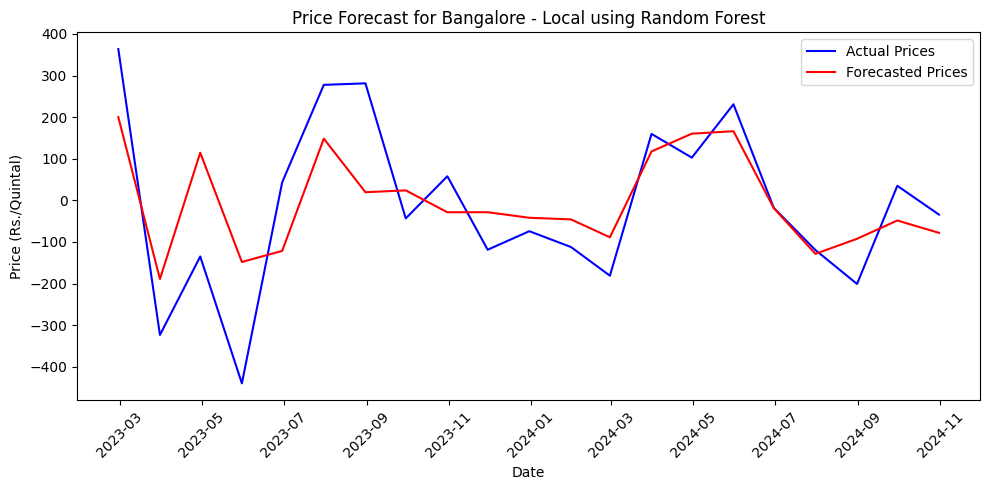

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


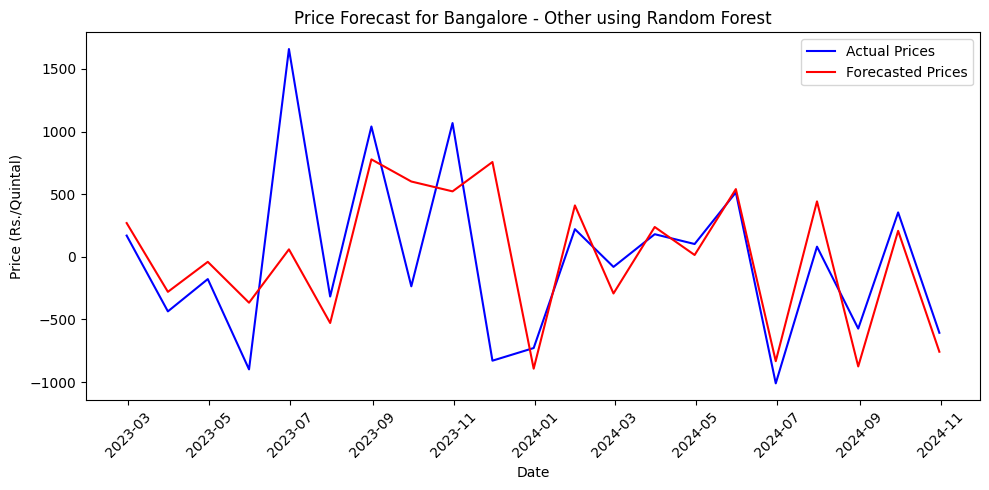

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


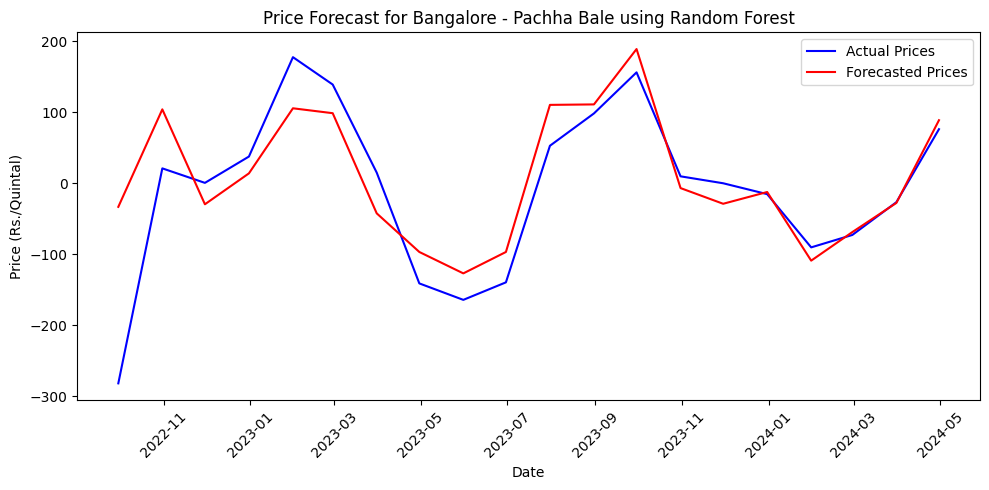

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


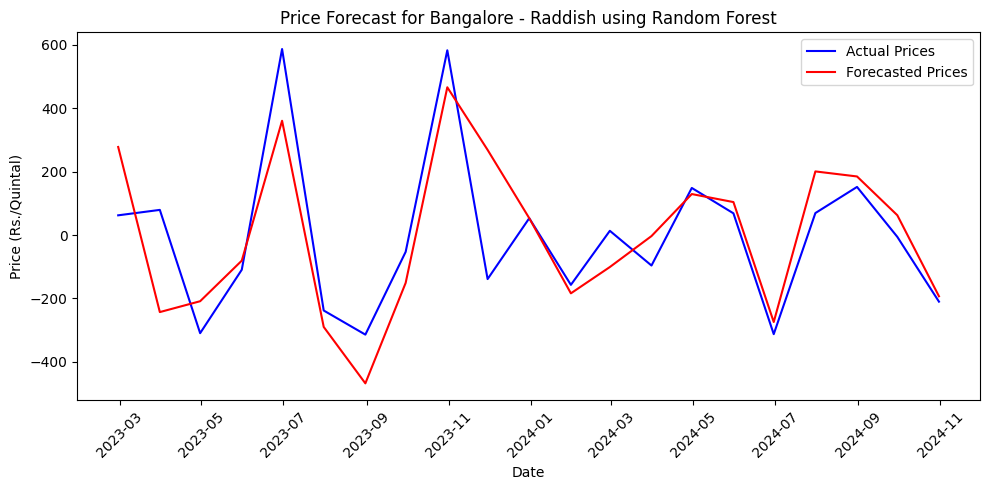

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


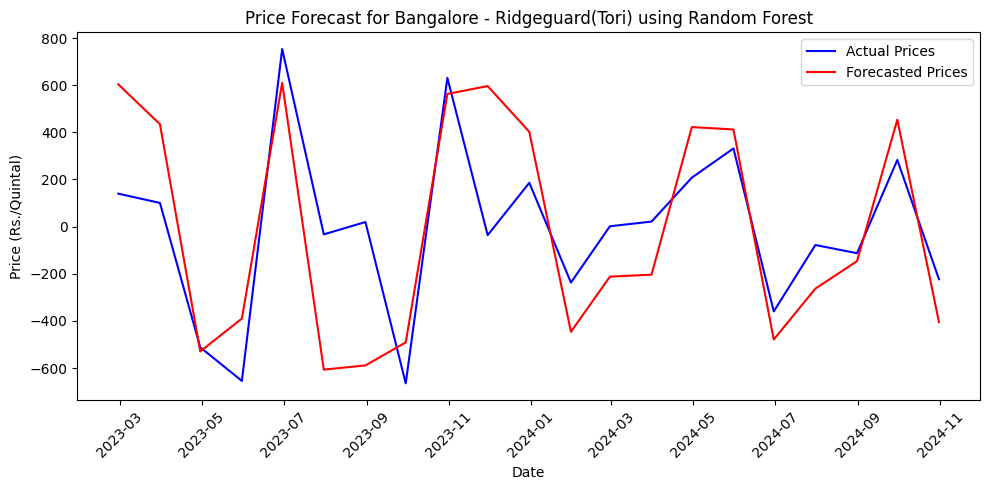

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


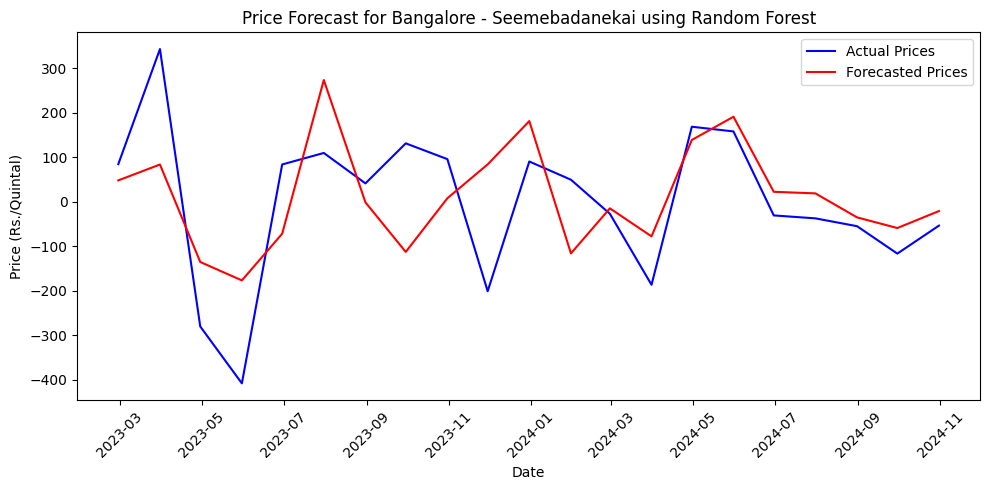

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


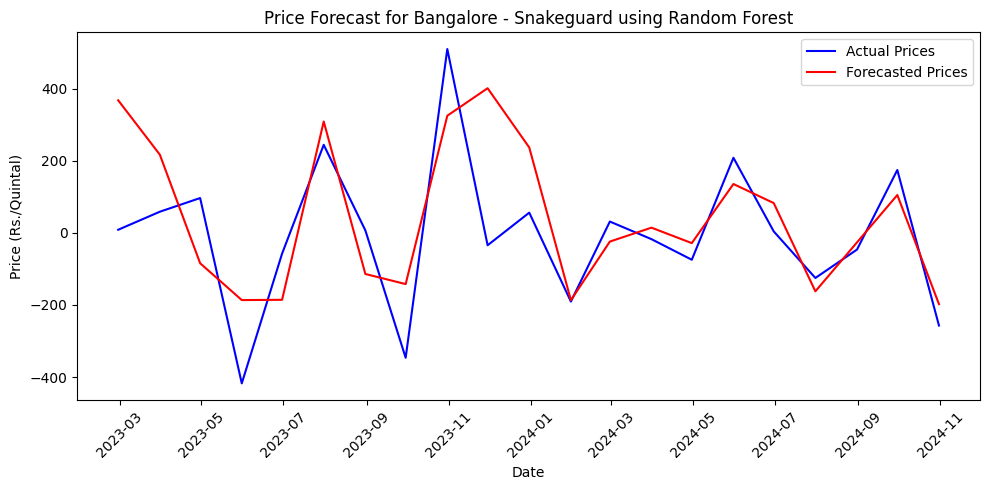

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


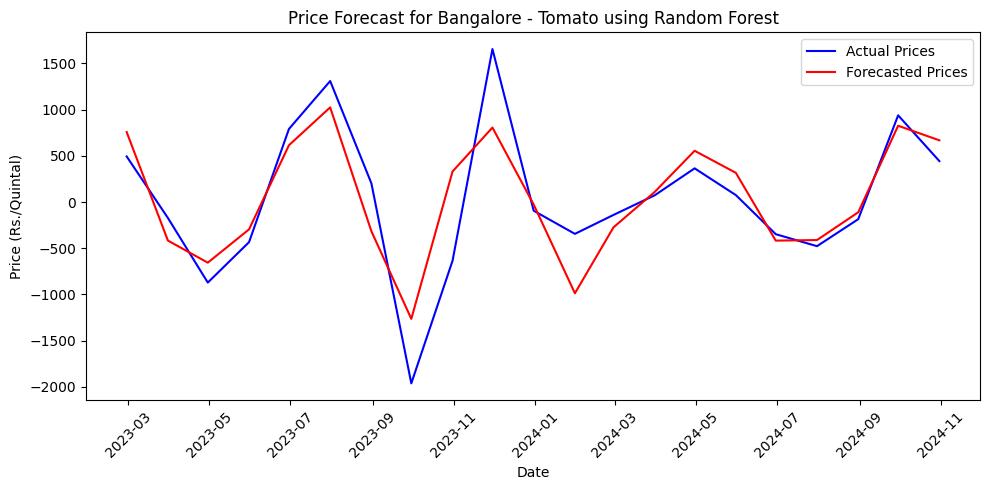

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


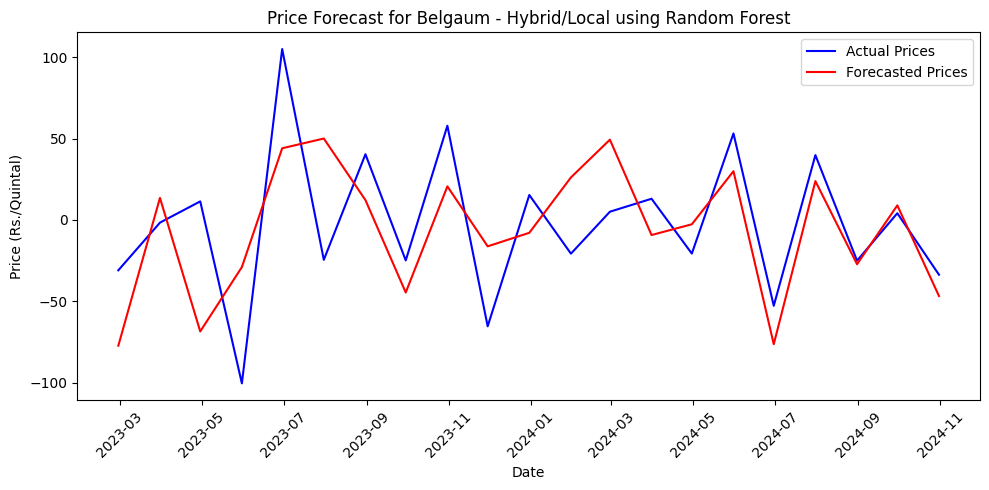

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


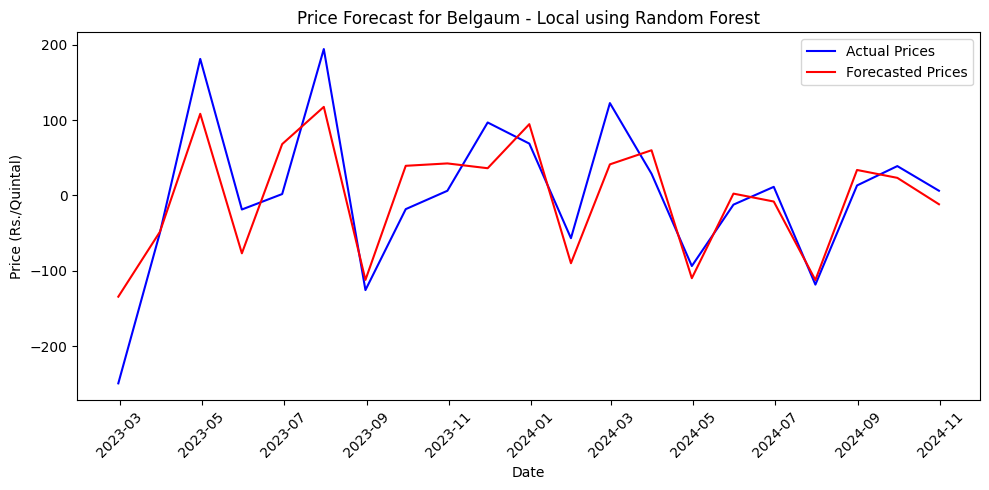

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


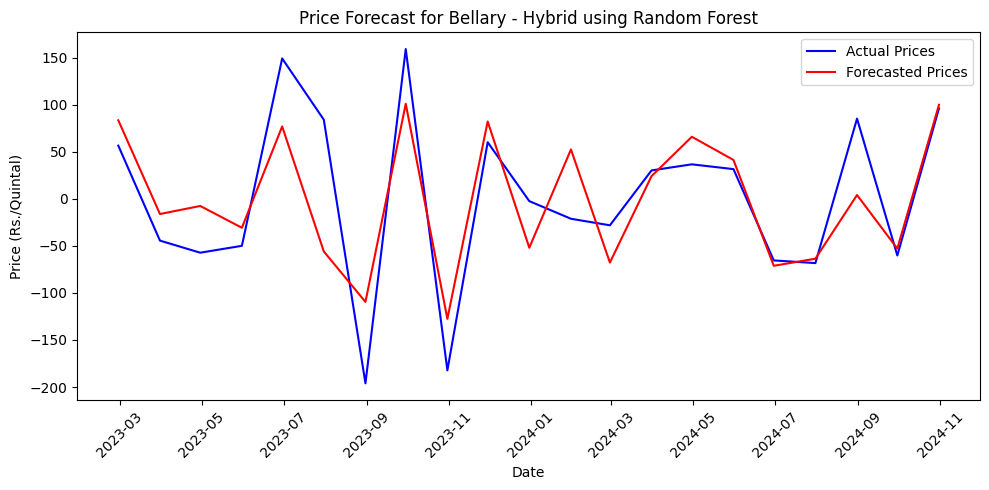

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


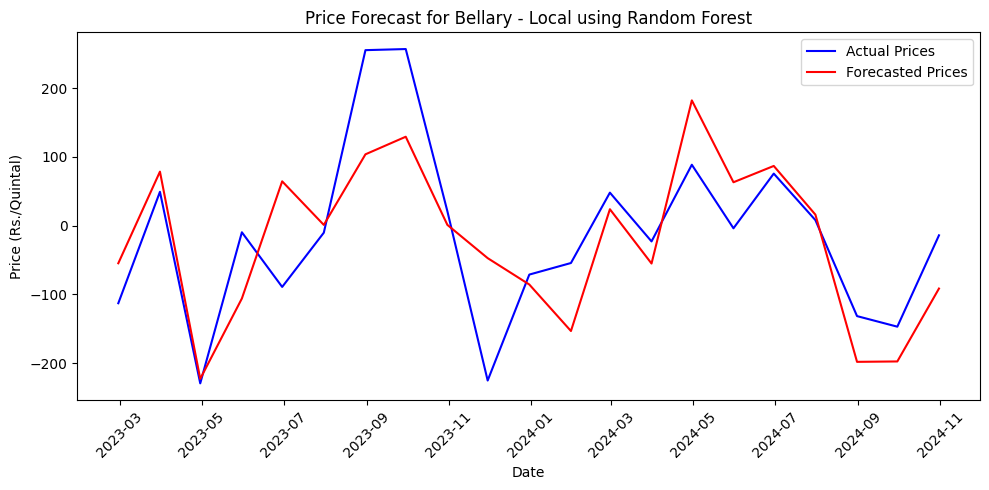

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


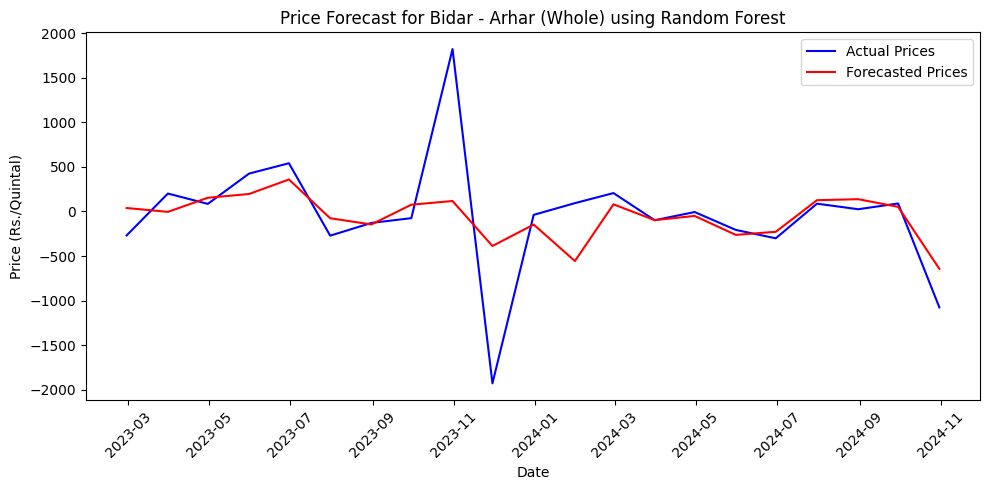

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


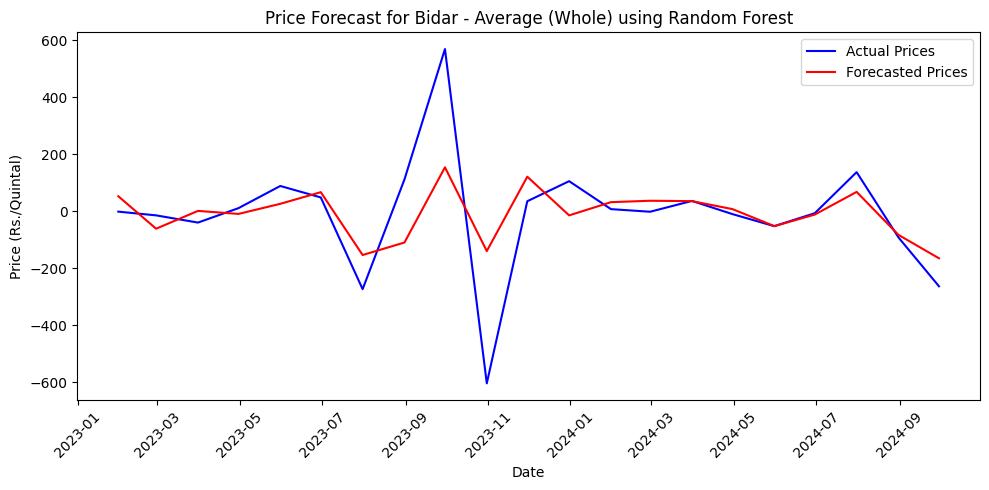

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


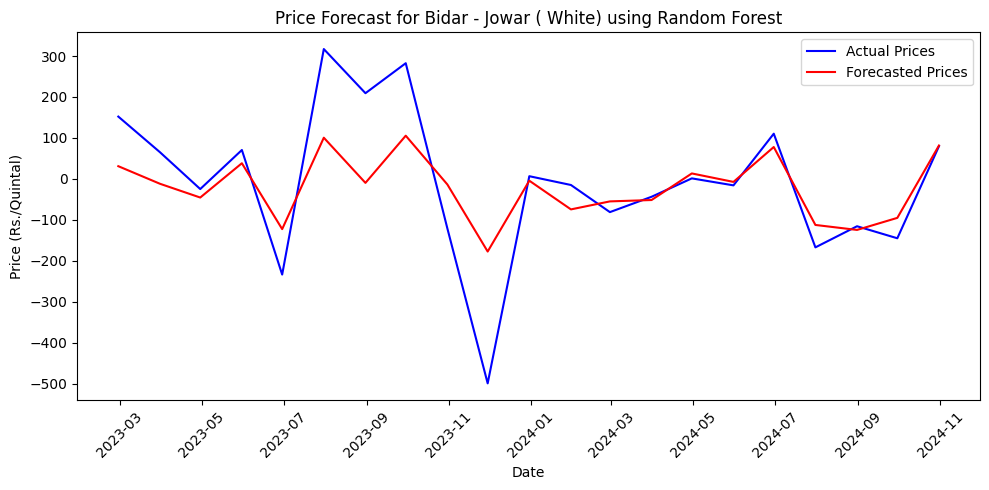

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


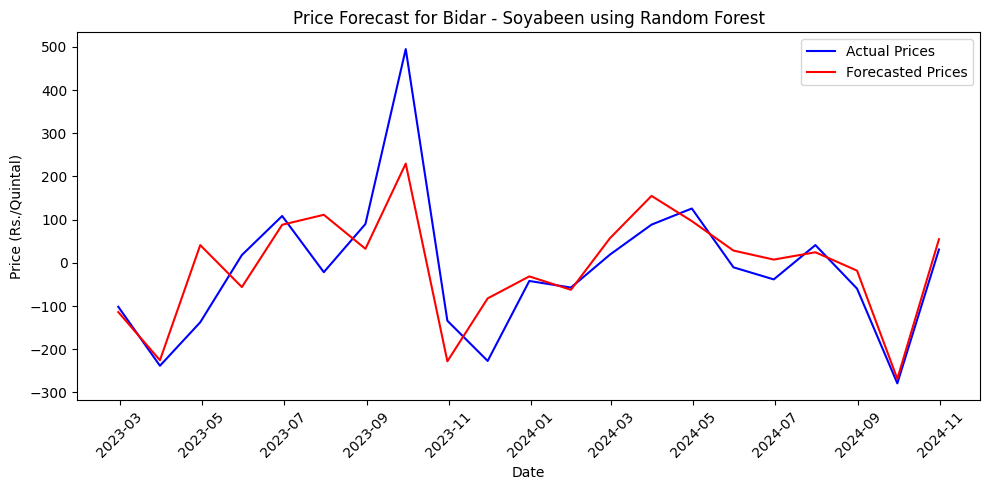

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


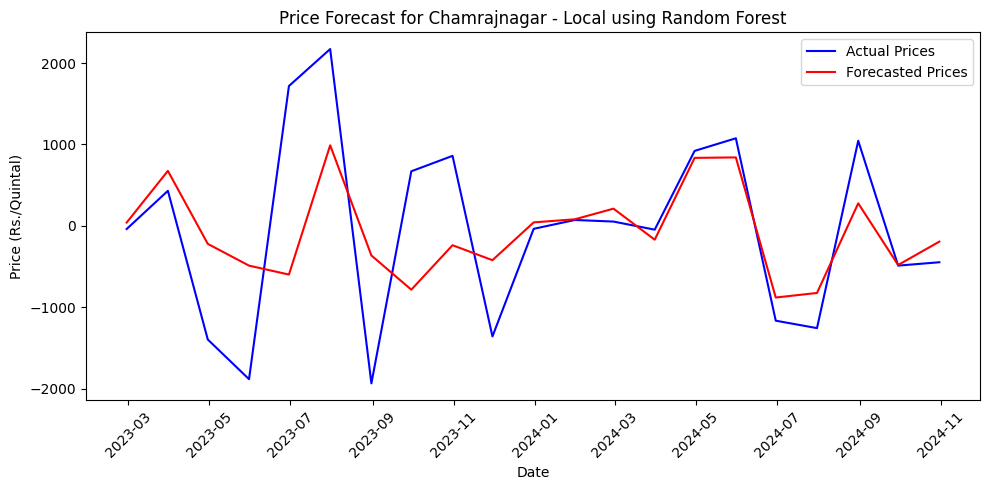

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


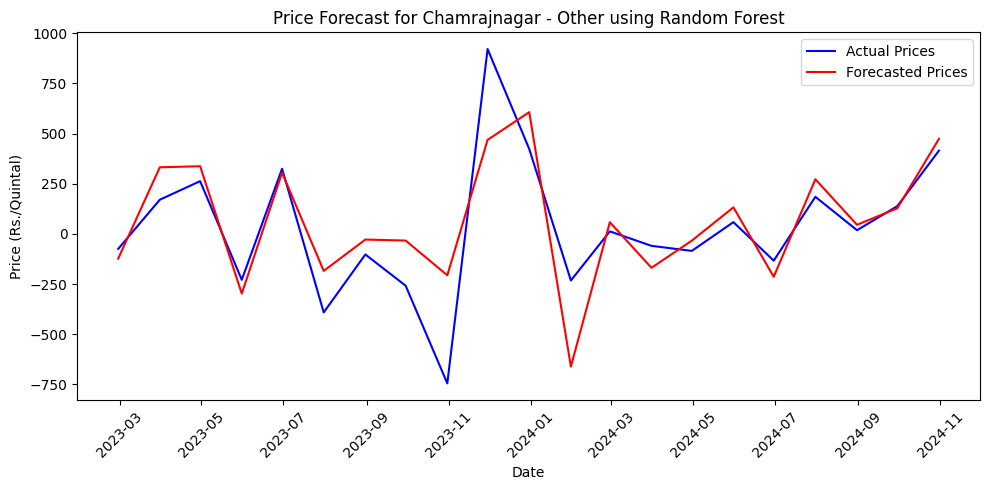

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


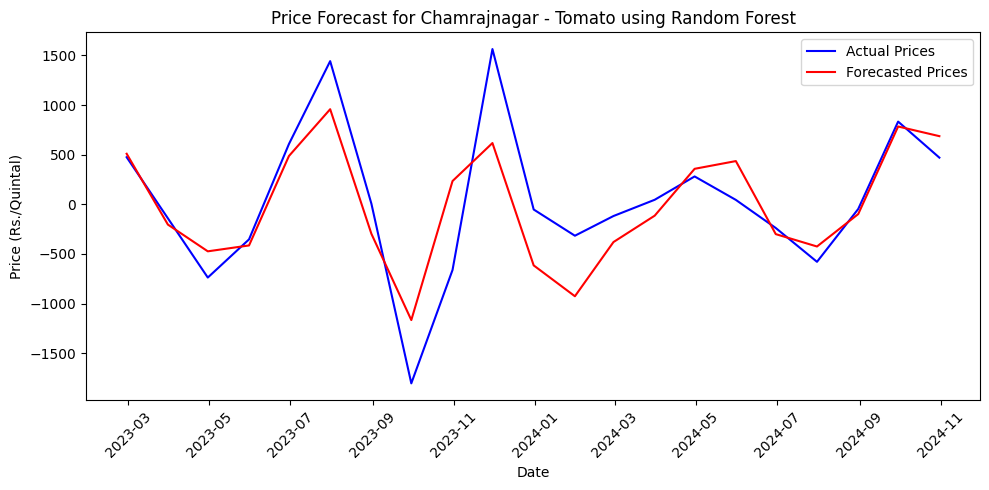

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


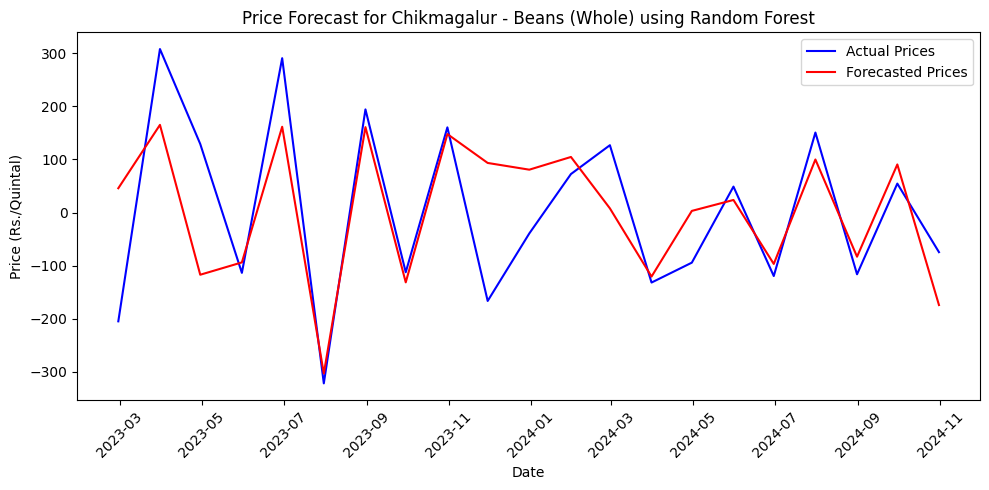

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


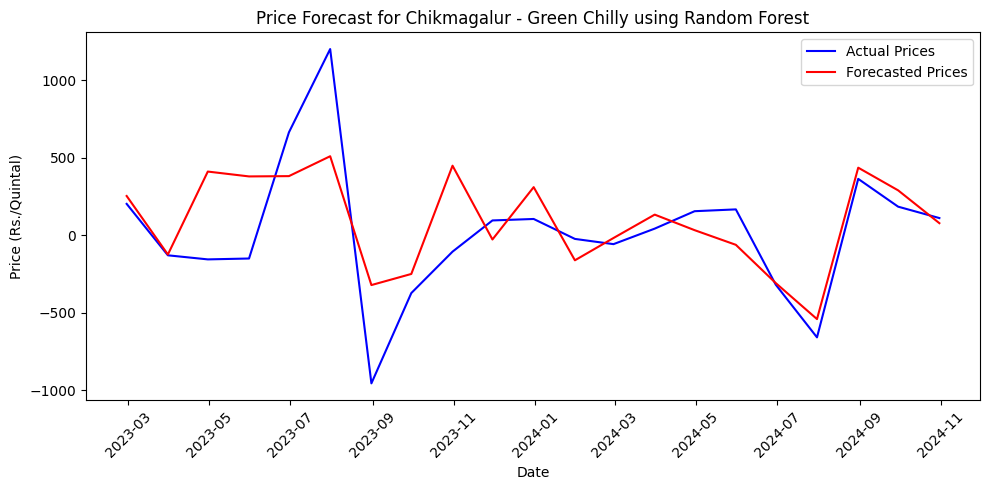

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


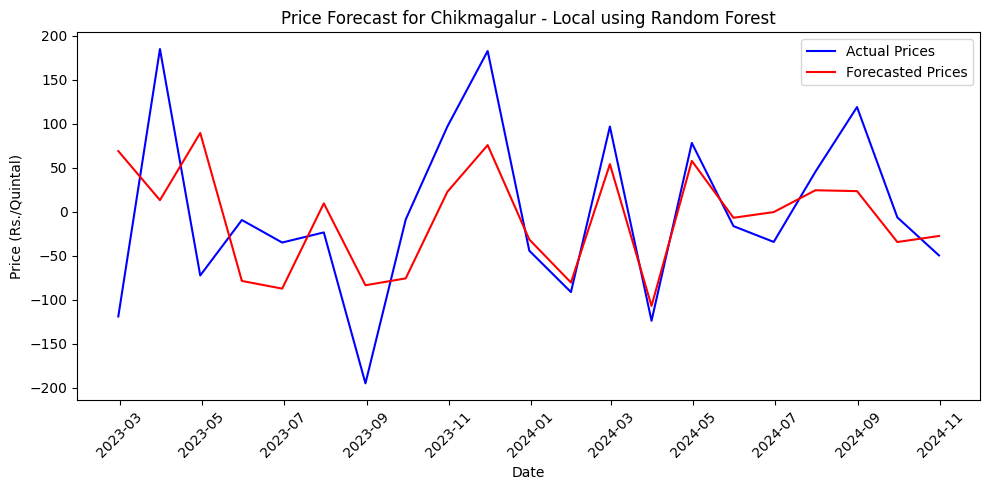

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


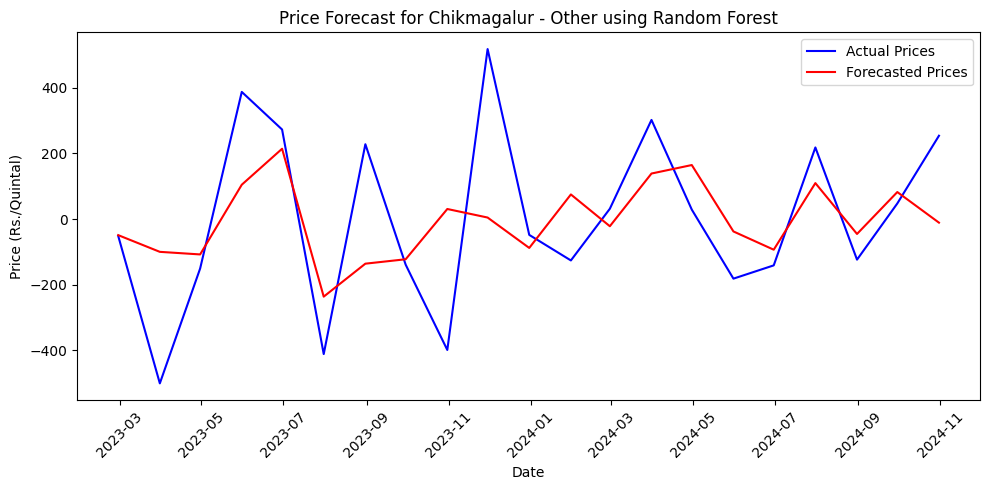

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


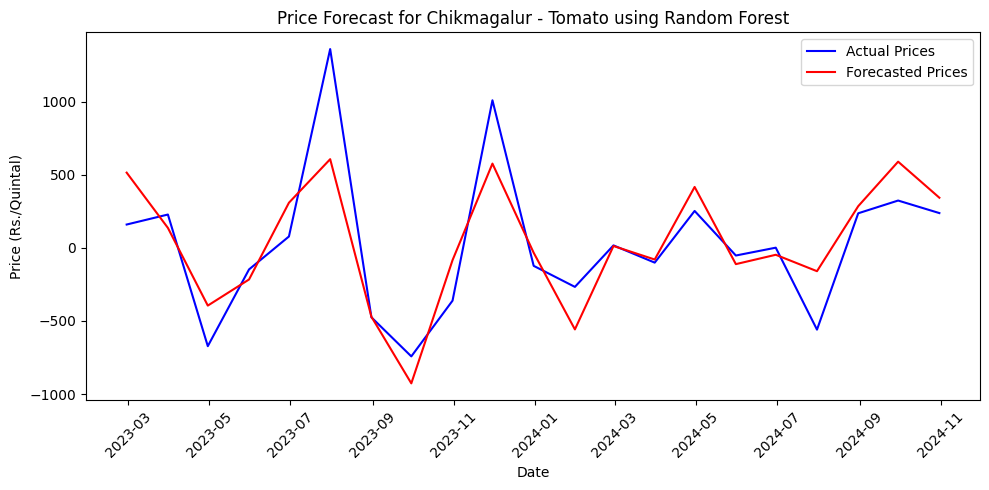

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


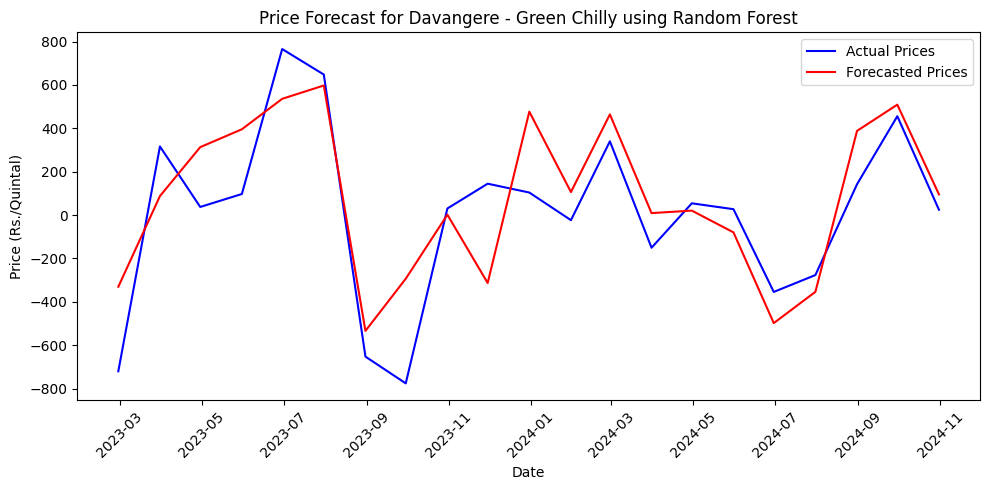

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


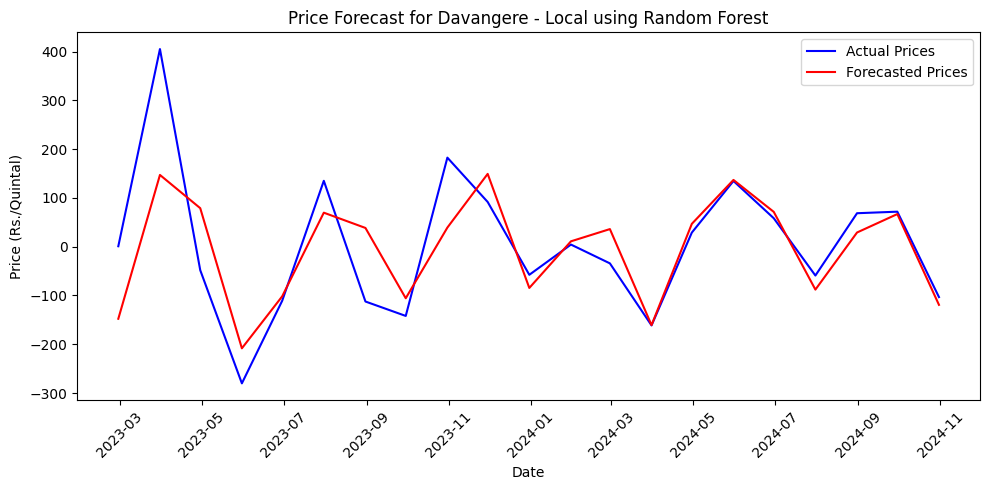

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


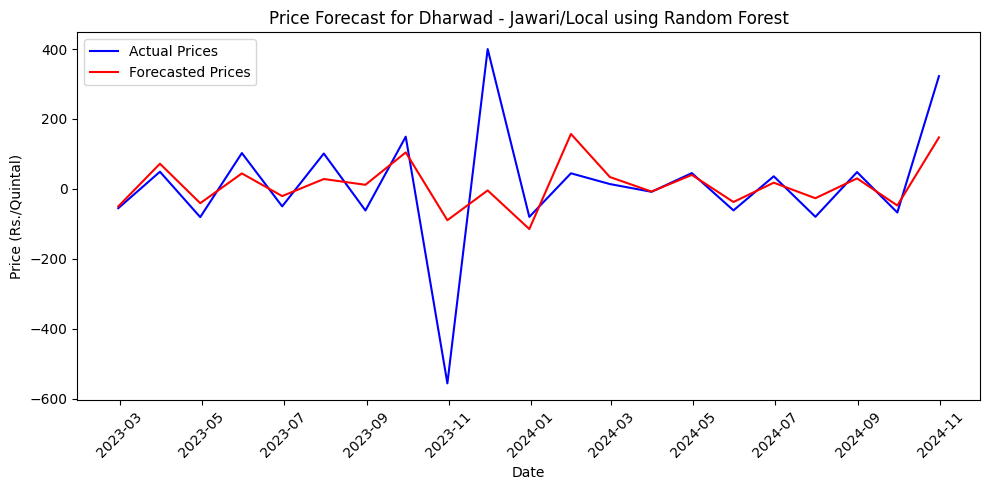

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


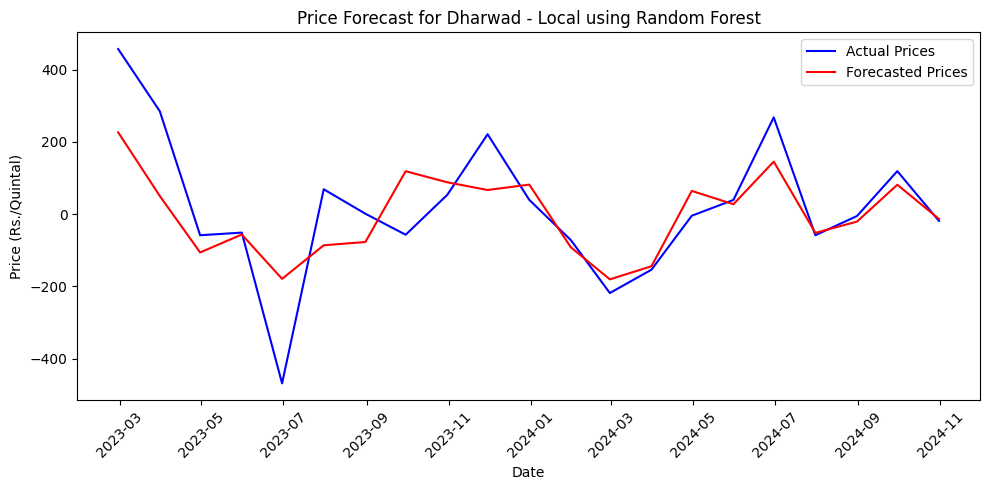

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


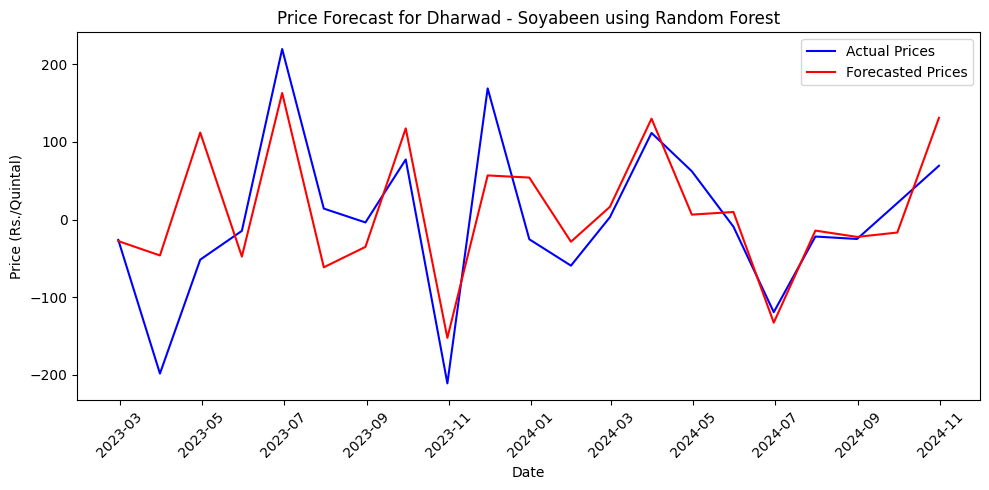

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


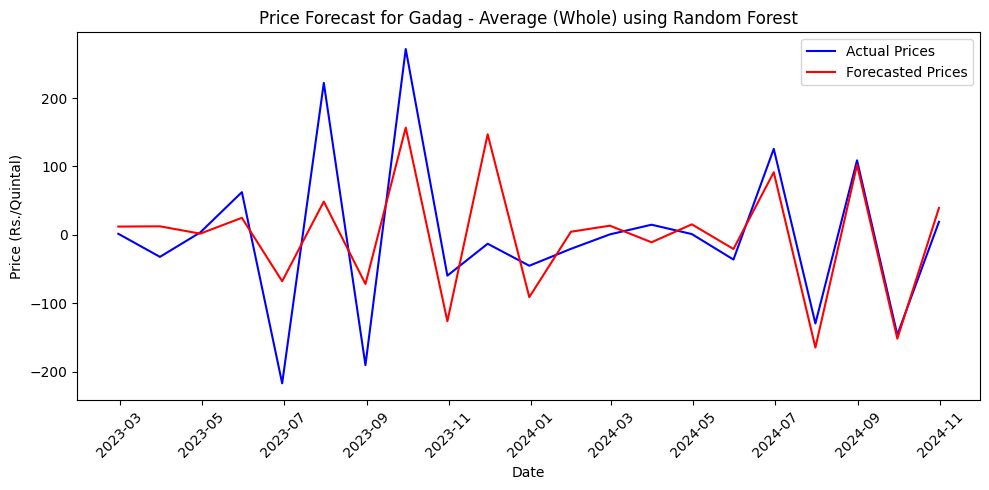

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


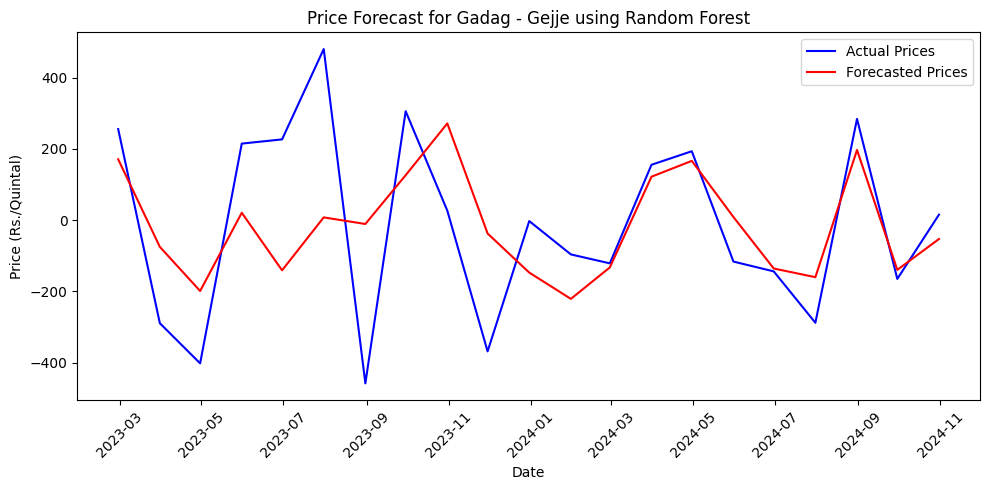

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


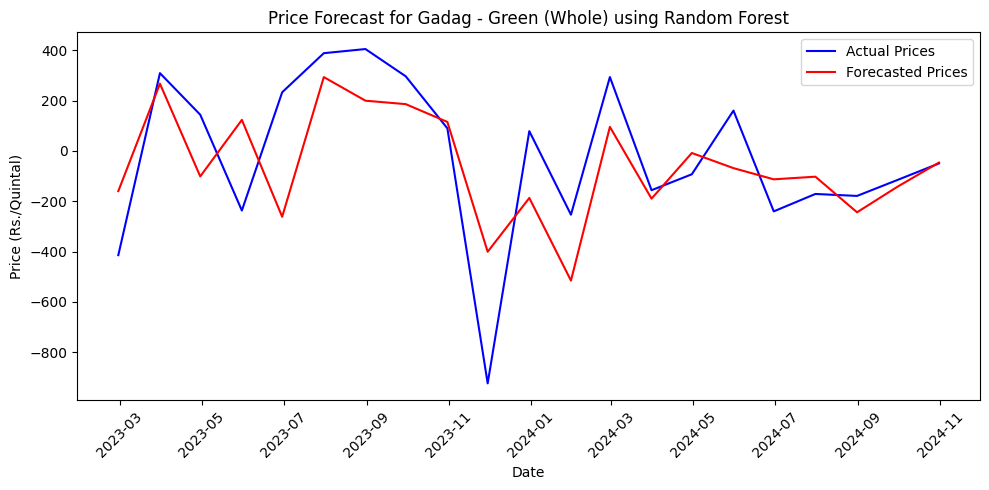

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


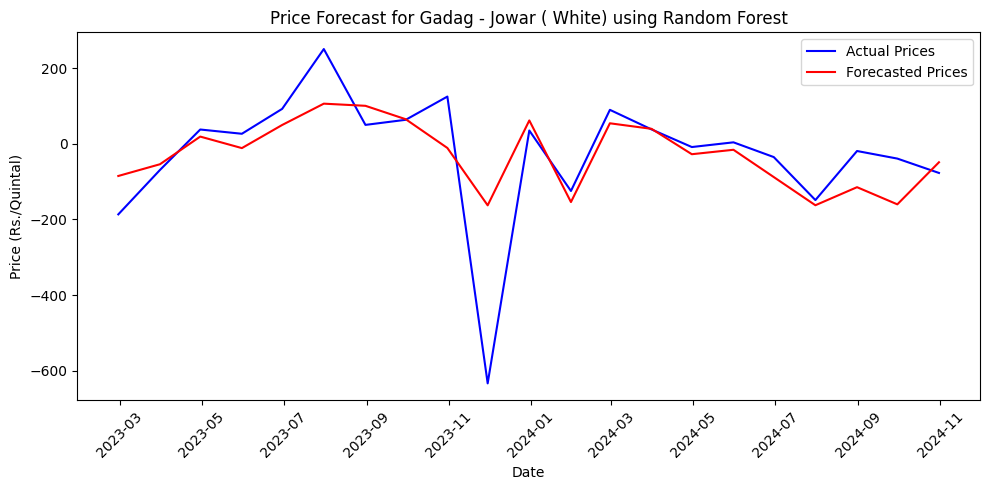

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


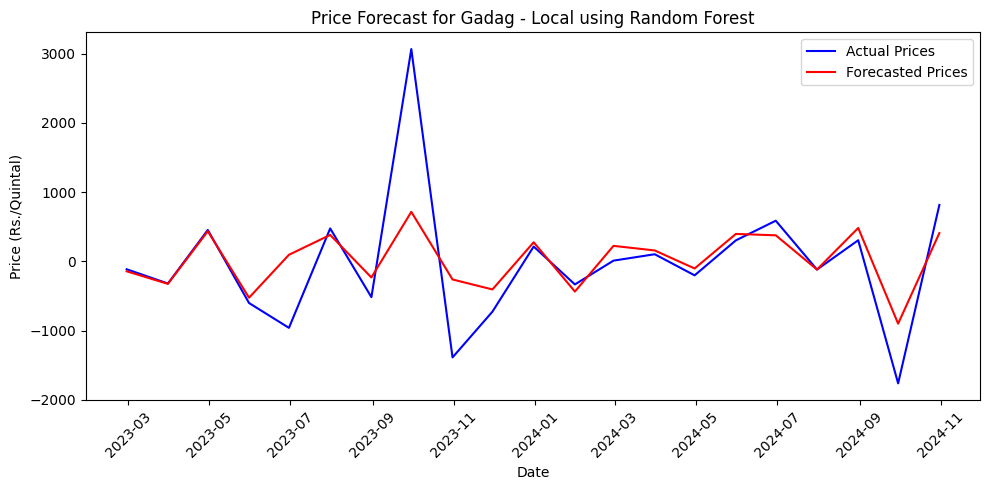

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


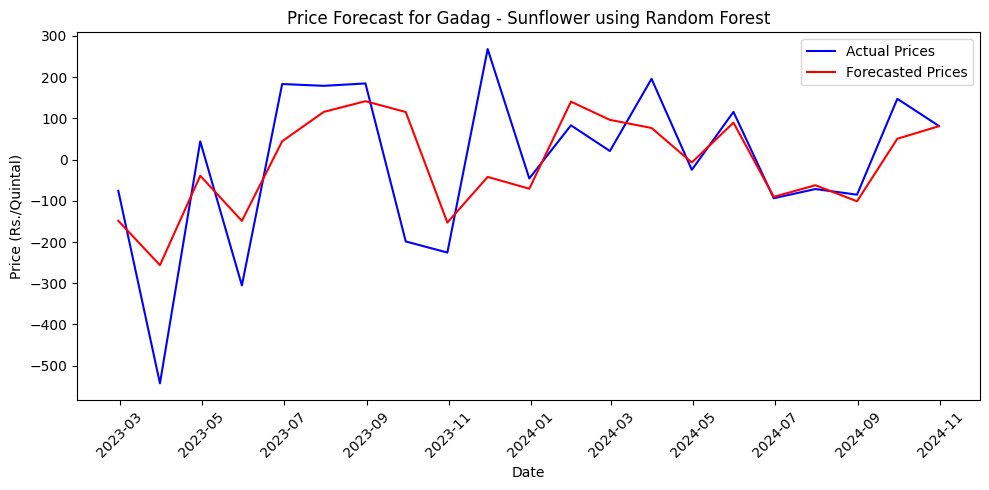

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


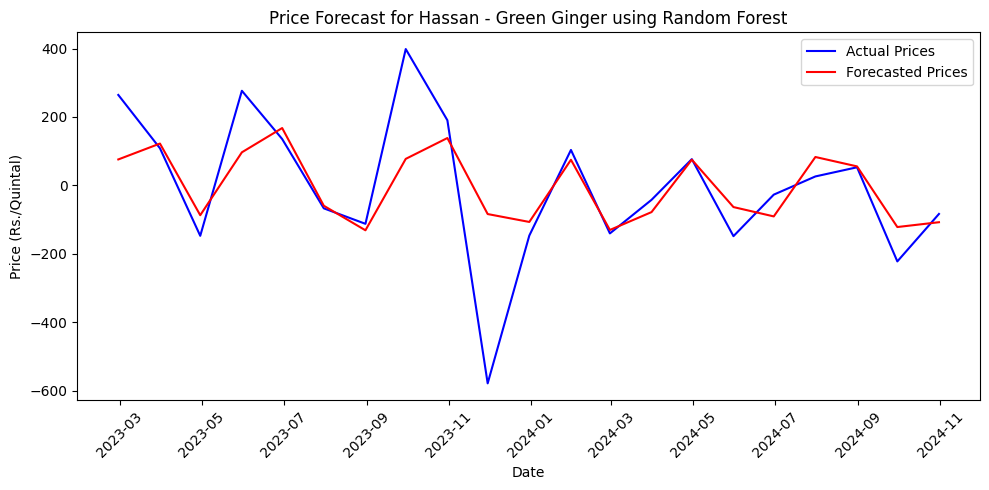

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


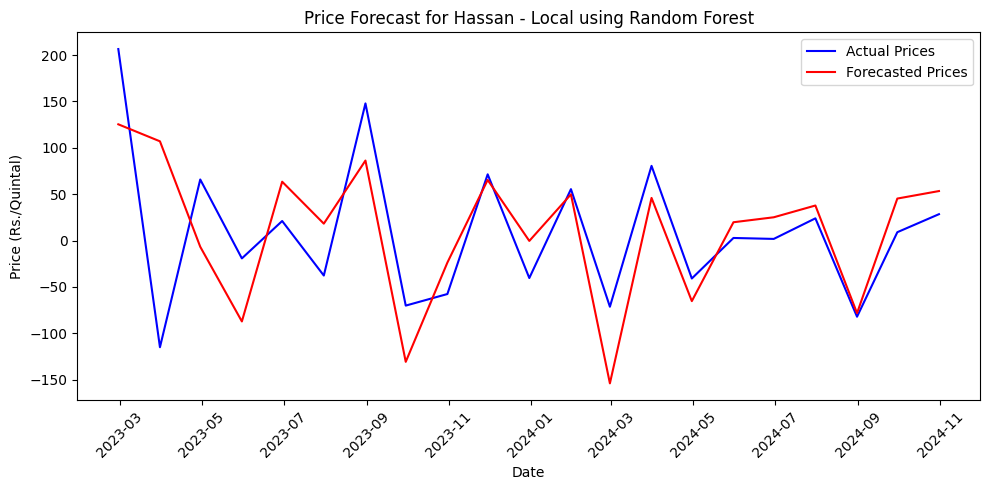

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


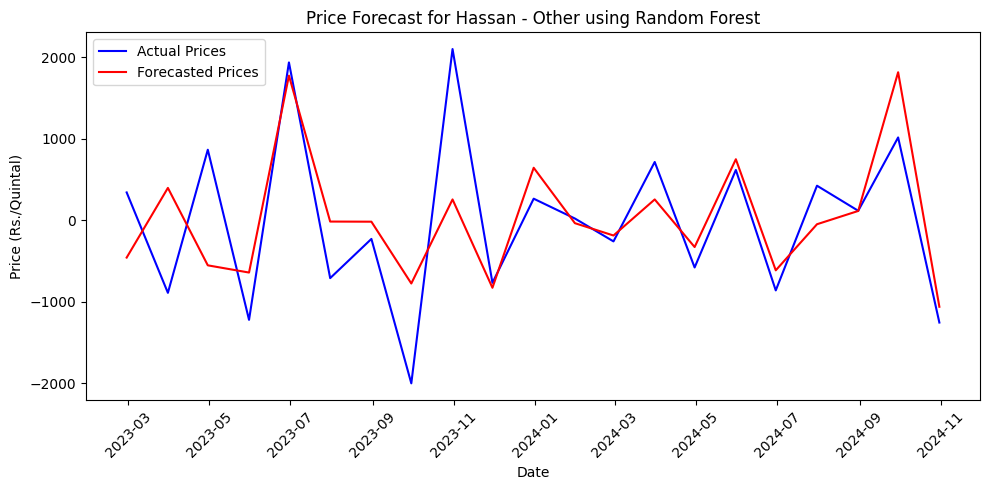

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


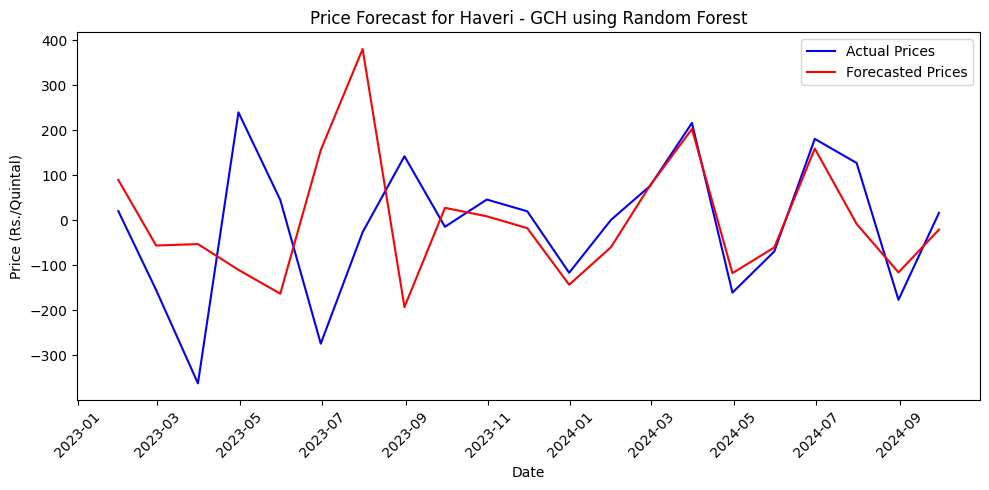

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


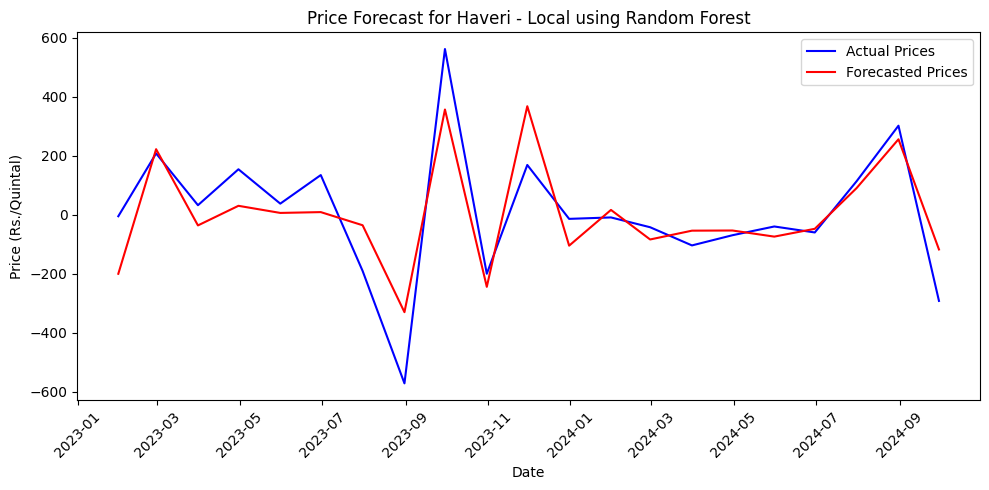

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


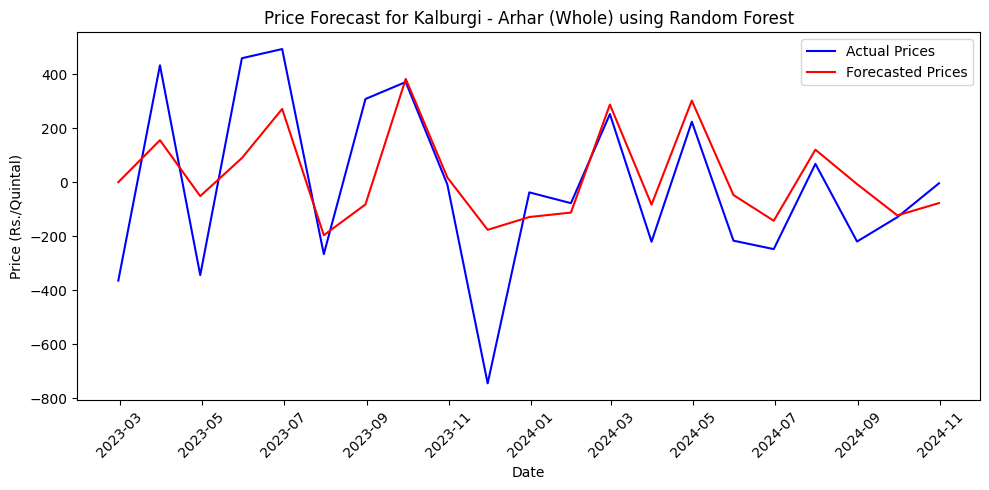

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


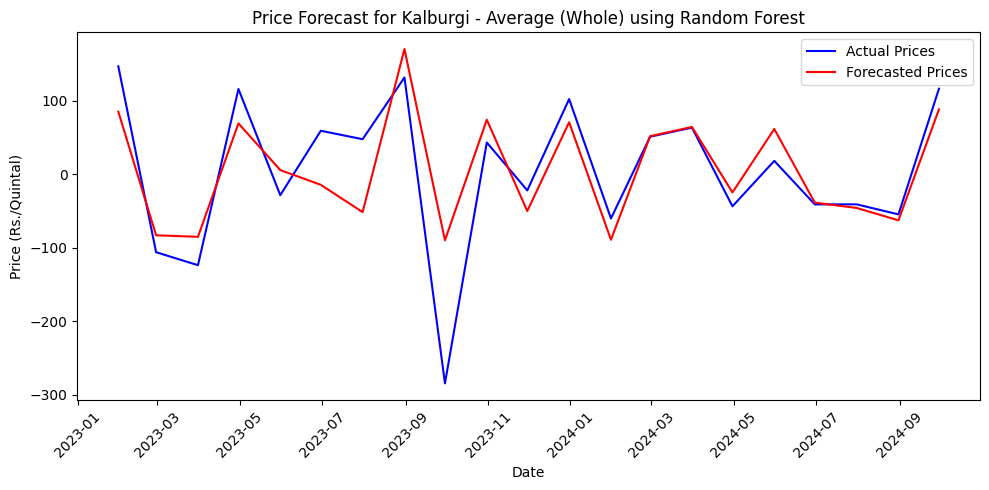

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


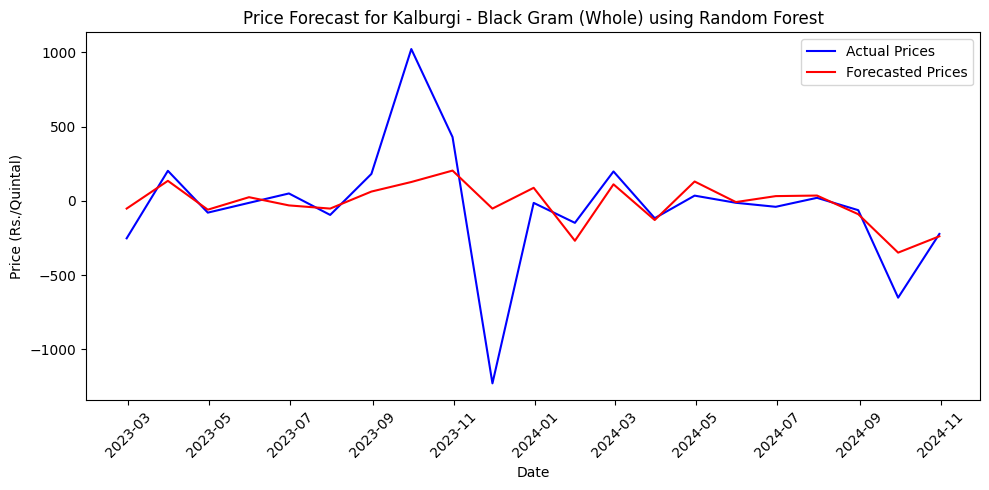

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


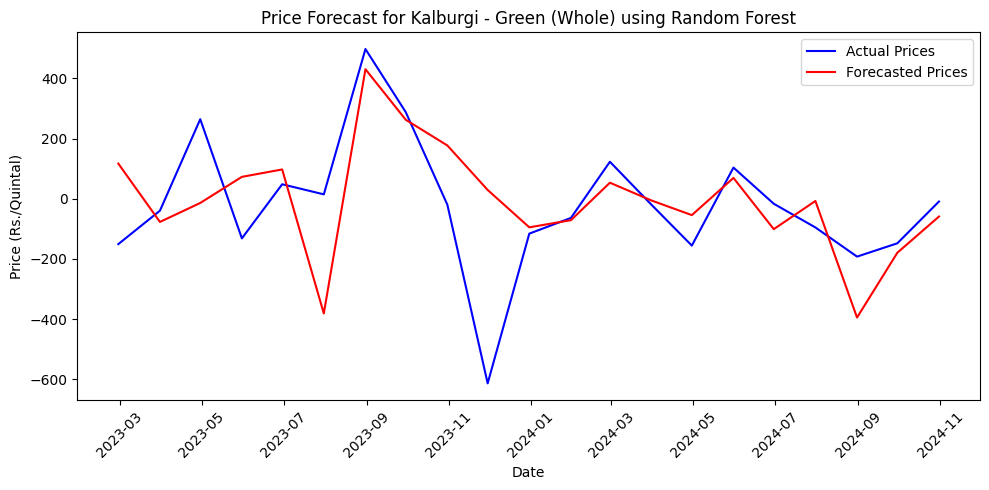

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


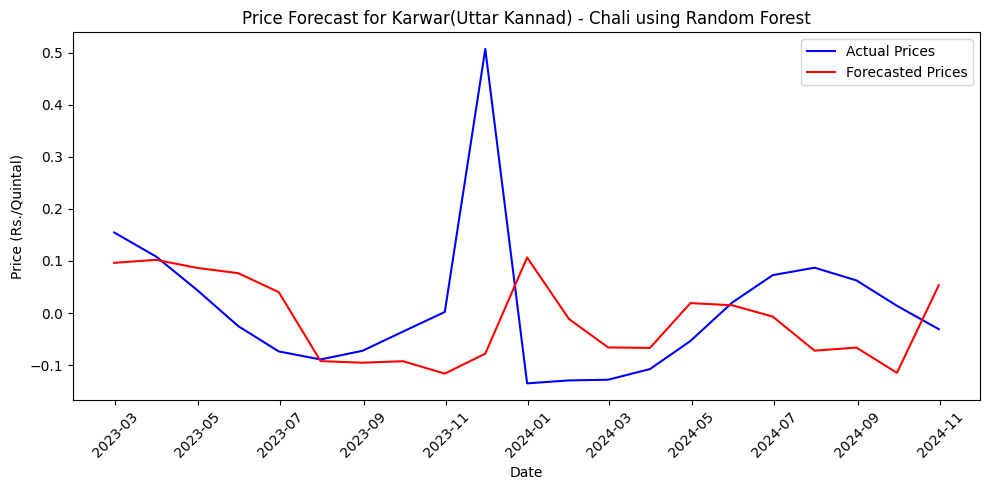

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


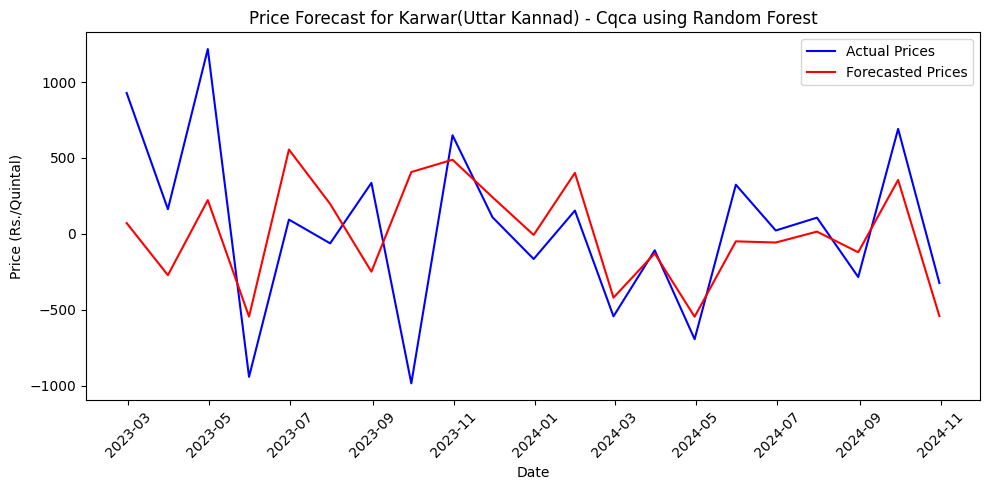

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


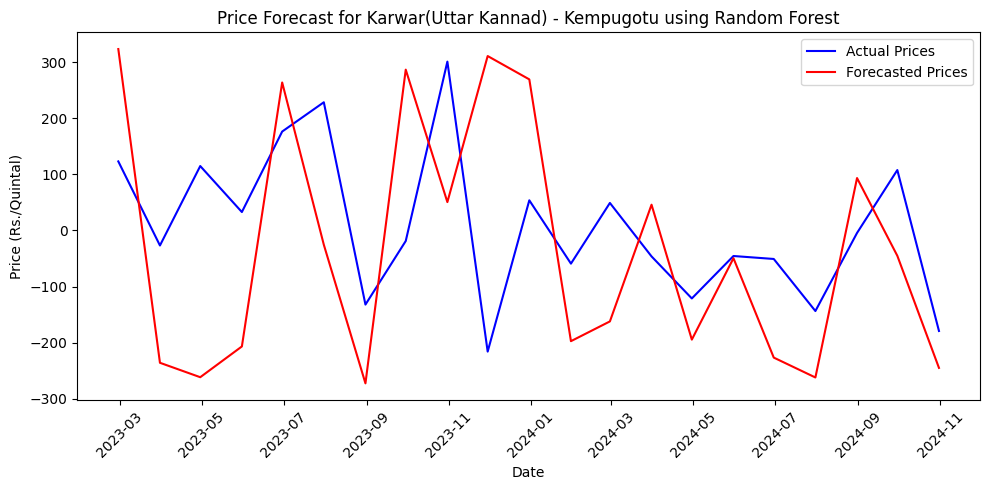

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


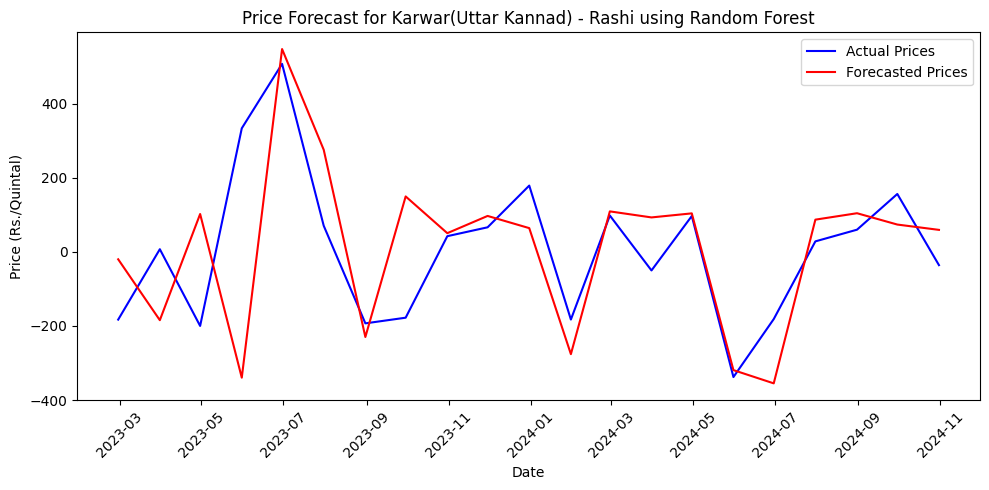

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


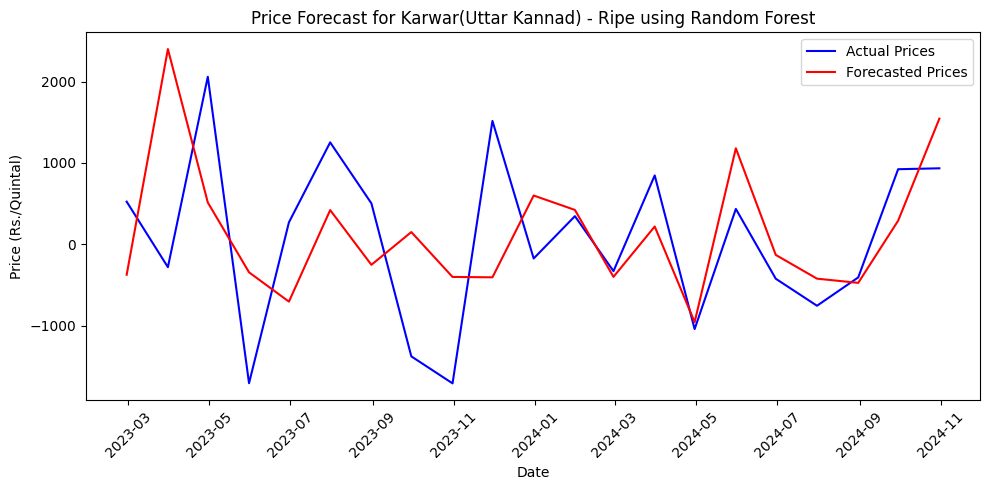

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


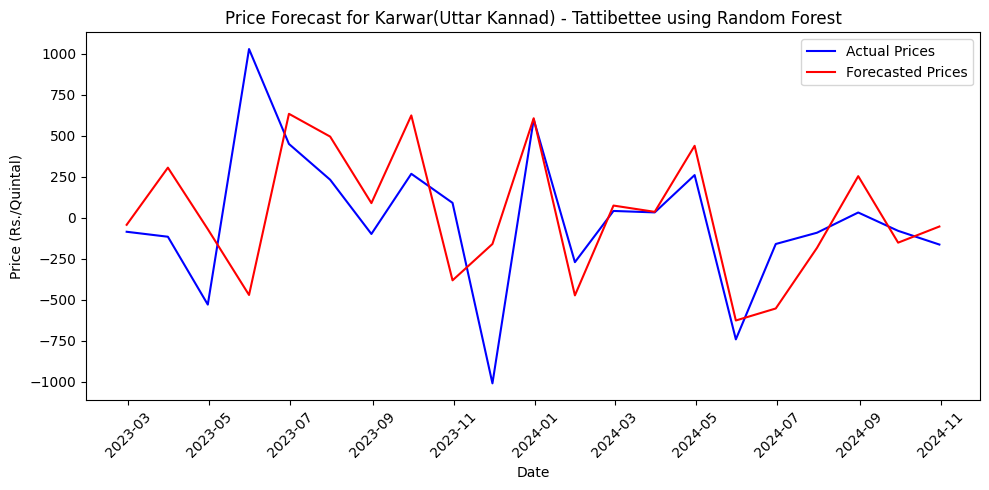

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


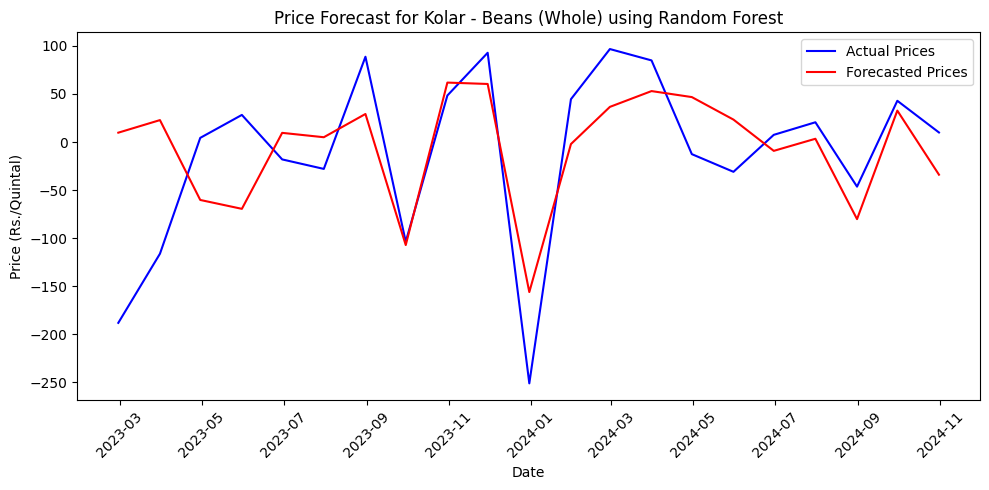

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


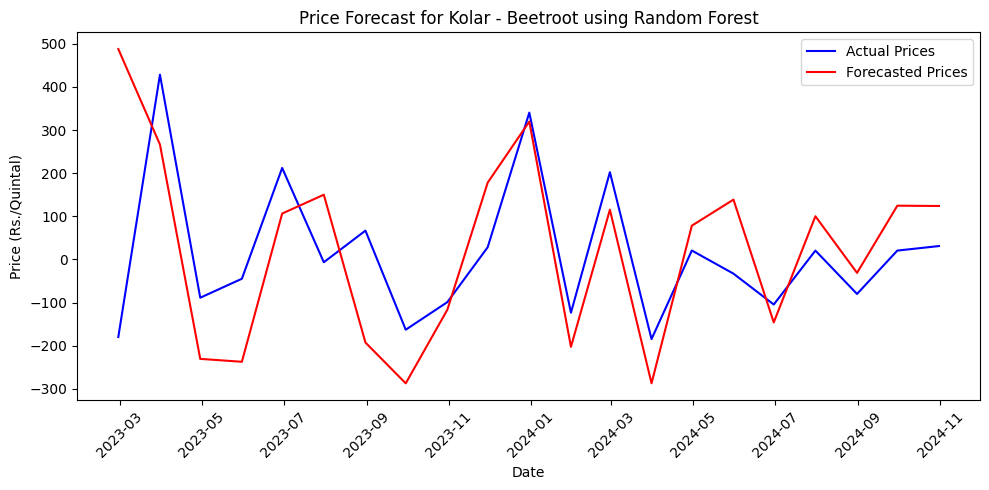

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


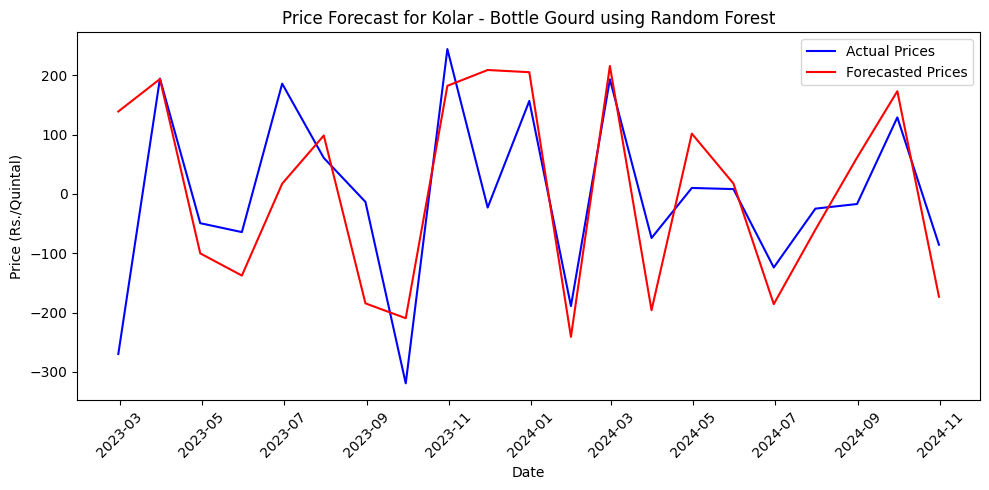

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


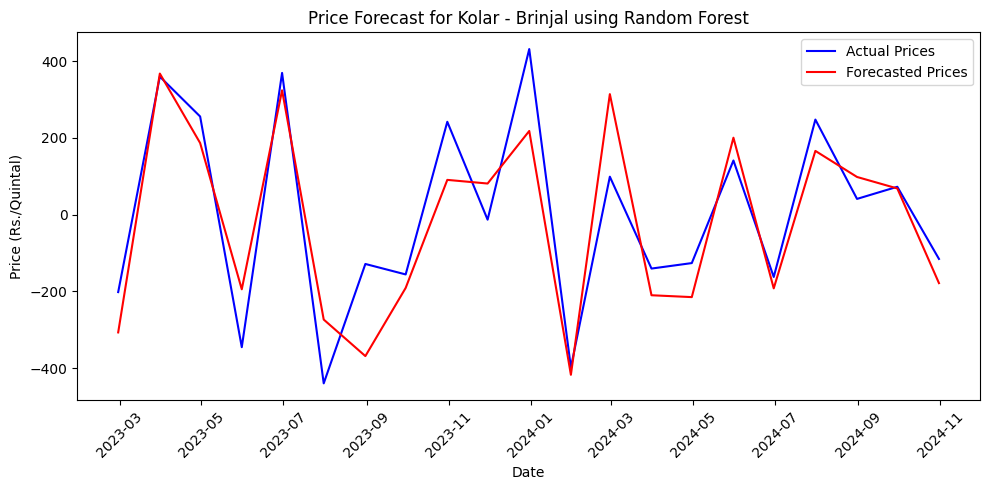

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


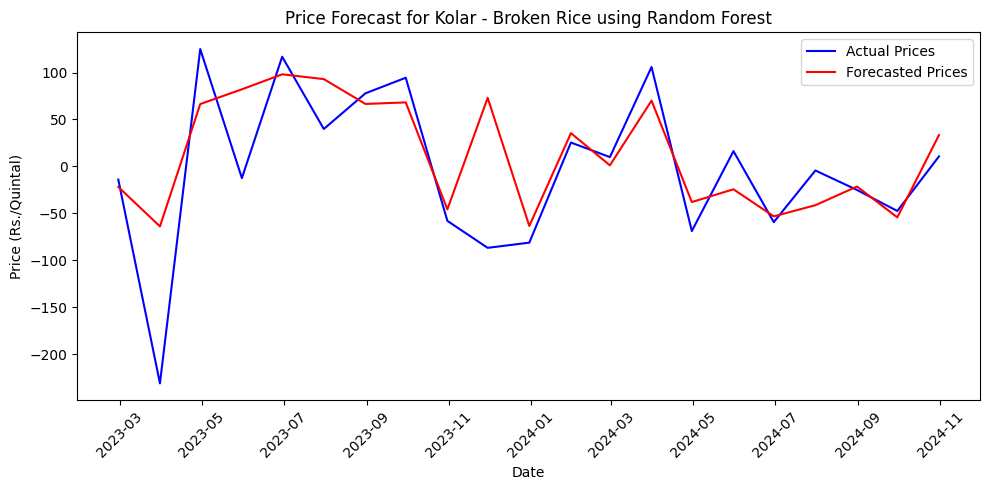

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


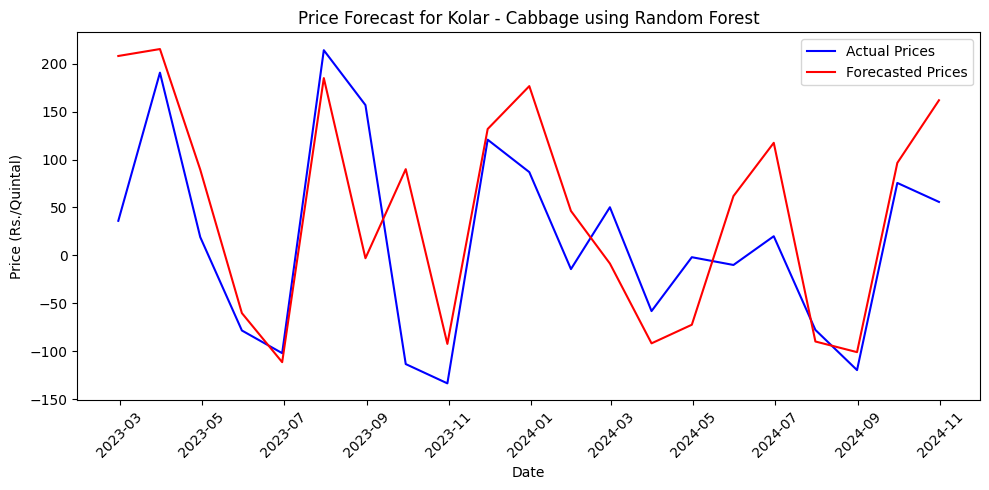

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


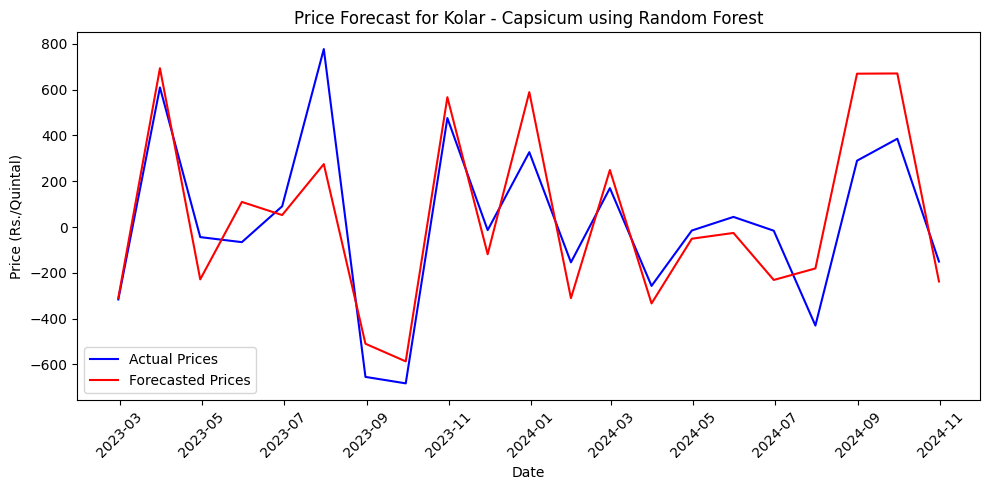

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


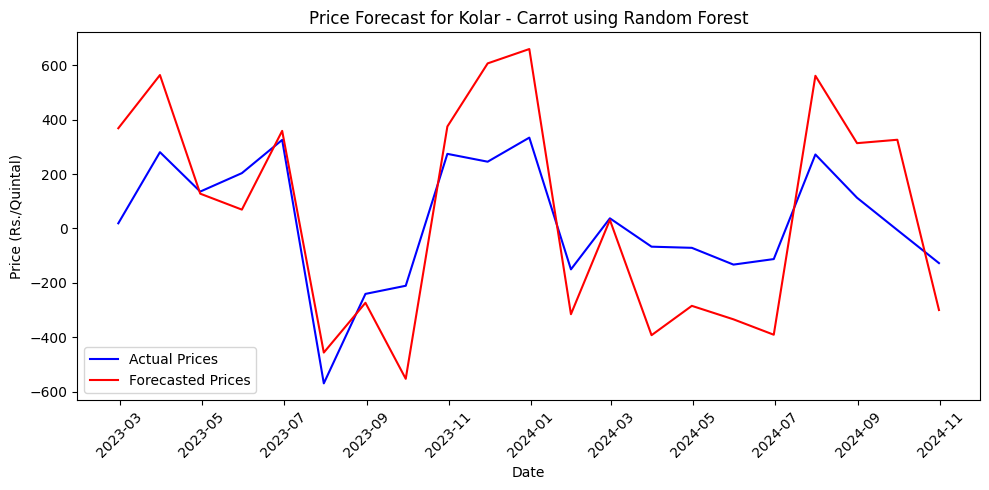

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


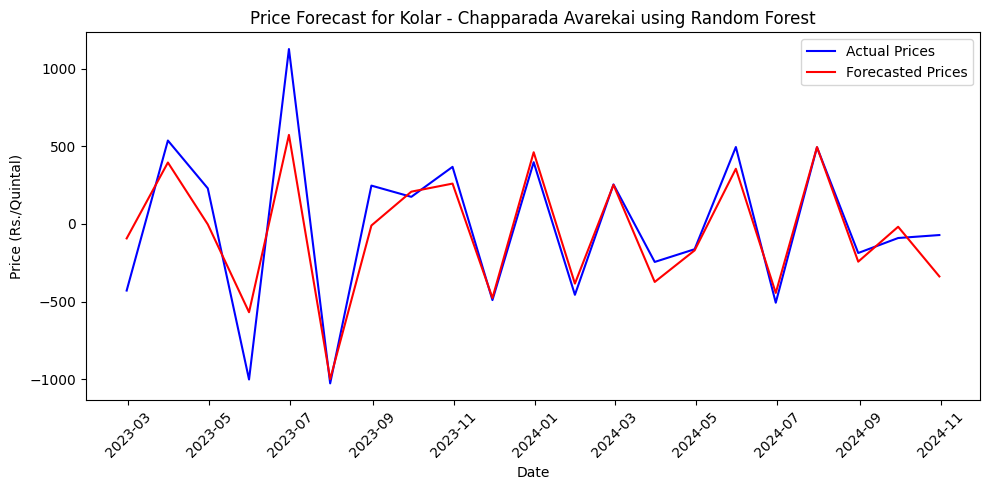

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


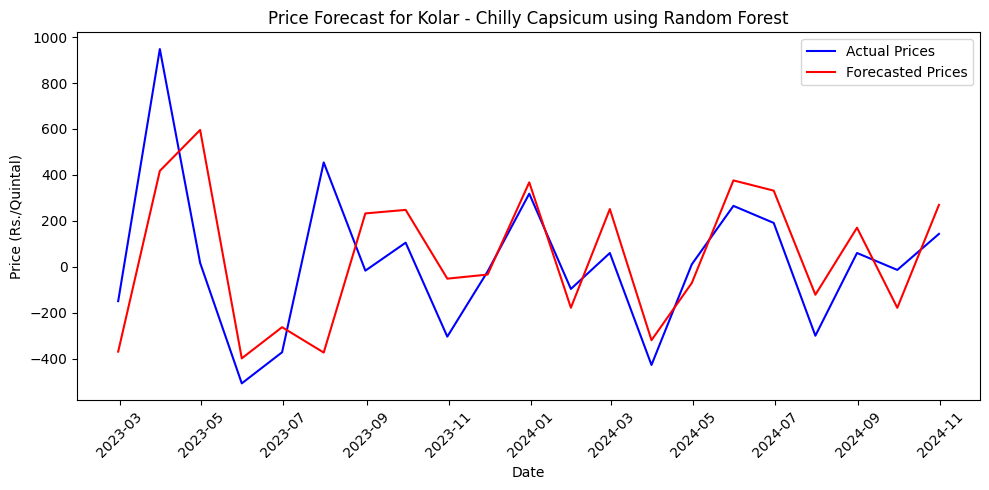

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


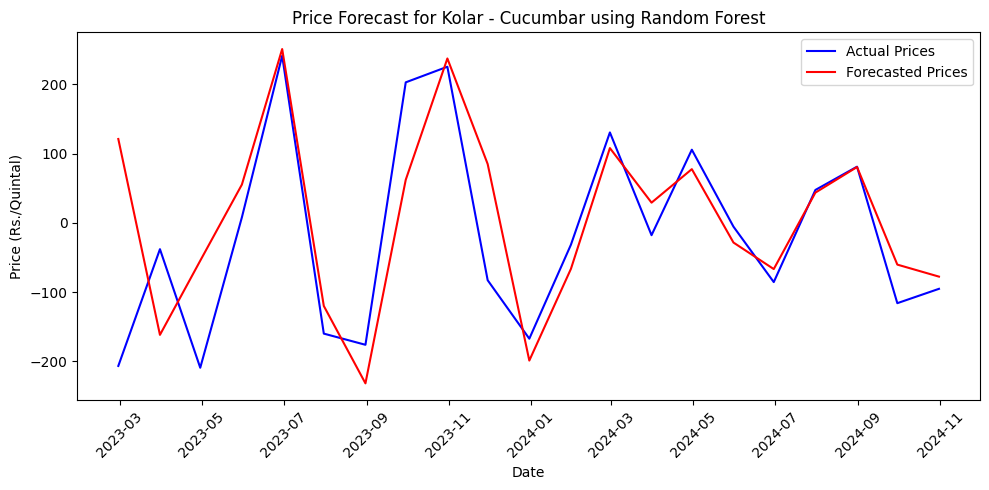

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


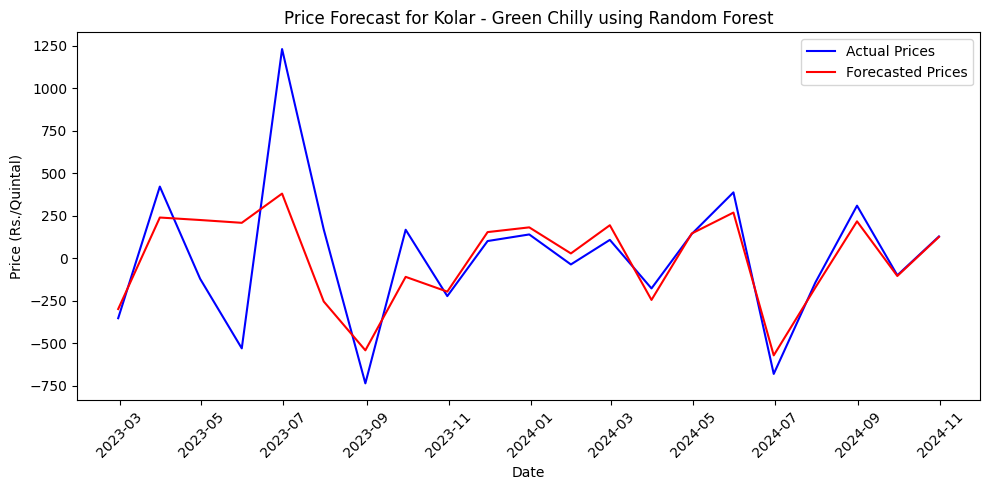

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


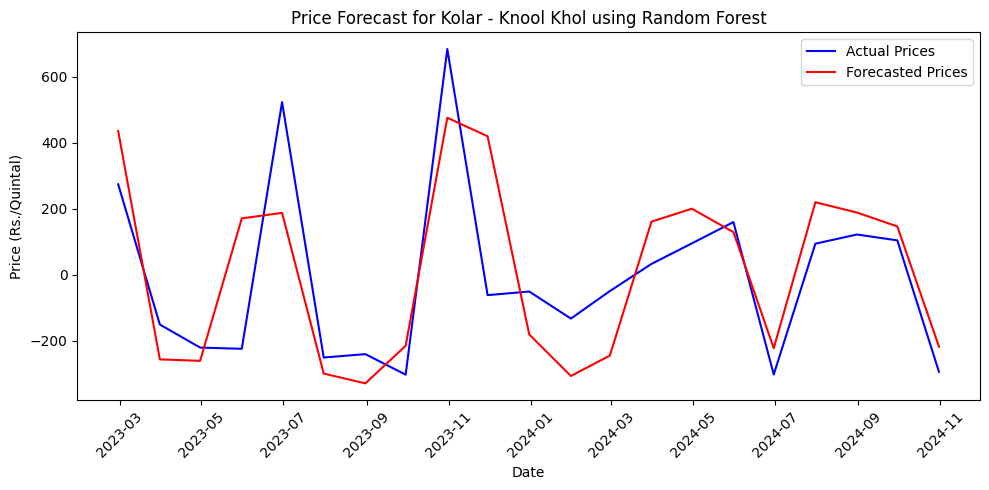

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


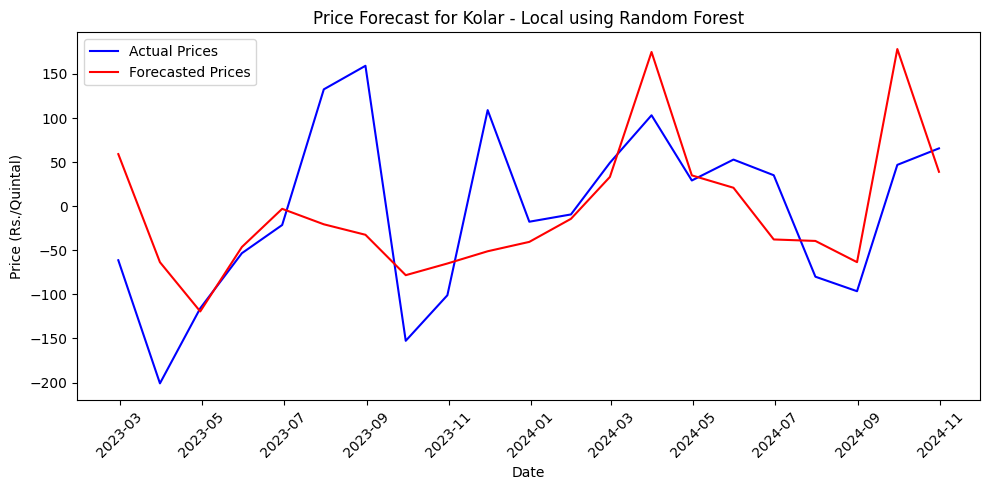

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


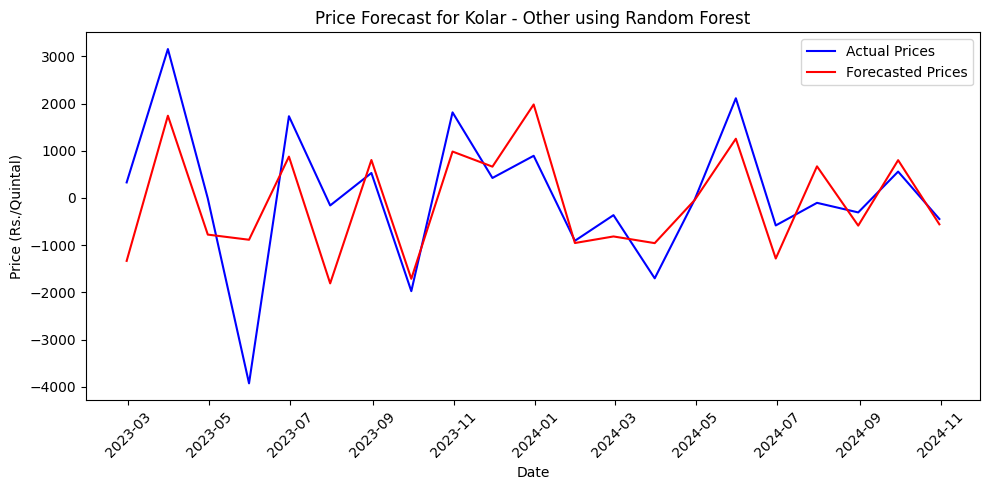

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


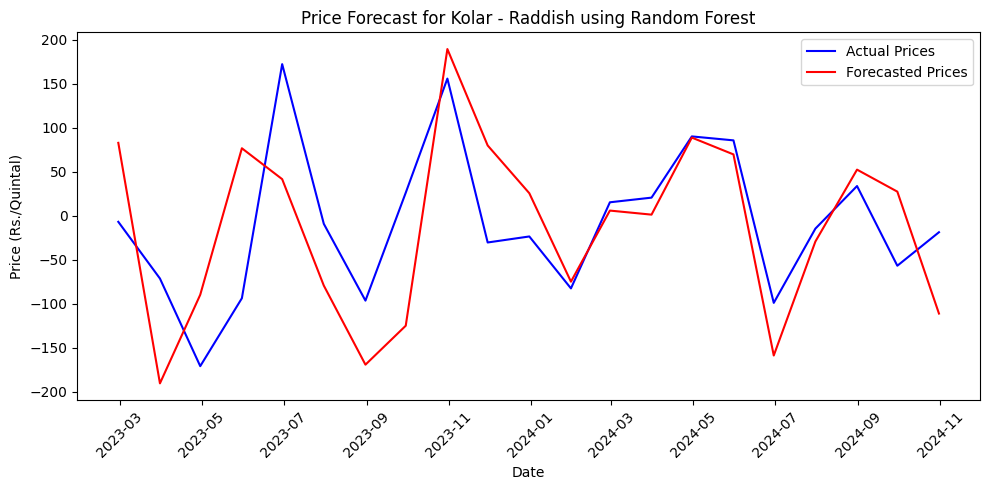

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


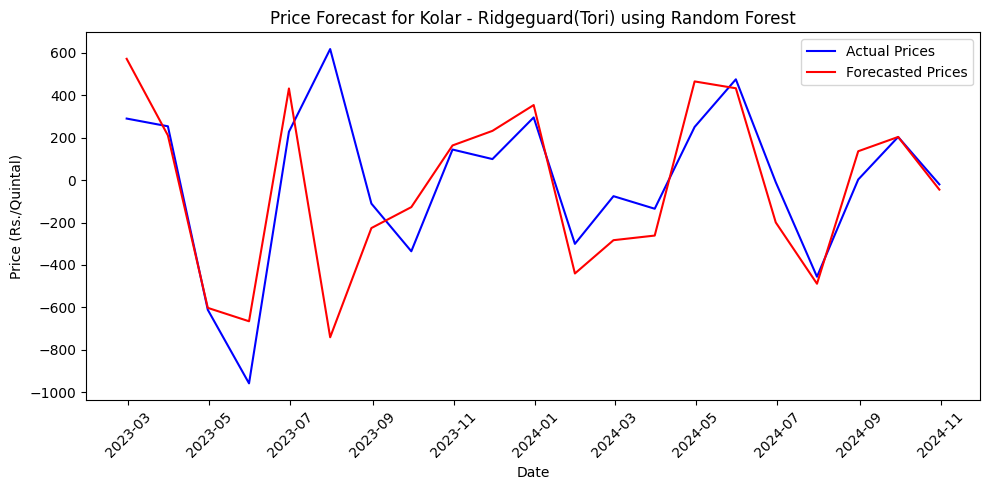

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


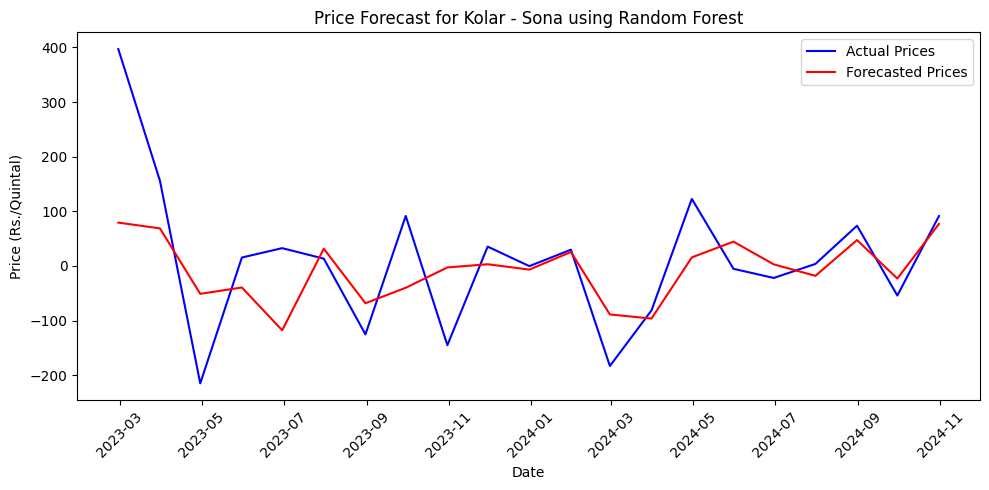

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


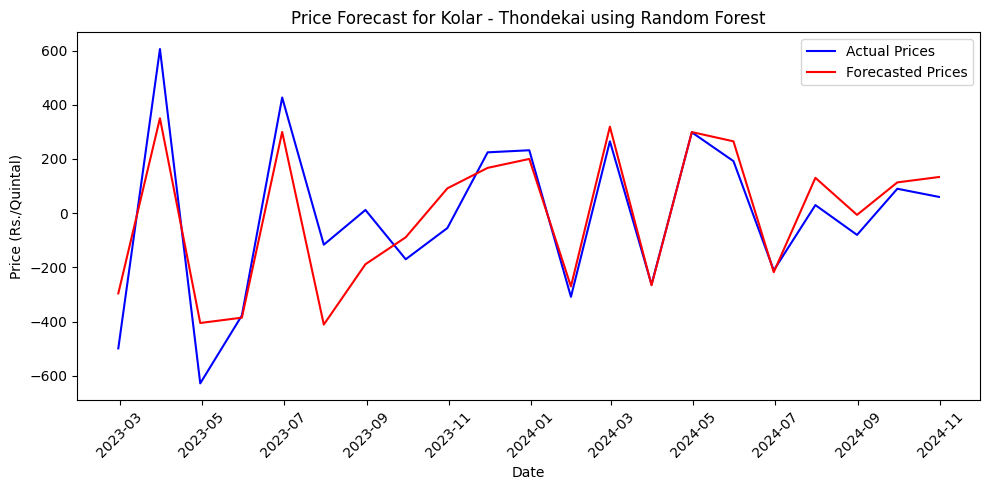

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


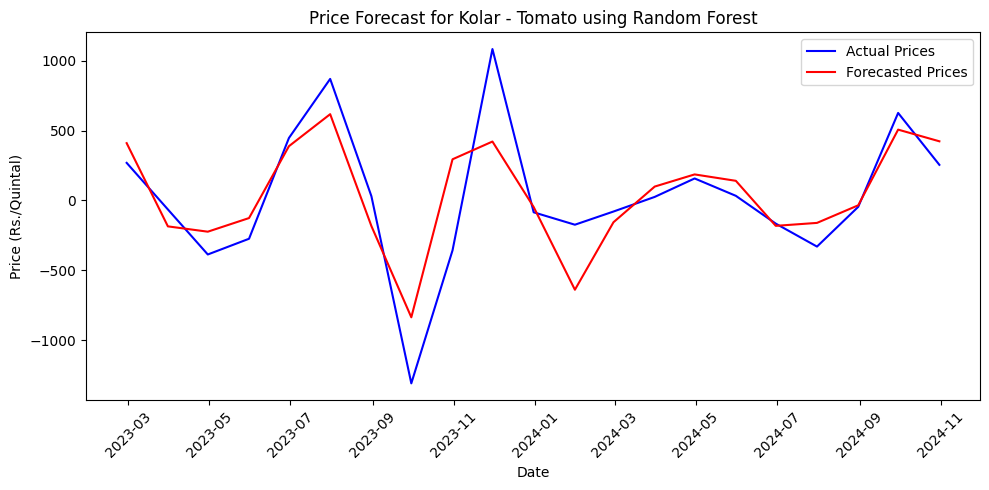

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


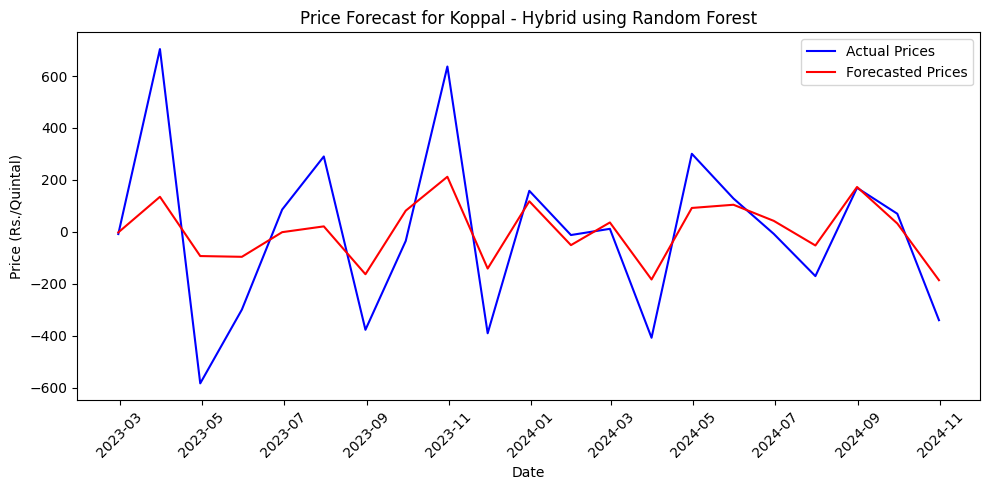

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


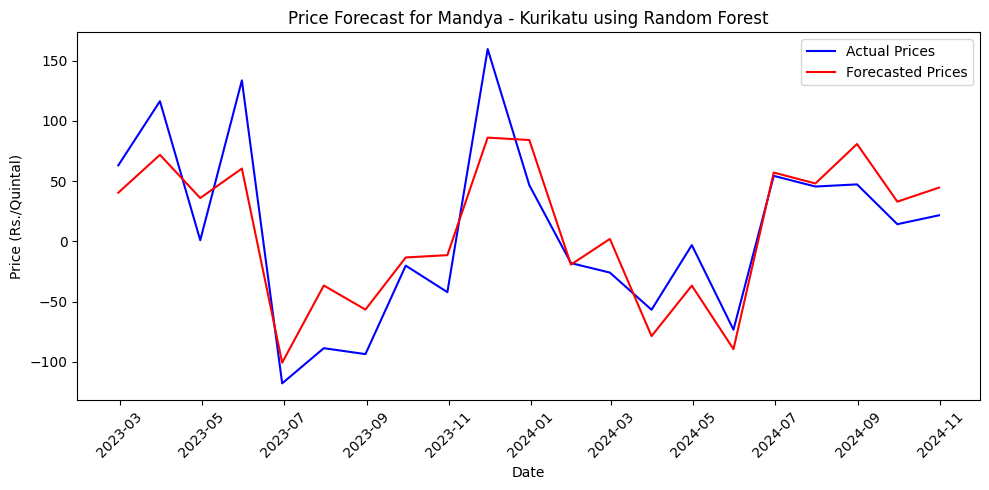

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


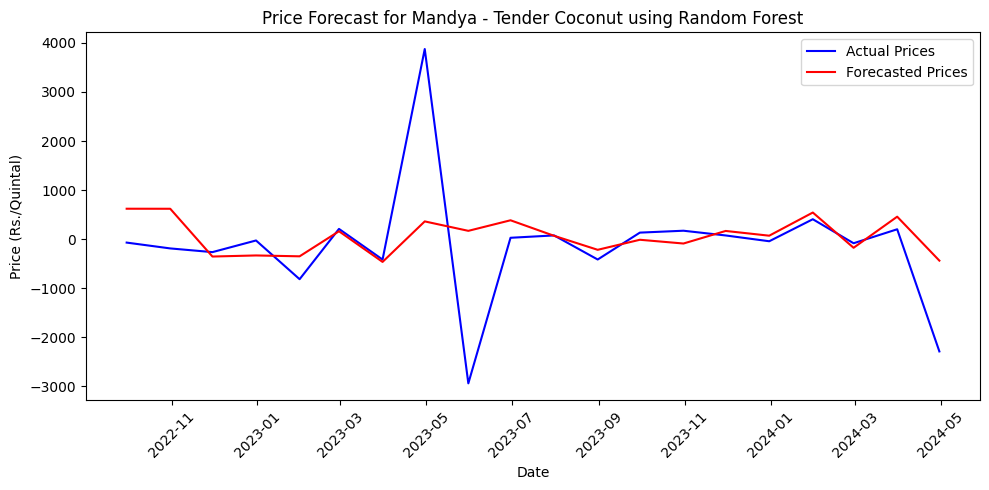

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


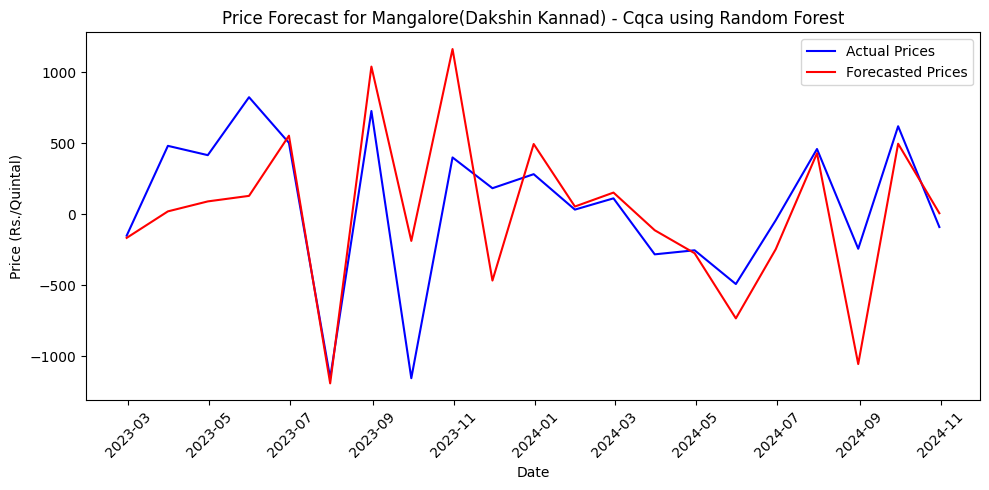

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


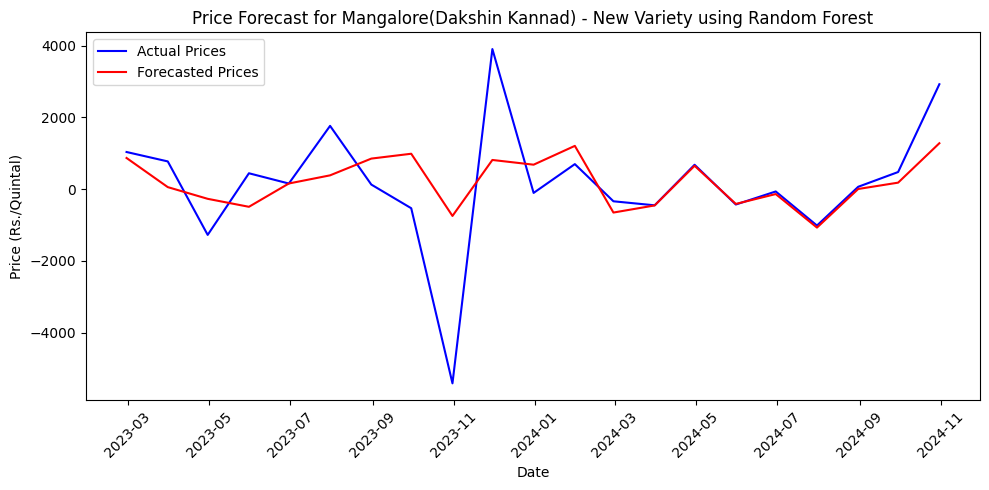

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


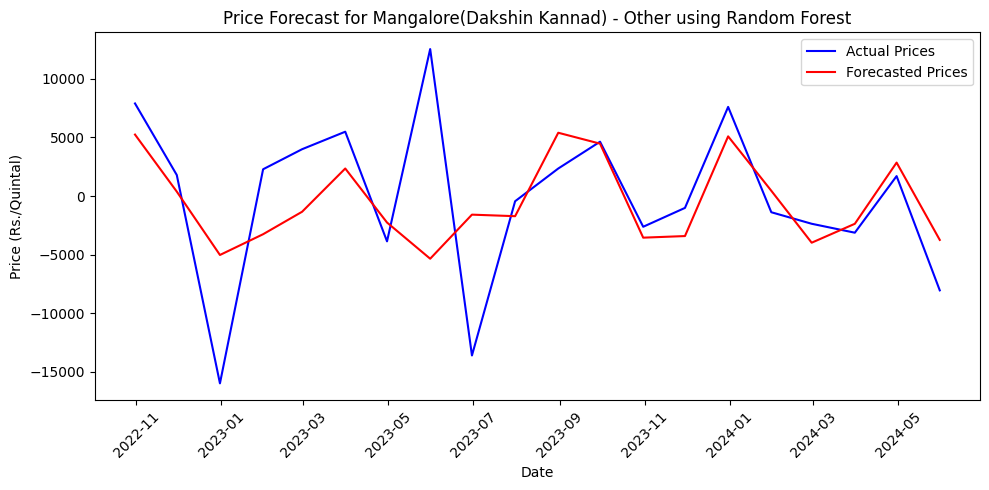

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


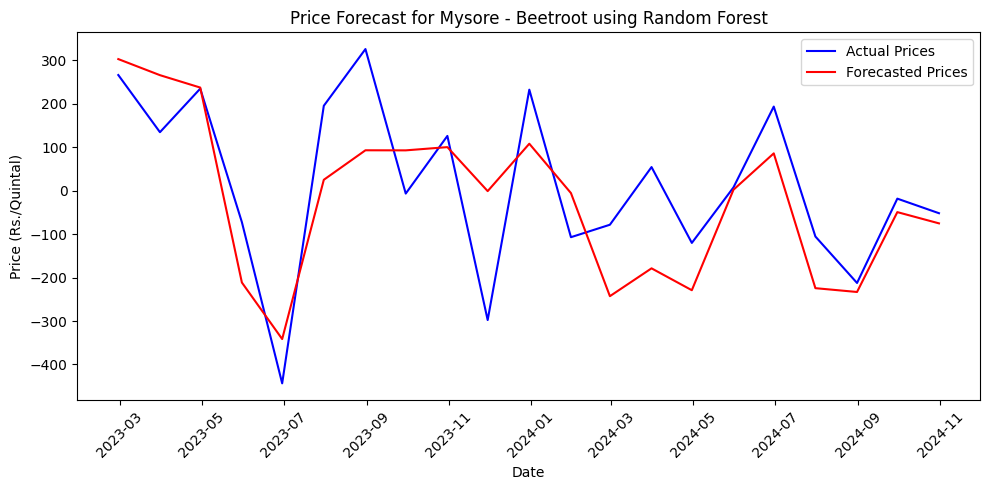

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


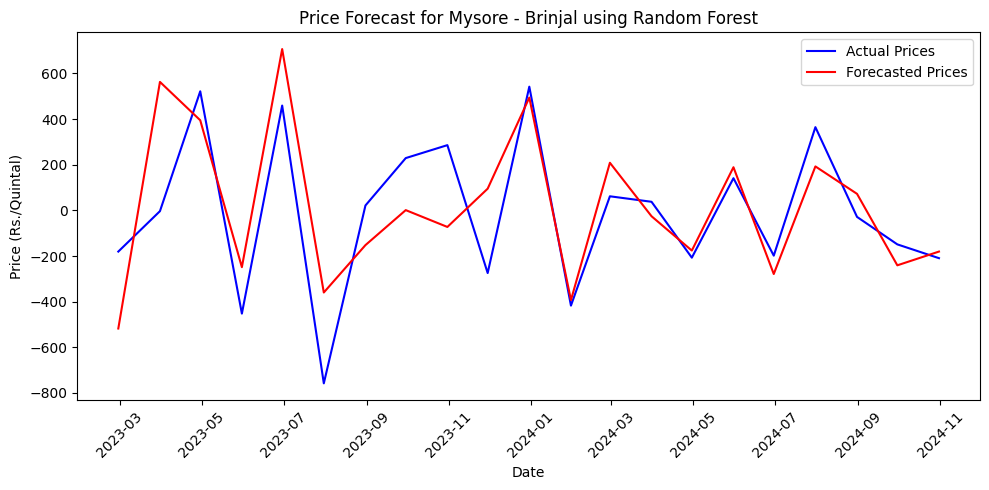

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


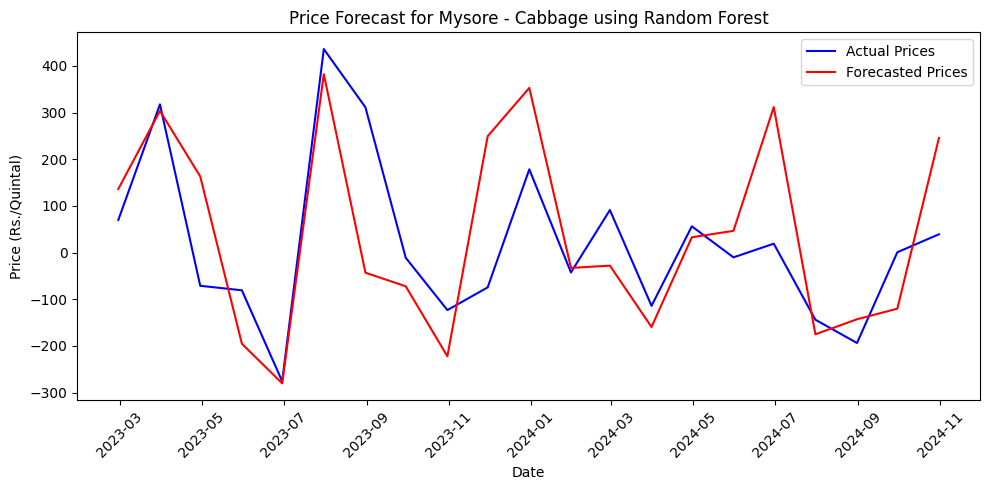

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


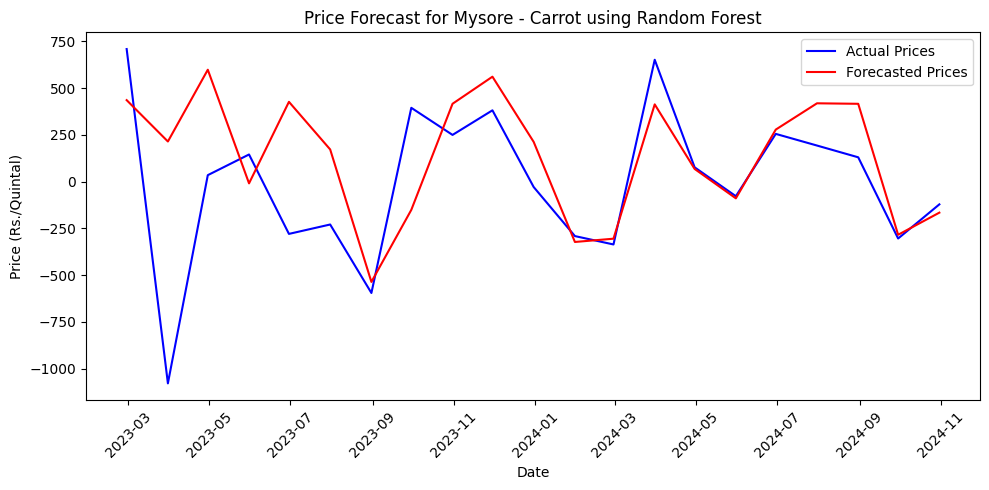

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


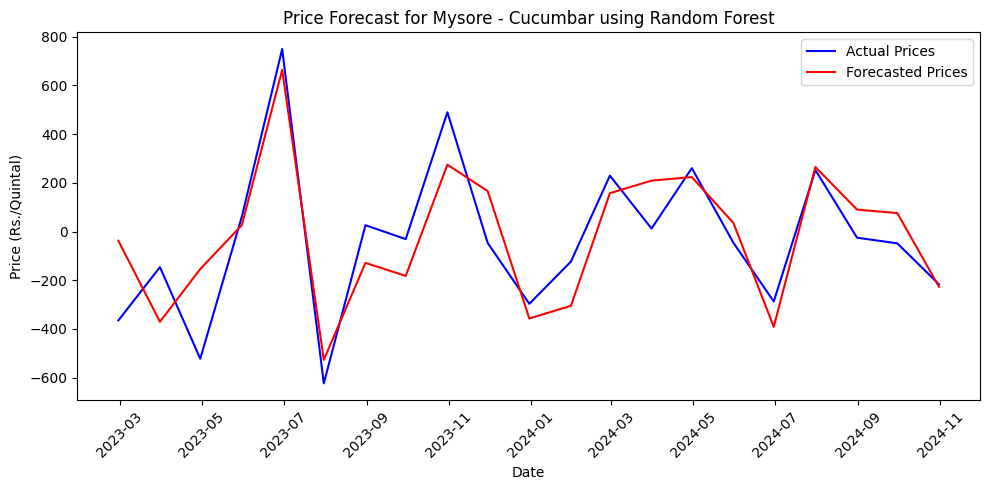

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


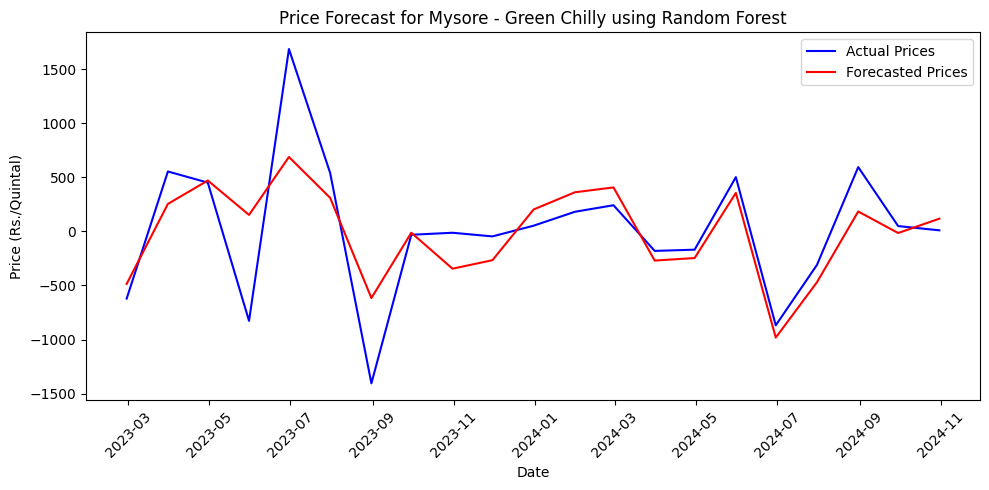

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


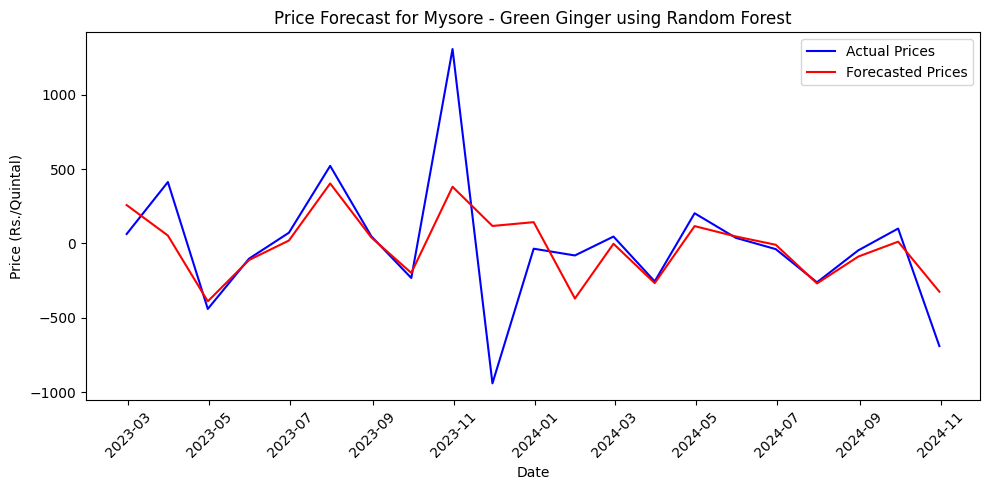

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


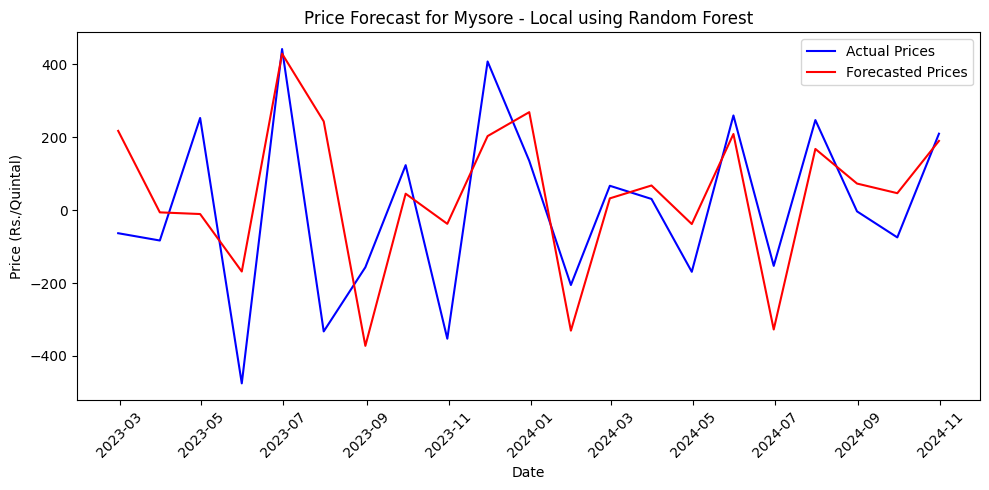

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


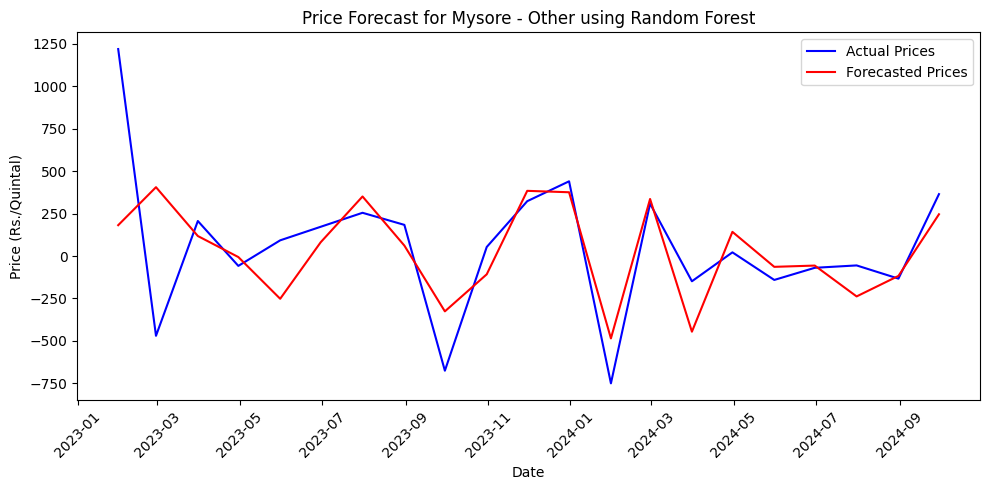

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


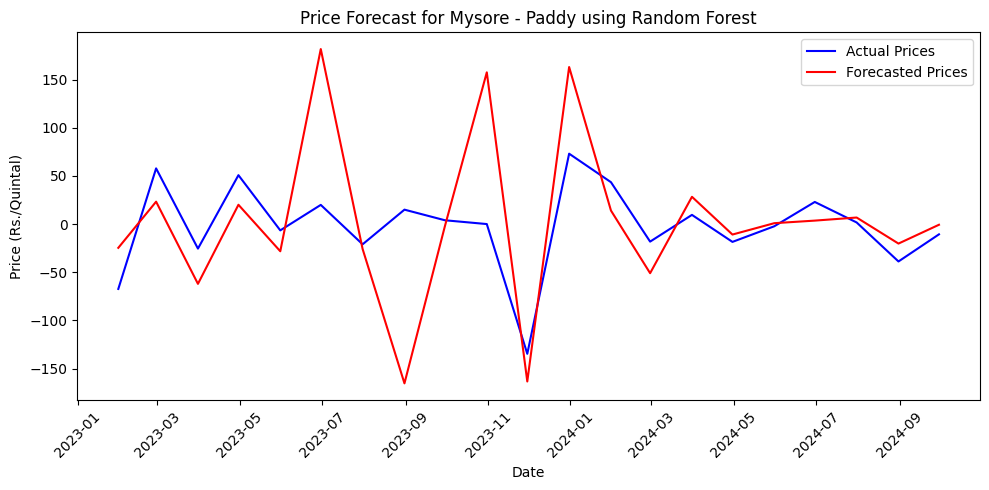

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


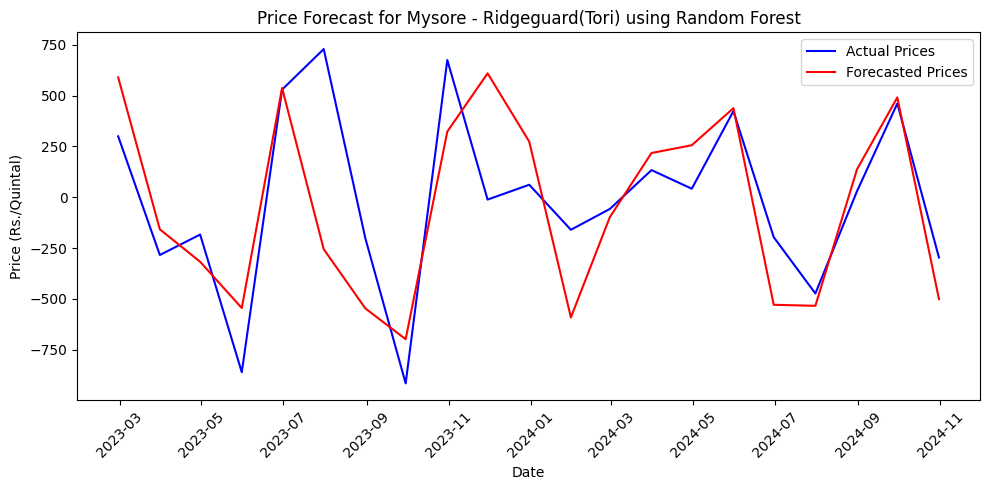

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


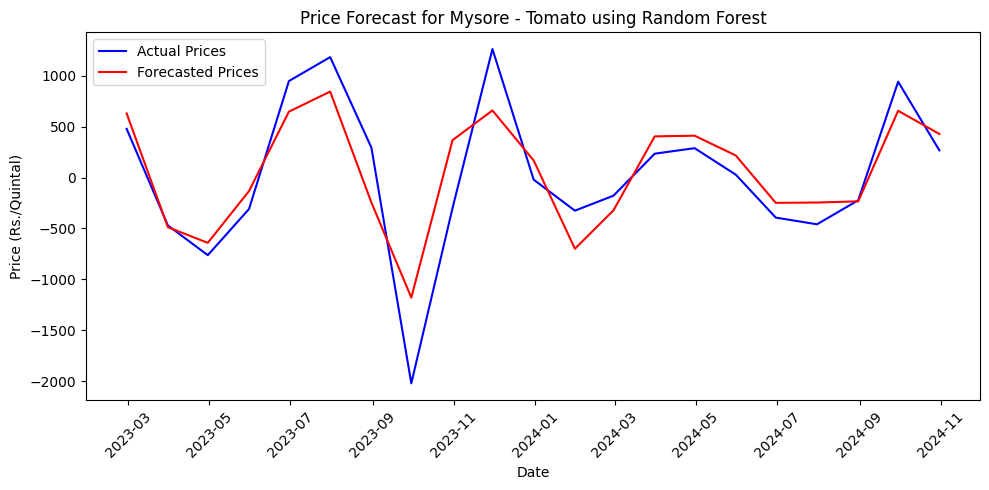

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


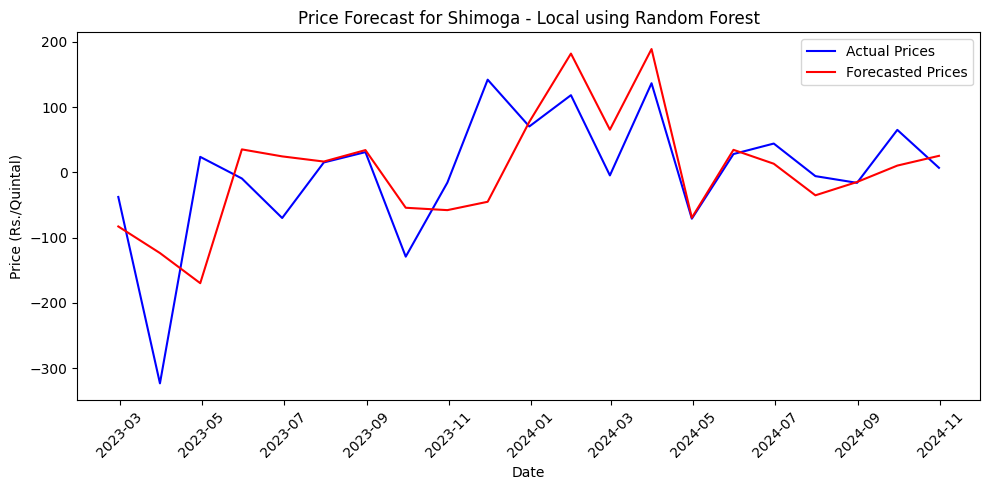

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


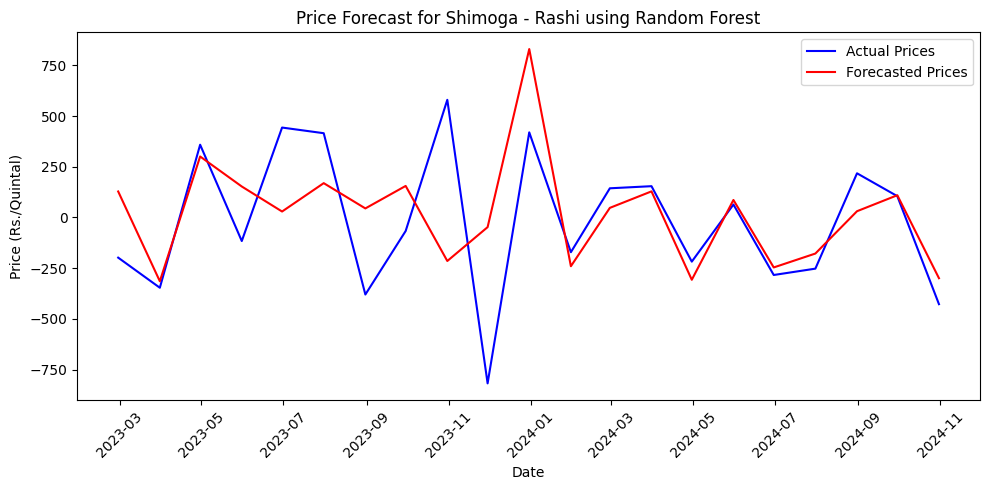

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


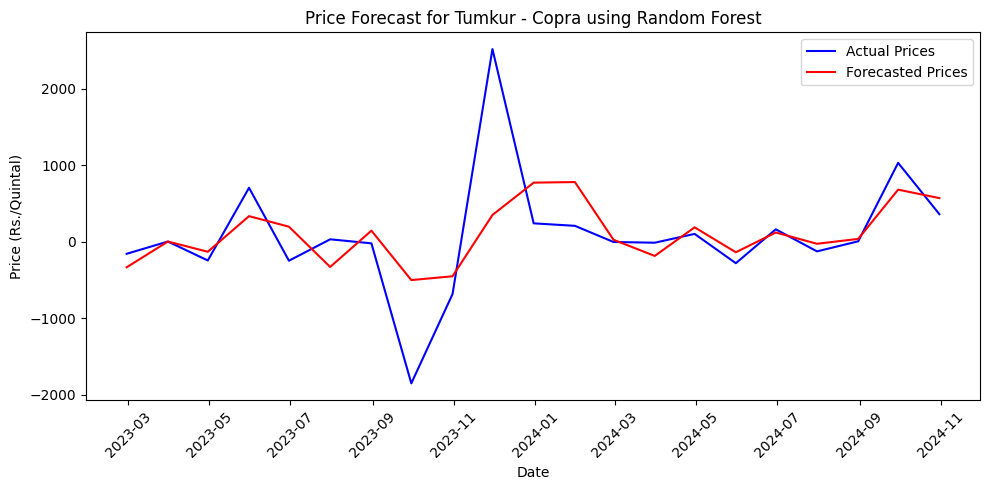

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


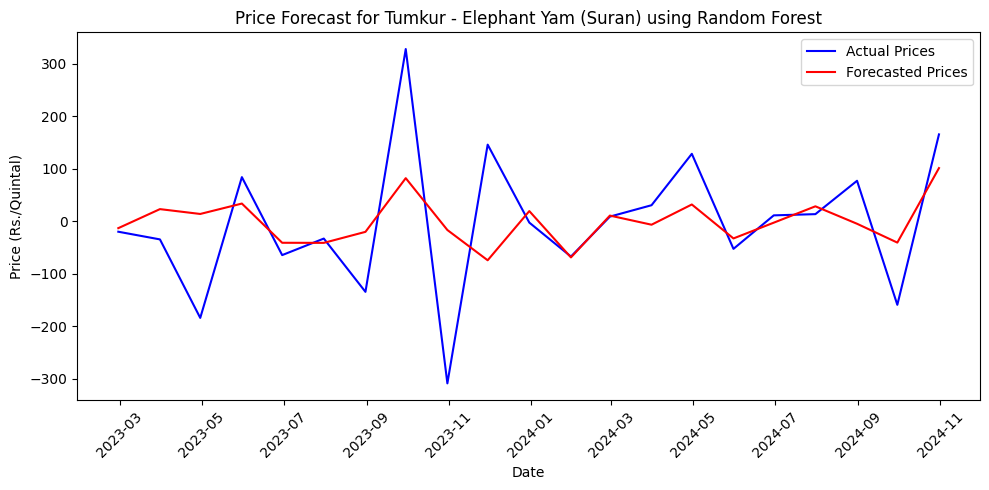

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


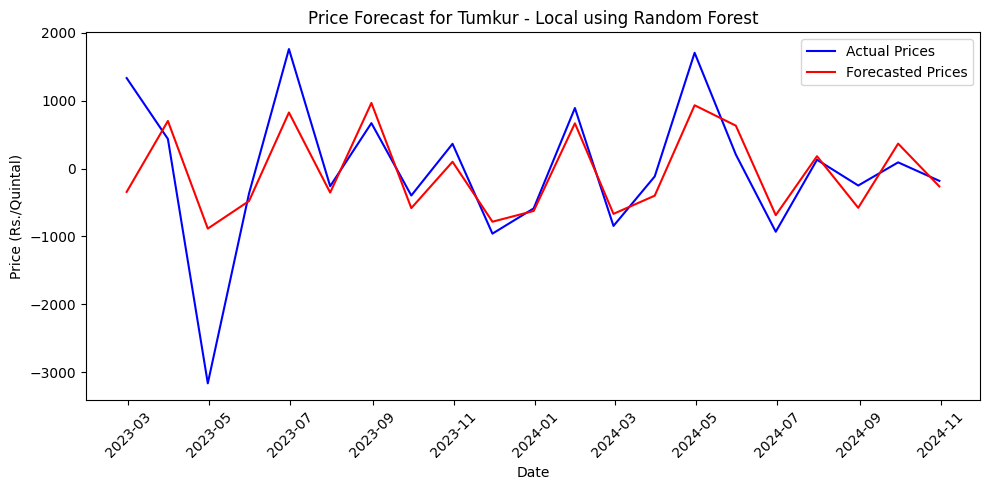

<ipython-input-9-53d1bf74e85a>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  group = group['Capped Price'].resample('M').mean().ffill()


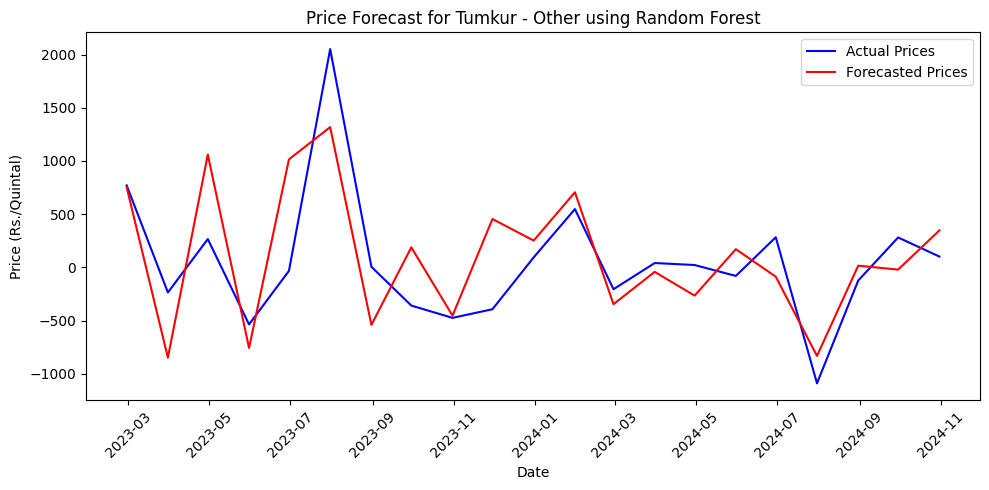

In [9]:
# Initialize a dictionary to store all the models
all_models = {}

# Iterate over each group (district and variety)
for (district, variety), group in grouped:
    # Resample the data to monthly frequency and fill missing values
    group = group['Capped Price'].resample('M').mean().ffill()

    if len(group) < 12:
        print(f"Not enough data for {district} - {variety}. Skipping.")
        continue

    # Decompose the time series using STL
    seasonal_period = 5  # Adjust based on your data frequency
    stl = STL(group, seasonal=seasonal_period)
    decomposition = stl.fit()

    # Get the trend, seasonal, and residual components
    trend = decomposition.trend
    seasonal = decomposition.seasonal

    # Remove trend and seasonality from the original series
    detrended_data = group - trend - seasonal

    # Apply differencing to make the series stationary
    differenced_data = detrended_data.diff().dropna()

    # Apply Min-Max scaling
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(differenced_data.values.reshape(-1, 1))
    scaled_series = pd.Series(scaled_data.flatten(), index=differenced_data.index)

    # Create lag features and rolling statistics
    df = pd.DataFrame({'Value': scaled_series})
    for lag in range(1, 13):  # Create lag features for the past 12 months
        df[f'lag_{lag}'] = df['Value'].shift(lag)

    # Add rolling features
    df['rolling_mean'] = df['Value'].rolling(window=3).mean()
    df['rolling_std'] = df['Value'].rolling(window=3).std()

    # Drop rows with NaN values created by lags and rolling calculations
    df.dropna(inplace=True)

    # Split the data into features (X) and target (y)
    X = df.drop(columns=['Value'])
    y = df['Value']

    # Split into training and testing sets
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Train a Random Forest model
    model = RandomForestRegressor(n_estimators=150, max_depth=20, random_state=42)
    model.fit(X_train, y_train)

    # Store the model and scaler in the dictionary
    all_models[(district, variety)] = {
        'model': model,
        'scaler': scaler
    }

    # Make predictions
    y_pred = model.predict(X_test)

    # Inverse transform the predictions and target to their original scale
    y_pred_inverse = scaler.inverse_transform(y_pred.reshape(-1, 1)).flatten()
    y_test_inverse = scaler.inverse_transform(y_test.values.reshape(-1, 1)).flatten()

    # Store the forecast results along with their dates
    forecast_results[(district, variety)] = {
        'Date': y_test.index,
        'Forecast': y_pred_inverse
    }

    # Calculate performance metrics
    mae = mean_absolute_error(y_test_inverse, y_pred_inverse)
    mse = mean_squared_error(y_test_inverse, y_pred_inverse)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_inverse, y_pred_inverse)

    # Store metrics for the district and variety
    performance_metrics[(district, variety)] = {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2
    }

    # Optional: Plot the results
    plt.figure(figsize=(10, 5))
    plt.plot(y_test.index, y_test_inverse, label='Actual Prices', color='blue')
    plt.plot(y_test.index, y_pred_inverse, label='Forecasted Prices', color='red')
    plt.title(f'Price Forecast for {district} - {variety} using Random Forest')
    plt.xlabel('Date')
    plt.ylabel('Price (Rs./Quintal)')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Save all models to a single PKL file
with open('all_models.pkl', 'wb') as f:
    joblib.dump(all_models, f)

# Convert forecast results to DataFrame for further analysis or export
forecast_dfs = []
for (district, variety), data in forecast_results.items():
    temp_df = pd.DataFrame({
        'District Name': district,
        'Variety': variety,
        'Date': data['Date'],
        'Forecast': data['Forecast']
    })
    forecast_dfs.append(temp_df)

# Combine all the forecast data into one DataFrame
forecast_df = pd.concat(forecast_dfs)
forecast_df.set_index(['District Name', 'Variety', 'Date'], inplace=True)

# Convert performance metrics to DataFrame for easier viewing
performance_df = pd.DataFrame(performance_metrics).T


In [10]:
performance_df

MAE            MSE        RMSE  \
Bagalkot  Hybrid/Local           54.520938    5545.492245   74.468062   
Bangalore Banana - Green        115.245551   19041.613331  137.991352   
          Beans (Whole)           3.282556      15.465732    3.932649   
          Beetroot              162.913577   60719.401400  246.413071   
          Bhindi                246.683048  118268.385508  343.901709   
...                                    ...            ...         ...   
Shimoga   Rashi                 224.017897  101029.904124  317.852016   
Tumkur    Copra                 364.418724  379360.504864  615.922483   
          Elephant Yam (Suran)   80.510634   13828.056442  117.592757   
          Local                 437.473082  494544.968965  703.238913   
          Other                 370.503230  219156.369726  468.141399   

                                      R2  
Bagalkot  Hybrid/Local          0.158396  
Bangalore Banana - Green        0.366794  
          Beans (Whole)         0.645270  
          Beetroot             -0.375739  
          Bhindi                0.517266  
...                                  ...  
Shimoga   Rashi                 0.153712  
Tumkur    Copra                 0.345032  
          Elephant Yam (Suran)  0.223991  
          Local                 0.542753  
          Other                 0.379359  

[113 rows x 4 columns]

In [11]:
from google.colab import files

# Download the PKL file from Colab
files.download('all_models.pkl')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>